<a href="https://colab.research.google.com/github/malhar2460/Dropout_ratio_EDA/blob/main/Dropout_ratio_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Importing dependencies

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer
from sklearn.experimental import enable_iterative_imputer #For some reason this needs to be imported for iterative imputer
from sklearn.impute import SimpleImputer, MissingIndicator, KNNImputer, IterativeImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, train_test_split
import statsmodels.api as sm

##Importing data

In [ ]:
dropout_ratio = pd.read_csv('/content/dropout-ratio-2012-2015.csv')

#Asking 7 basic questions about data


##1. How big is the data?

In [ ]:
dropout_ratio.shape

(110, 14)

##2. How does the data look like

In [ ]:
dropout_ratio.head()

,State_UT,year,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
0,A & N Islands,2012-13,0.83,0.51,0.68,Uppe_r_Primary,1.09,1.23,5.57,5.55,5.56,17.66,10.15,14.14
1,A & N Islands,2013-14,1.35,1.06,1.21,NR,1.54,0.51,8.36,5.98,7.2,18.94,12.2,15.87
2,A & N Islands,2014-15,0.47,0.55,0.51,1.44,1.95,1.69,11.47,8.16,9.87,21.05,12.21,16.93
3,Andhra Pradesh,2012-13,3.3,3.05,3.18,3.21,3.51,3.36,12.21,13.25,12.72,2.66,NR,0.35
4,Andhra Pradesh,2013-14,4.31,4.39,4.35,3.46,4.12,3.78,11.95,13.37,12.65,12.65,10.85,11.79


In [ ]:
dropout_ratio.sample(5)

,State_UT,year,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
51,Kerala,2012-13,NR,NR,NR,NR,NR,NR,12.31,6.38,9.45,NR,NR,NR
10,Assam,2013-14,8.19,6.68,7.44,7.6,6.54,7.05,28.59,32.1,30.43,7.62,6.83,7.24
78,Puducherry,2012-13,0.25,0.43,0.34,0.33,1.05,0.68,18.49,11.72,15.21,6.79,3.87,5.25
82,Punjab,2013-14,1.35,1.21,1.29,2.52,3.27,2.85,8.93,8.71,8.83,7.87,3.2,5.81
29,Delhi,2014-15,NR,NR,NR,0.95,0.55,0.76,13.55,9.8,11.81,20.91,13.15,17.32


##3. What is the datatypes of the columns

In [ ]:
dropout_ratio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   State_UT             110 non-null    object
 1   year                 110 non-null    object
 2   Primary_Boys         110 non-null    object
 3   Primary_Girls        110 non-null    object
 4   Primary_Total        110 non-null    object
 5   Upper Primary_Boys   110 non-null    object
 6   Upper Primary_Girls  110 non-null    object
 7   Upper Primary_Total  110 non-null    object
 8   Secondary _Boys      110 non-null    object
 9   Secondary _Girls     110 non-null    object
 10  Secondary _Total     110 non-null    object
 11  HrSecondary_Boys     110 non-null    object
 12  HrSecondary_Girls    110 non-null    object
 13  HrSecondary_Total    110 non-null    object
dtypes: object(14)
memory usage: 12.2+ KB


##4. Are there any missing values

In [ ]:
dropout_ratio.isnull().sum()

State_UT               0
year                   0
Primary_Boys           0
Primary_Girls          0
Primary_Total          0
Upper Primary_Boys     0
Upper Primary_Girls    0
Upper Primary_Total    0
Secondary _Boys        0
Secondary _Girls       0
Secondary _Total       0
HrSecondary_Boys       0
HrSecondary_Girls      0
HrSecondary_Total      0
dtype: int64

In [ ]:
'There might not be any NaN values but there is a value NR that is considered missing in this data set so lets handle this'
dropout_ratio = dropout_ratio.replace({'NR':np.nan})
'There is another random value upper_r_primary value'
dropout_ratio = dropout_ratio.replace({'Uppe_r_Primary':np.nan})

In [ ]:
dropout_ratio.isnull().sum()

State_UT                0
year                    0
Primary_Boys           15
Primary_Girls          15
Primary_Total          17
Upper Primary_Boys     17
Upper Primary_Girls     8
Upper Primary_Total     9
Secondary _Boys         4
Secondary _Girls        4
Secondary _Total        4
HrSecondary_Boys       28
HrSecondary_Girls      34
HrSecondary_Total      31
dtype: int64

##5. Are there any duplicated values

In [ ]:
dropout_ratio.duplicated().sum()

0

##6. How does data look mathematically

In [ ]:
dropout_ratio.describe()

,State_UT,year,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
count,110,110,95,95,93,93,102,101,106,106,106,82,76,79
unique,40,3,92,86,86,89,96,95,105,106,105,80,75,77
top,A & N Islands,2013-14,1.35,1.06,1.29,0.89,4.01,2.78,25.21,5.55,15.89,13.24,8.49,3.41
freq,3,37,2,4,2,2,2,3,2,1,2,2,2,2


In [ ]:
# 'The data is not in right format which we saw in the column data types'
dropout_ratio.iloc[:,2:] = dropout_ratio.iloc[:,2:].astype(float)
dropout_ratio.iloc[:,2:].apply(pd.to_numeric)
dropout_ratio = dropout_ratio.infer_objects()
dropout_ratio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   State_UT             110 non-null    object 
 1   year                 110 non-null    object 
 2   Primary_Boys         95 non-null     float64
 3   Primary_Girls        95 non-null     float64
 4   Primary_Total        93 non-null     float64
 5   Upper Primary_Boys   93 non-null     float64
 6   Upper Primary_Girls  102 non-null    float64
 7   Upper Primary_Total  101 non-null    float64
 8   Secondary _Boys      106 non-null    float64
 9   Secondary _Girls     106 non-null    float64
 10  Secondary _Total     106 non-null    float64
 11  HrSecondary_Boys     82 non-null     float64
 12  HrSecondary_Girls    76 non-null     float64
 13  HrSecondary_Total    79 non-null     float64
dtypes: float64(12), object(2)
memory usage: 12.2+ KB


In [ ]:
dropout_ratio

,State_UT,year,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
0,A & N Islands,2012-13,0.83,0.51,0.68,NaN,1.09,1.23,5.57,5.55,5.56,17.66,10.15,14.14
1,A & N Islands,2013-14,1.35,1.06,1.21,NaN,1.54,0.51,8.36,5.98,7.20,18.94,12.20,15.87
2,A & N Islands,2014-15,0.47,0.55,0.51,1.44,1.95,1.69,11.47,8.16,9.87,21.05,12.21,16.93
3,Andhra Pradesh,2012-13,3.30,3.05,3.18,3.21,3.51,3.36,12.21,13.25,12.72,2.66,NaN,0.35
4,Andhra Pradesh,2013-14,4.31,4.39,4.35,3.46,4.12,3.78,11.95,13.37,12.65,12.65,10.85,11.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,West Bengal,2013-14,3.44,2.37,2.91,5.63,3.10,4.31,16.73,19.77,18.34,8.03,7.76,7.90
106,West Bengal,2014-15,2.13,0.79,1.47,5.84,2.88,4.30,16.33,19.06,17.80,8.18,8.04,8.11
107,All India,2012-13,4.68,4.66,4.67,2.30,4.01,3.13,14.54,14.54,14.54,NaN,NaN,NaN
108,All India,2013-14,4.53,4.14,4.34,3.09,4.49,3.77,17.93,17.79,17.86,1.48,1.61,1.54


In [ ]:
dropout_ratio.describe()

,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
count,95.000000,95.000000,93.000000,93.000000,102.000000,101.000000,106.000000,106.000000,106.000000,82.000000,76.000000,79.000000
mean,4.971368,4.644105,4.908602,4.236667,4.496471,4.181089,17.809906,16.926981,17.393868,9.347317,7.206974,8.296329
std,4.683392,4.590296,4.617200,3.286495,3.364940,3.285638,8.435483,9.015808,8.609419,7.160002,5.213958,6.135895
min,0.000000,0.260000,0.200000,0.010000,0.000000,0.070000,5.570000,4.210000,5.320000,0.230000,0.300000,0.350000
25%,1.350000,1.120000,1.290000,2.370000,2.242500,1.790000,11.740000,9.832500,10.587500,3.097500,3.685000,3.375000
50%,3.630000,3.250000,3.580000,3.490000,3.855000,3.800000,16.340000,15.290000,15.445000,8.290000,5.850000,7.640000
75%,7.000000,6.635000,6.790000,5.630000,6.122500,5.550000,23.342500,22.540000,23.345000,13.422500,9.715000,11.520000
max,24.270000,23.930000,24.110000,19.350000,19.210000,19.280000,50.090000,49.620000,49.860000,44.380000,36.050000,40.480000


##7. What is the correlation between variables


In [ ]:
'I think this is meaning less since person levaing high school will not depend or correlate with person leaving secondary'
dropout_ratio.corr()

<ipython-input-15-e4a4543171b6>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  dropout_ratio.corr()


,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
Primary_Boys,1.000000,0.983313,0.996173,0.771205,0.733174,0.752678,0.141125,0.221514,0.182062,-0.029065,0.108332,0.069992
Primary_Girls,0.983313,1.000000,0.995443,0.759748,0.753302,0.758639,0.128584,0.222306,0.175833,-0.104639,0.044833,-0.009321
Primary_Total,0.996173,0.995443,1.000000,0.768936,0.746807,0.759670,0.135327,0.222088,0.179324,-0.062980,0.069195,0.031189
Upper Primary_Boys,0.771205,0.759748,0.768936,1.000000,0.891445,0.973842,0.361589,0.448162,0.409513,0.019146,0.124515,0.113648
Upper Primary_Girls,0.733174,0.753302,0.746807,0.891445,1.000000,0.970036,0.319622,0.405162,0.366481,-0.102244,-0.027598,-0.025830
Upper Primary_Total,0.752678,0.758639,0.759670,0.973842,0.970036,1.000000,0.375561,0.455653,0.420118,-0.052132,0.040055,0.026806
Secondary _Boys,0.141125,0.128584,0.135327,0.361589,0.319622,0.375561,1.000000,0.947146,0.986647,0.209539,0.260135,0.242945
Secondary _Girls,0.221514,0.222306,0.222088,0.448162,0.405162,0.455653,0.947146,1.000000,0.986684,0.115061,0.213019,0.168837
Secondary _Total,0.182062,0.175833,0.179324,0.409513,0.366481,0.420118,0.986647,0.986684,1.000000,0.166575,0.241476,0.210911
HrSecondary_Boys,-0.029065,-0.104639,-0.062980,0.019146,-0.102244,-0.052132,0.209539,0.115061,0.166575,1.000000,0.863135,0.974317


#EDA

##Univariate Analysis

<Axes: xlabel='year', ylabel='count'>

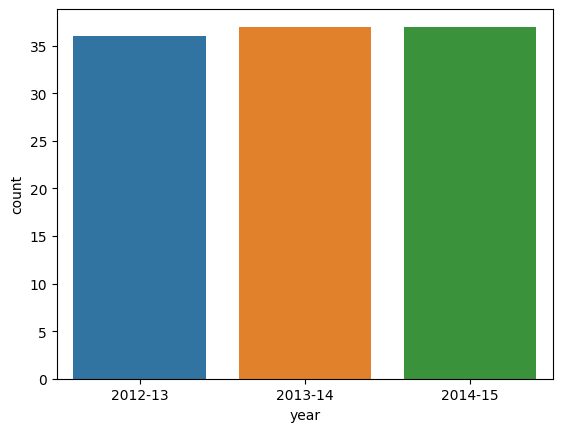

In [ ]:
sns.countplot(dropout_ratio,x='year')

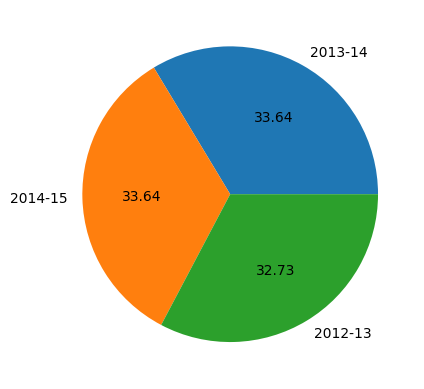

In [ ]:
plt.pie(dropout_ratio['year'].value_counts().values,labels=dropout_ratio['year'].value_counts().index,autopct='%1.2f')
plt.show()

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  plt.title(i)
  sns.histplot(dropout_ratio[i],bins=50)
  plt.show()

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  plt.title(i)
  sns.distplot(dropout_ratio[i],bins=50,hist=False)
  plt.show()

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  print(i)
  sns.boxplot(x=dropout_ratio[i])
  plt.show()

**After doing univariate analysis the conclusion is that there are outliers in every field and the data is left skewed that shows the percentage of dropout is low**

##Bivariate and Multivariate Analysis

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  plt.title(i)
  sns.barplot(x=dropout_ratio['year'],y=dropout_ratio[i])
  plt.show()

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  plt.title(i)
  sns.kdeplot(dropout_ratio[i])
  plt.show()

In [ ]:
'Here the data of secondary looks little normal distributed compared to others but after normalizing or standardizin this might not be the scene'
sns.kdeplot(data=dropout_ratio.iloc[:,2:])

In [ ]:
# sns.pairplot(dropout_ratio,hue='year')

**The kde plot is right skewed meaning all the value are low**

##**Top 5 highest dropout ratio**

In [ ]:
highest_primary_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='Primary_Total',ascending=False).head(5)
highest_upper_primary_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='Upper Primary_Total',ascending=False).head(5)
highest_secondary_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='Secondary _Total',ascending=False).head(5)
highest_Hrs_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='HrSecondary_Total',ascending=False).head(5)

In [ ]:
highest_primary_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='Primary_Total',ascending=False).head(5)
highest_upper_primary_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='Upper Primary_Total',ascending=False).head(5)
highest_secondary_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='Secondary _Total',ascending=False).head(5)
highest_Hrs_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='HrSecondary_Total',ascending=False).head(5)

In [ ]:
highest_primary_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='Primary_Total',ascending=False).head(5)
highest_upper_primary_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='Upper Primary_Total',ascending=False).head(5)
highest_secondary_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='Secondary _Total',ascending=False).head(5)
highest_Hrs_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='HrSecondary_Total',ascending=False).head(5)

**Primary**

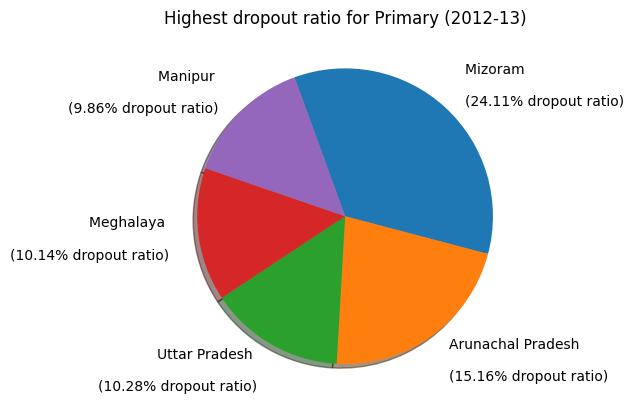

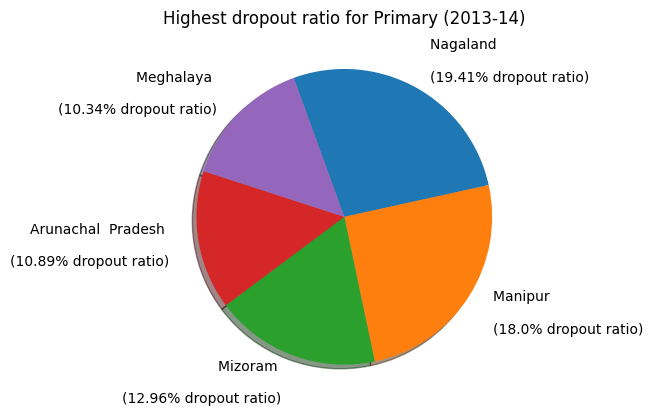

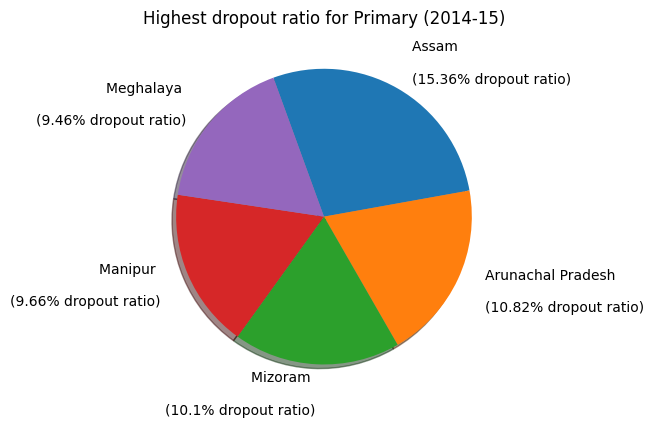

In [ ]:
value = highest_primary_2012_13['Primary_Total'].values
plt.title('Highest dropout ratio for Primary (2012-13)')
plt.pie(highest_primary_2012_13['Primary_Total'],labels=highest_primary_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_primary_2013_14['Primary_Total'].values
plt.title('Highest dropout ratio for Primary (2013-14)')
plt.pie(highest_primary_2013_14['Primary_Total'],labels=highest_primary_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_primary_2014_15['Primary_Total'].values
plt.title('Highest dropout ratio for Primary (2014-15)')
plt.pie(highest_primary_2014_15['Primary_Total'],labels=highest_primary_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()

**Upper primary**

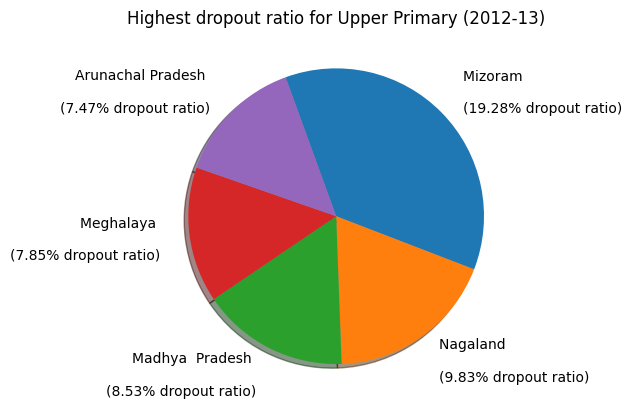

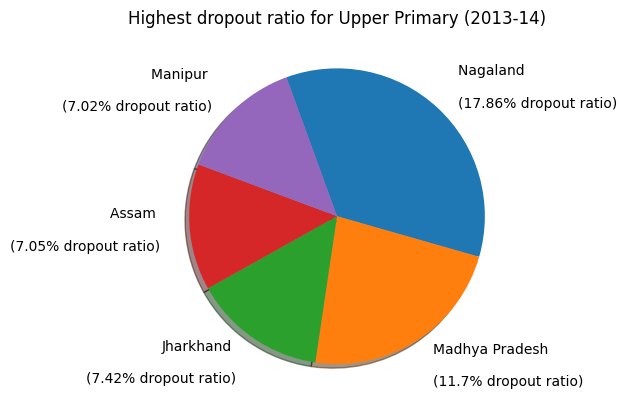

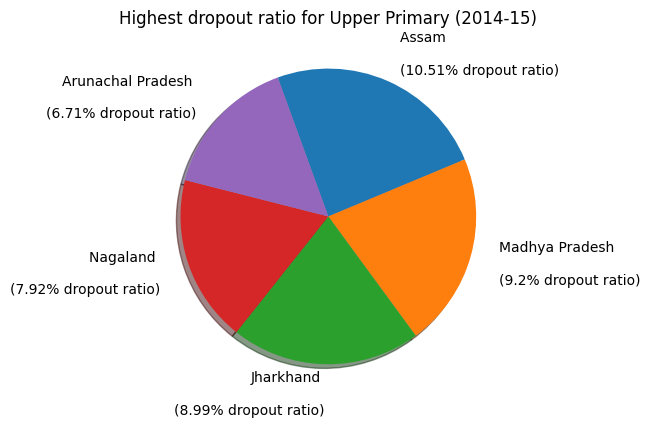

In [ ]:
value = highest_upper_primary_2012_13['Upper Primary_Total'].values
plt.title('Highest dropout ratio for Upper Primary (2012-13)')
plt.pie(highest_upper_primary_2012_13['Upper Primary_Total']\
        ,labels=highest_upper_primary_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_upper_primary_2013_14['Upper Primary_Total'].values
plt.title('Highest dropout ratio for Upper Primary (2013-14)')
plt.pie(highest_upper_primary_2013_14['Upper Primary_Total'],labels=highest_upper_primary_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_upper_primary_2014_15['Upper Primary_Total'].values
plt.title('Highest dropout ratio for Upper Primary (2014-15)')
plt.pie(highest_upper_primary_2014_15['Upper Primary_Total'],labels=highest_upper_primary_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()

**Secondary**

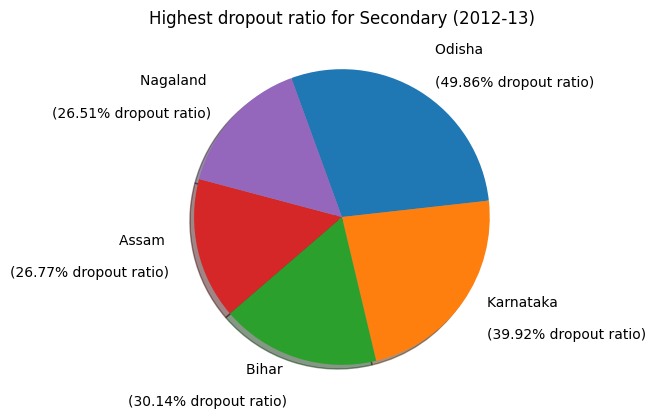

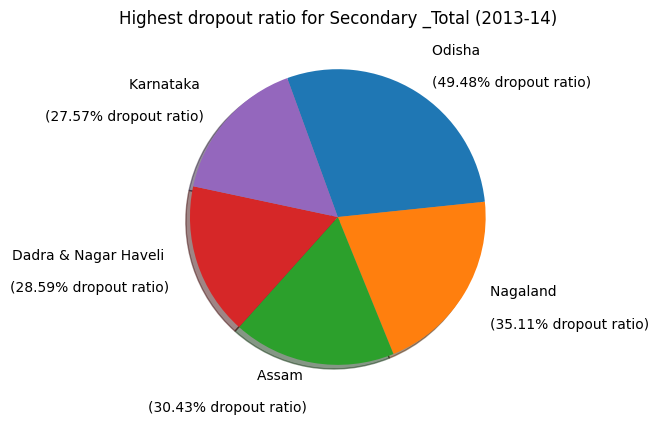

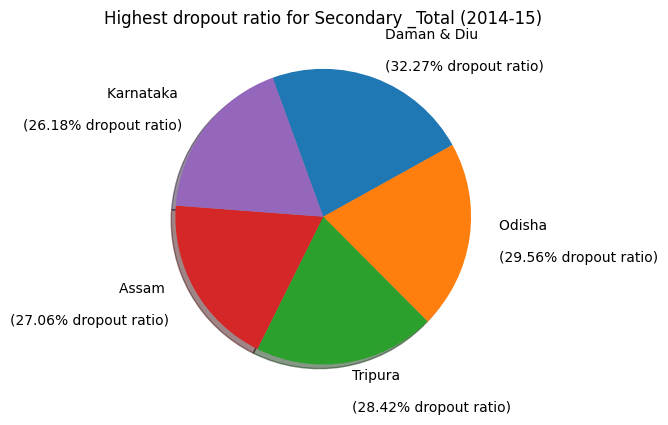

In [ ]:
value = highest_secondary_2012_13['Secondary _Total'].values
plt.title('Highest dropout ratio for Secondary (2012-13)')
plt.pie(highest_secondary_2012_13['Secondary _Total'],labels=highest_secondary_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_secondary_2013_14['Secondary _Total'].values
plt.title('Highest dropout ratio for Secondary _Total (2013-14)')
plt.pie(highest_secondary_2013_14['Secondary _Total'],labels=highest_secondary_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_secondary_2014_15['Secondary _Total'].values
plt.title('Highest dropout ratio for Secondary _Total (2014-15)')
plt.pie(highest_secondary_2014_15['Secondary _Total'],labels=highest_secondary_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()

**HrSecondary**

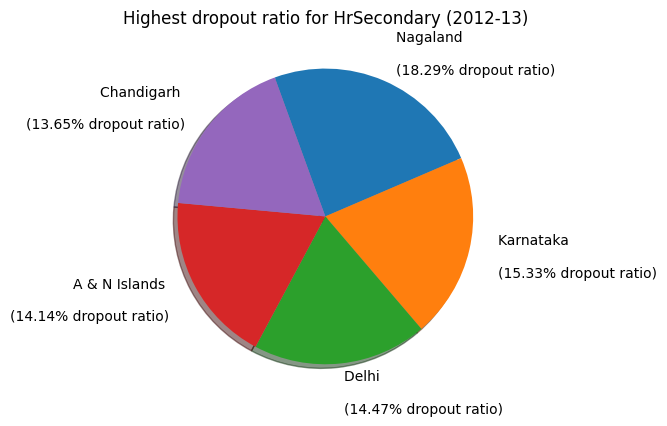

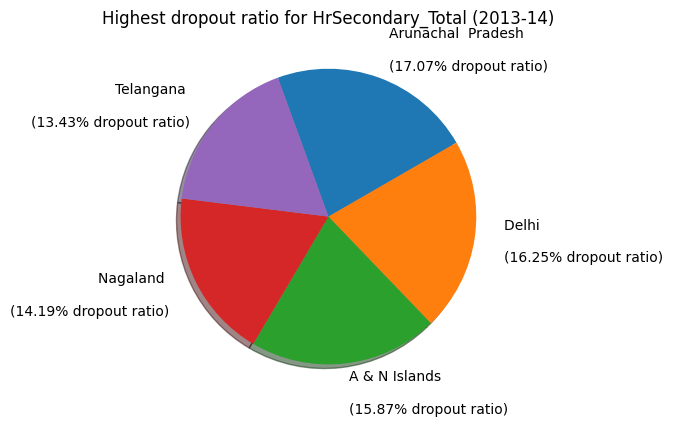

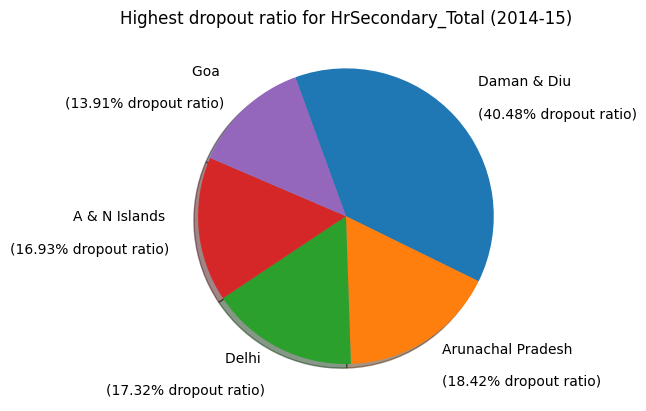

In [ ]:
value = highest_Hrs_2012_13['HrSecondary_Total'].values
plt.title('Highest dropout ratio for HrSecondary (2012-13)')
plt.pie(highest_Hrs_2012_13['HrSecondary_Total'],labels=highest_Hrs_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_Hrs_2013_14['HrSecondary_Total'].values
plt.title('Highest dropout ratio for HrSecondary_Total (2013-14)')
plt.pie(highest_Hrs_2013_14['HrSecondary_Total'],labels=highest_Hrs_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_Hrs_2014_15['HrSecondary_Total'].values
plt.title('Highest dropout ratio for HrSecondary_Total (2014-15)')
plt.pie(highest_Hrs_2014_15['HrSecondary_Total'],labels=highest_Hrs_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.2,shadow=True,counterclock=False,startangle=110)
plt.show()

##**Top 5 lowest dropout ratio**

In [ ]:
lowest_primary_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='Primary_Total',ascending=True).head(5)
lowest_upper_primary_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='Upper Primary_Total',ascending=True).head(5)
lowest_secondary_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='Secondary _Total',ascending=True).head(5)
lowest_Hrs_2012_13 = dropout_ratio[dropout_ratio['year'] == '2012-13'].sort_values(by='HrSecondary_Total',ascending=True).head(5)

In [ ]:
lowest_primary_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='Primary_Total',ascending=True).head(5)
lowest_upper_primary_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='Upper Primary_Total',ascending=True).head(5)
lowest_secondary_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='Secondary _Total',ascending=True).head(5)
lowest_Hrs_2013_14 = dropout_ratio[dropout_ratio['year'] == '2013-14'].sort_values(by='HrSecondary_Total',ascending=True).head(5)

In [ ]:
lowest_primary_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='Primary_Total',ascending=True).head(5)
lowest_upper_primary_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='Upper Primary_Total',ascending=True).head(5)
lowest_secondary_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='Secondary _Total',ascending=True).head(5)
lowest_Hrs_2014_15 = dropout_ratio[dropout_ratio['year'] == '2014-15'].sort_values(by='HrSecondary_Total',ascending=True).head(5)

**Primary**

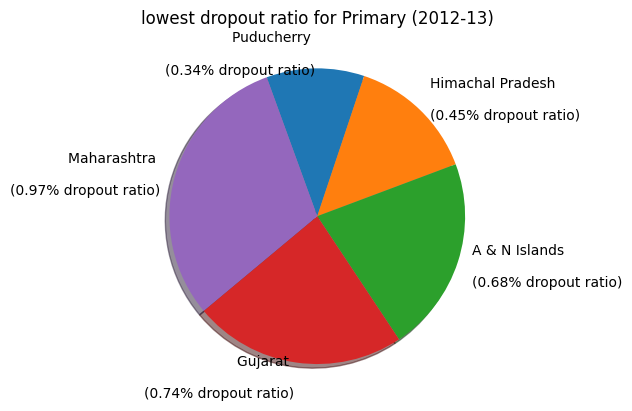

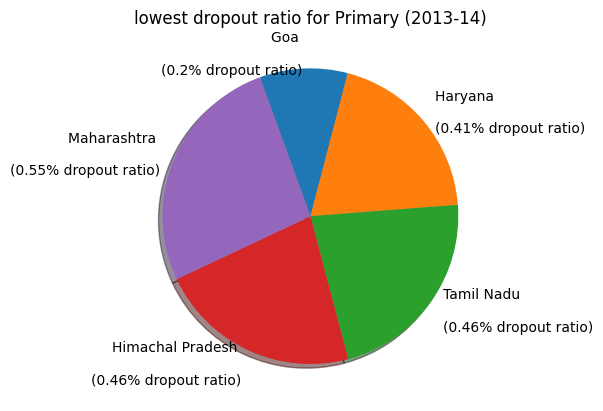

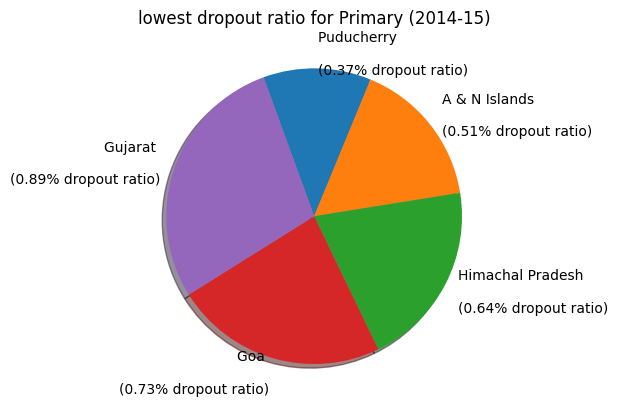

In [ ]:
value = lowest_primary_2012_13['Primary_Total'].values
plt.title('lowest dropout ratio for Primary (2012-13)')
plt.pie(lowest_primary_2012_13['Primary_Total'],labels=lowest_primary_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = lowest_primary_2013_14['Primary_Total'].values
plt.title('lowest dropout ratio for Primary (2013-14)')
plt.pie(lowest_primary_2013_14['Primary_Total'],labels=lowest_primary_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = lowest_primary_2014_15['Primary_Total'].values
plt.title('lowest dropout ratio for Primary (2014-15)')
plt.pie(lowest_primary_2014_15['Primary_Total'],labels=lowest_primary_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()

**Upper primary**

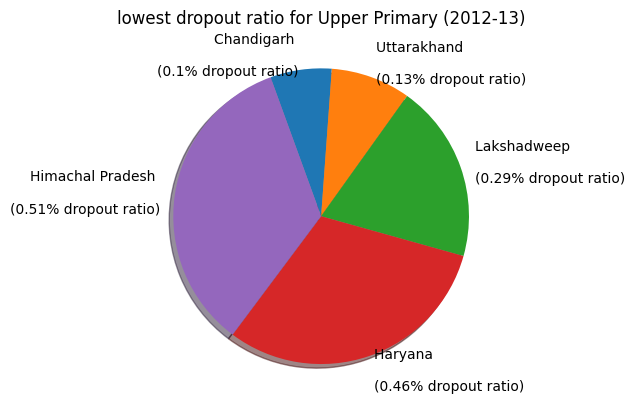

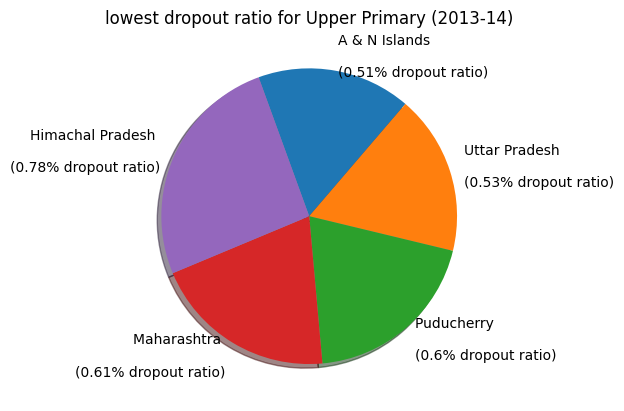

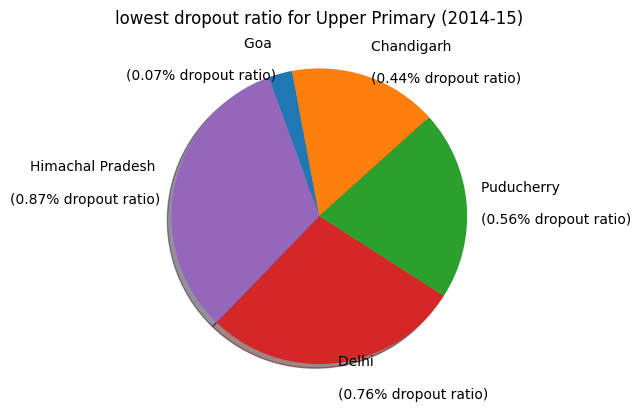

In [ ]:
value = lowest_upper_primary_2012_13['Upper Primary_Total'].values
plt.title('lowest dropout ratio for Upper Primary (2012-13)')
plt.pie(lowest_upper_primary_2012_13['Upper Primary_Total']\
        ,labels=lowest_upper_primary_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = lowest_upper_primary_2013_14['Upper Primary_Total'].values
plt.title('lowest dropout ratio for Upper Primary (2013-14)')
plt.pie(lowest_upper_primary_2013_14['Upper Primary_Total'],labels=lowest_upper_primary_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = lowest_upper_primary_2014_15['Upper Primary_Total'].values
plt.title('lowest dropout ratio for Upper Primary (2014-15)')
plt.pie(lowest_upper_primary_2014_15['Upper Primary_Total'],labels=lowest_upper_primary_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()

**Secondary**

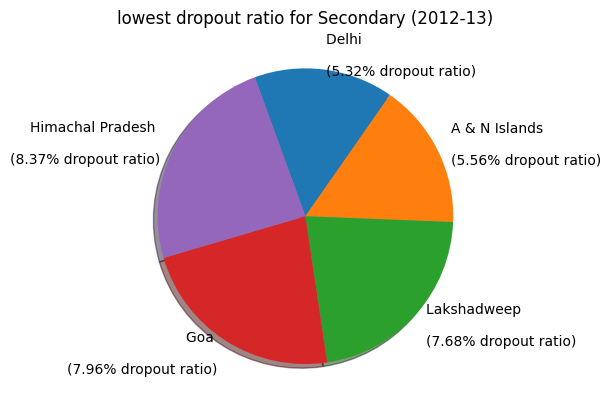

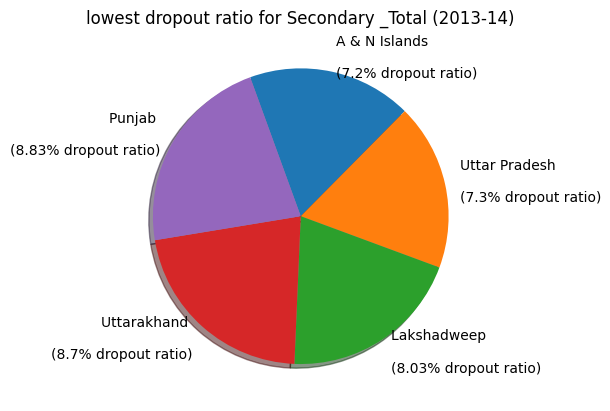

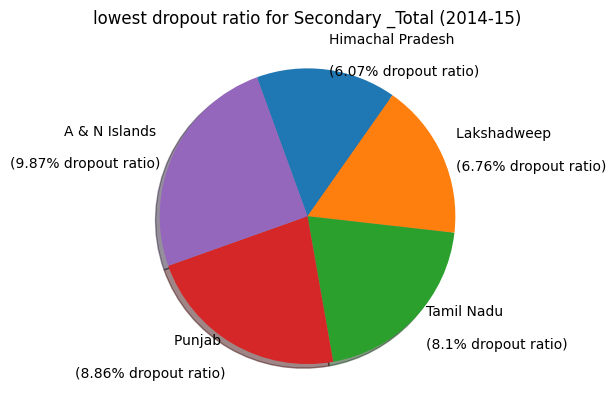

In [ ]:
value = lowest_secondary_2012_13['Secondary _Total'].values
plt.title('lowest dropout ratio for Secondary (2012-13)')
plt.pie(lowest_secondary_2012_13['Secondary _Total'],labels=lowest_secondary_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = lowest_secondary_2013_14['Secondary _Total'].values
plt.title('lowest dropout ratio for Secondary _Total (2013-14)')
plt.pie(lowest_secondary_2013_14['Secondary _Total'],labels=lowest_secondary_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = lowest_secondary_2014_15['Secondary _Total'].values
plt.title('lowest dropout ratio for Secondary _Total (2014-15)')
plt.pie(lowest_secondary_2014_15['Secondary _Total'],labels=lowest_secondary_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()

**HrSecondary**

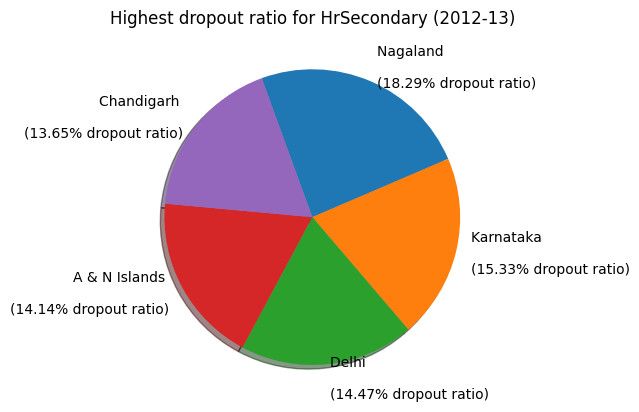

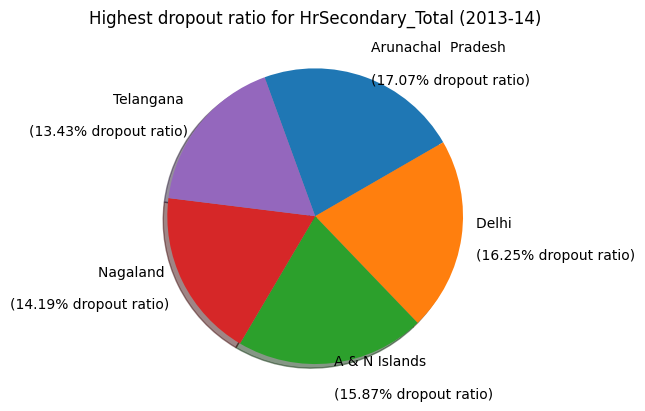

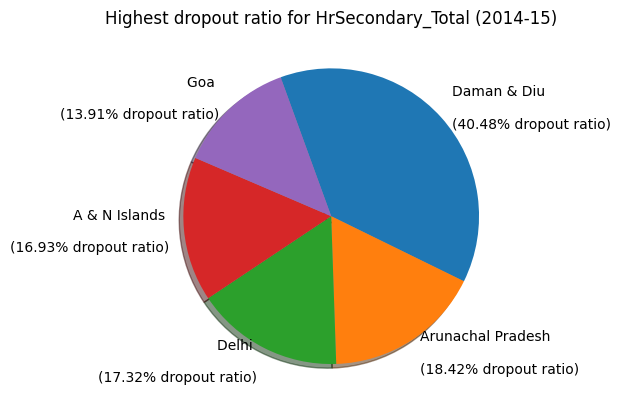

In [ ]:
value = highest_Hrs_2012_13['HrSecondary_Total'].values
plt.title('Highest dropout ratio for HrSecondary (2012-13)')
plt.pie(highest_Hrs_2012_13['HrSecondary_Total'],labels=highest_Hrs_2012_13['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_Hrs_2013_14['HrSecondary_Total'].values
plt.title('Highest dropout ratio for HrSecondary_Total (2013-14)')
plt.pie(highest_Hrs_2013_14['HrSecondary_Total'],labels=highest_Hrs_2013_14['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()
value = highest_Hrs_2014_15['HrSecondary_Total'].values
plt.title('Highest dropout ratio for HrSecondary_Total (2014-15)')
plt.pie(highest_Hrs_2014_15['HrSecondary_Total'],labels=highest_Hrs_2014_15['State_UT'].value_counts().index + " \n\n(" + [str(i) for i in value] \
        + "% dropout ratio)",labeldistance=1.1,shadow=True,counterclock=False,startangle=110)
plt.show()

#Feature Transformation

##Feature scaling

In [ ]:
scaler = StandardScaler()
scaler.fit(dropout_ratio.iloc[:,2:])
pd.DataFrame(scaler.transform(dropout_ratio.iloc[:,2:]))

,0,1,2,3,4,5,6,7,8,9,10,11
0,-0.888958,-0.905396,-0.920801,NaN,-1.017341,-0.902658,-1.457896,-1.267887,-1.381056,1.168134,0.568202,0.958460
1,-0.777338,-0.784943,-0.805390,NaN,-0.882949,-1.122887,-1.125579,-1.219967,-1.189662,1.348005,0.963990,1.242209
2,-0.966233,-0.896636,-0.957819,-0.855570,-0.760503,-0.761957,-0.755146,-0.977021,-0.878063,1.644511,0.965921,1.416067
3,-0.358765,-0.349120,-0.376412,-0.314083,-0.294609,-0.251149,-0.667005,-0.409775,-0.545457,-0.939730,NaN,-1.303331
4,-0.141965,-0.055651,-0.121639,-0.237602,-0.112433,-0.122682,-0.697974,-0.396401,-0.553627,0.464107,0.703349,0.573021
...,...,...,...,...,...,...,...,...,...,...,...,...
105,-0.328713,-0.498044,-0.435206,0.426255,-0.417055,0.039430,-0.128628,0.316835,0.110417,-0.185115,0.106771,-0.065005
106,-0.609909,-0.844074,-0.748774,0.490499,-0.482758,0.036372,-0.176272,0.237710,0.047397,-0.164036,0.160830,-0.030561
107,-0.062543,0.003481,-0.051957,-0.592474,-0.145284,-0.321500,-0.389479,-0.266013,-0.333057,NaN,NaN,NaN
108,-0.094741,-0.110402,-0.123816,-0.350794,-0.001932,-0.125741,0.014304,0.096178,0.054399,-1.105549,-1.080592,-1.108151


##Handling missing values

###CCA - Complete Case Analysis

In [ ]:
dropna_df = dropout_ratio.dropna()

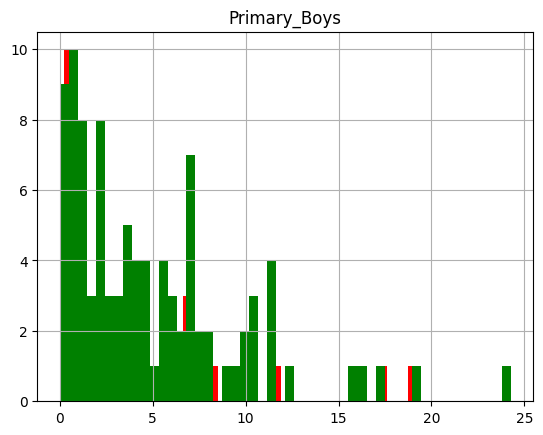

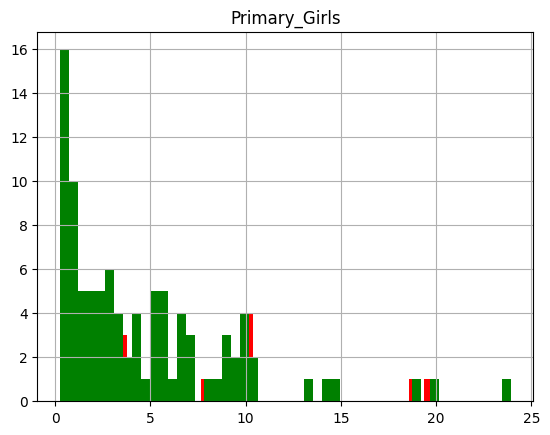

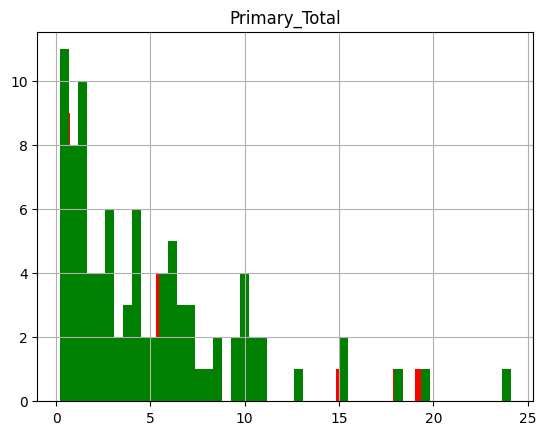

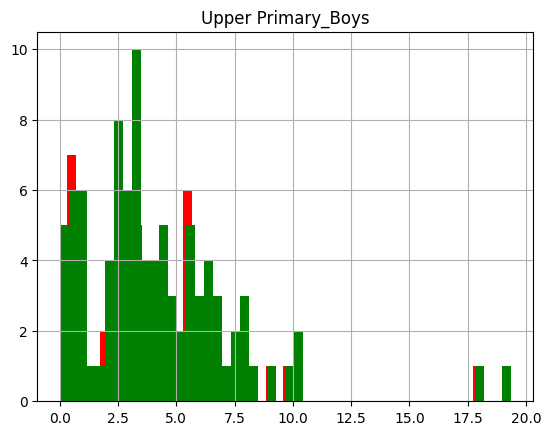

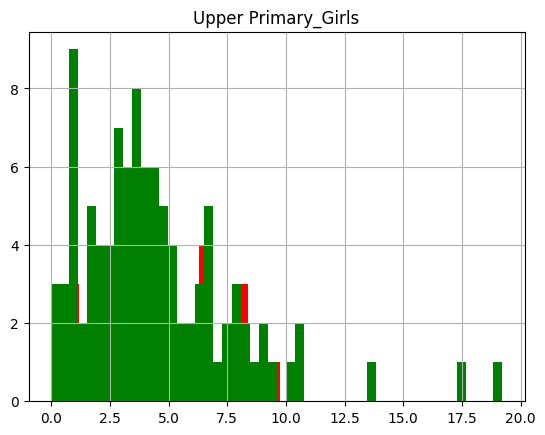

...

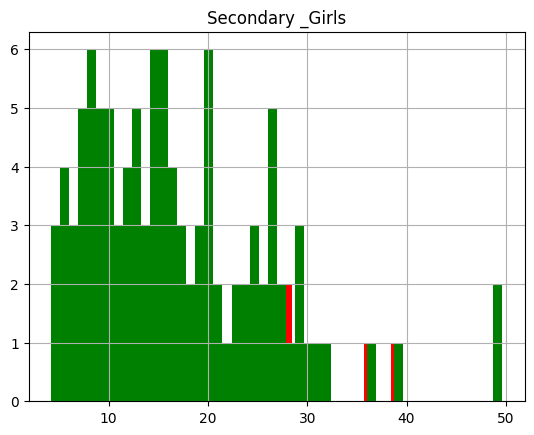

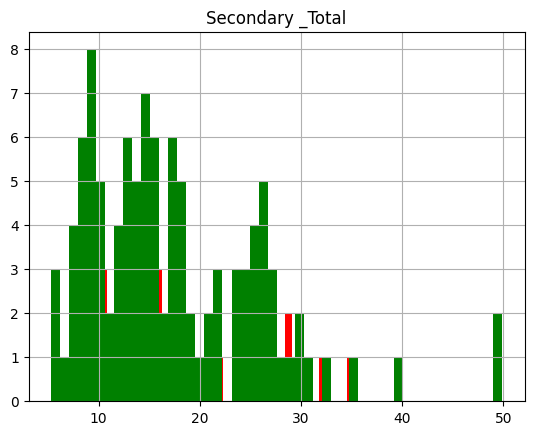

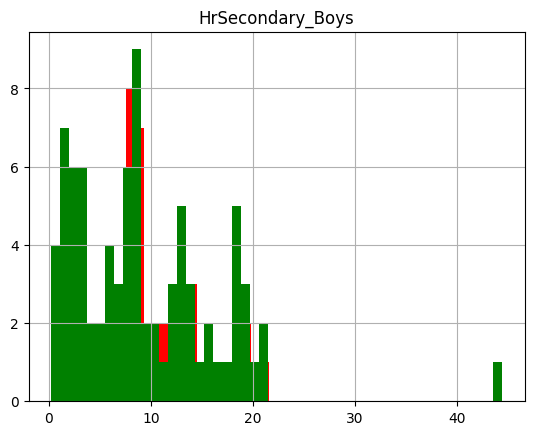

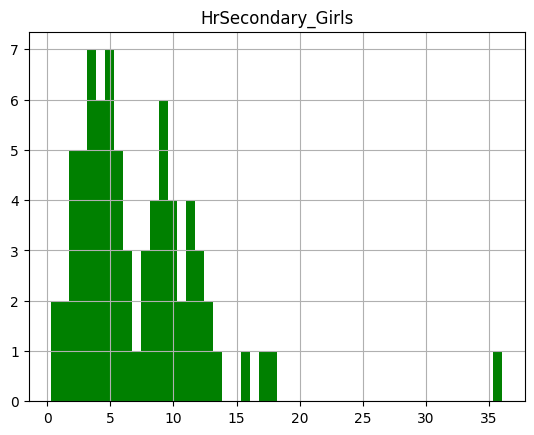

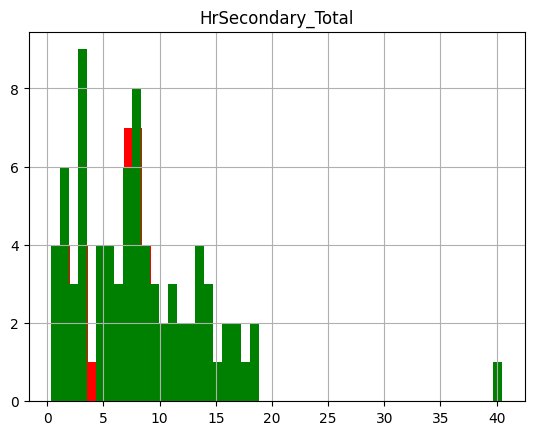

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title(i)
  dropna_df[i].hist(ax=ax,color='red',bins=50)
  dropout_ratio[i].hist(ax=ax,color='green',bins=50)

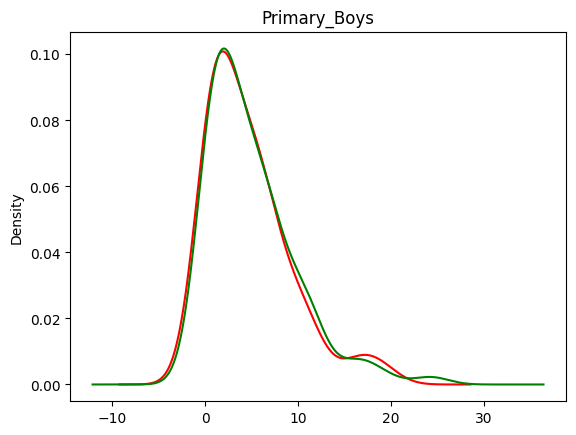

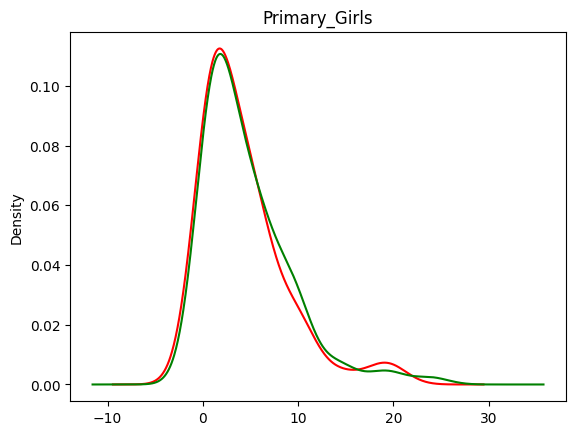

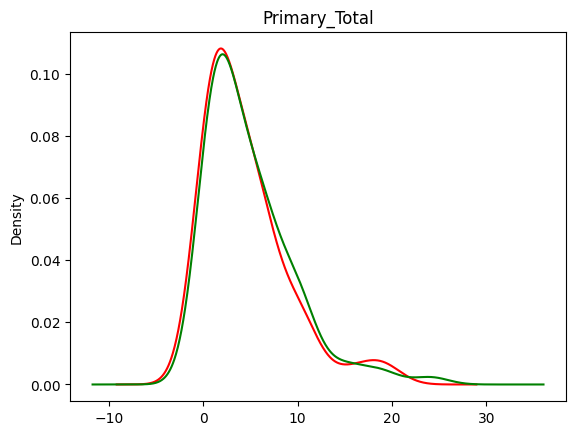

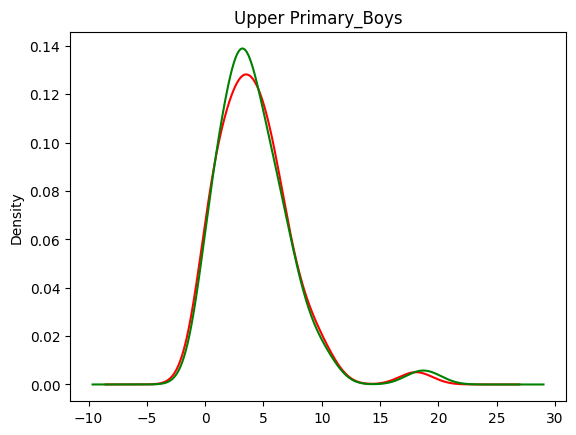

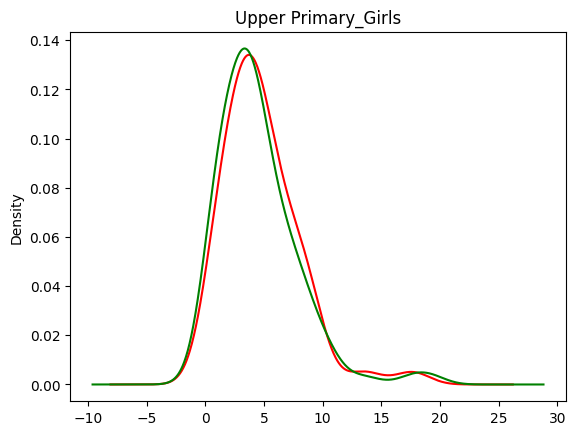

...

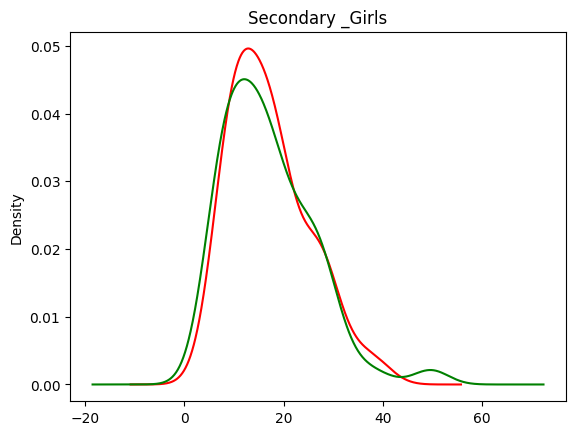

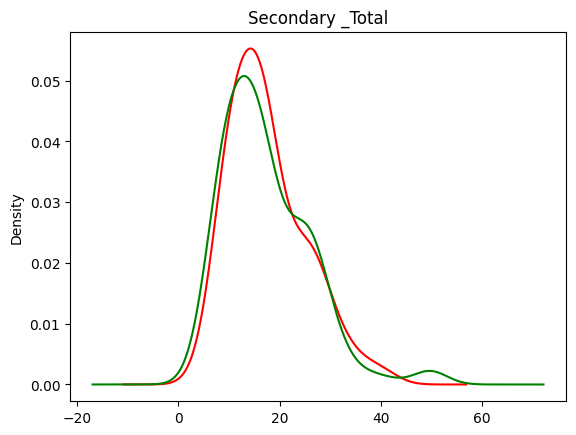

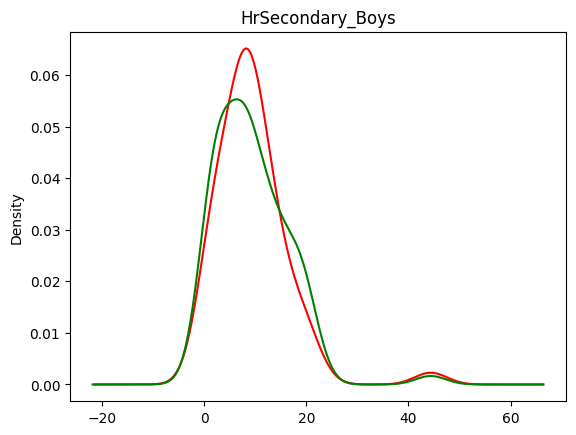

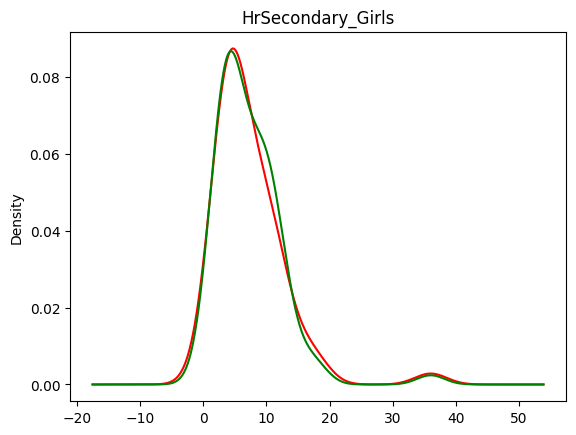

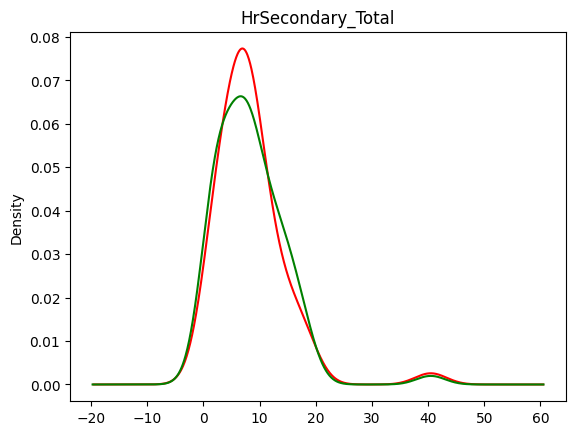

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title(i)
  dropna_df[i].plot.density(color='red')
  dropout_ratio[i].plot.density(color='green')


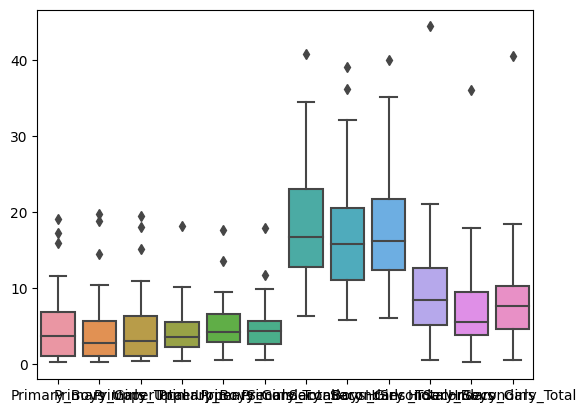

<Axes: >

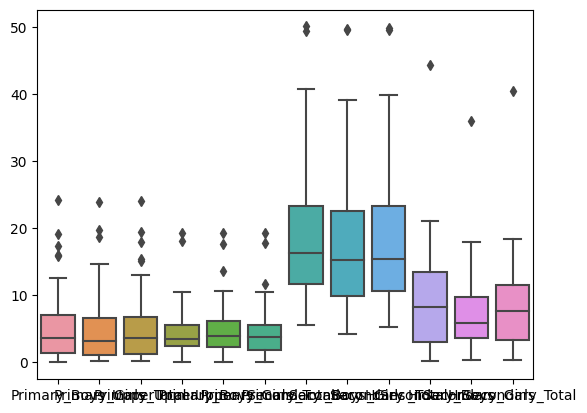

In [ ]:
sns.boxplot(dropna_df)
plt.show()
sns.boxplot(dropout_ratio)

In [ ]:
print(dropna_df.shape,dropout_ratio.shape)

(55, 14) (110, 14)


**The distribution doesn't seem to change much meaning the rows that had missing values also had those missing values in other columns to BUT we lost almost half of our data which is not good**

###Using mean

In [ ]:
tr = ColumnTransformer(transformers = [
    ('tr1',SimpleImputer(strategy='mean'),slice(0,None)),
],remainder='passthrough')

In [ ]:
new_df = dropout_ratio.copy()
new_df.iloc[:,2:] = tr.fit_transform(new_df.iloc[:,2:])

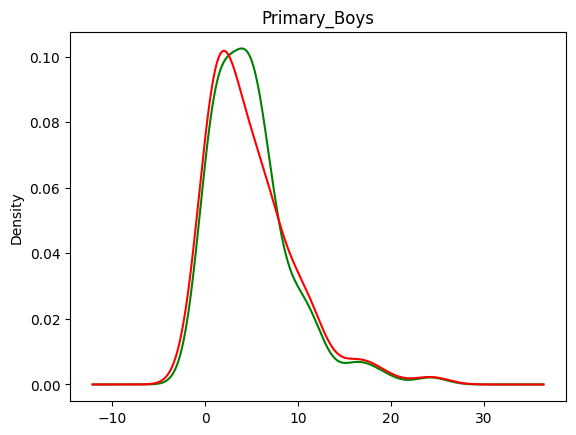

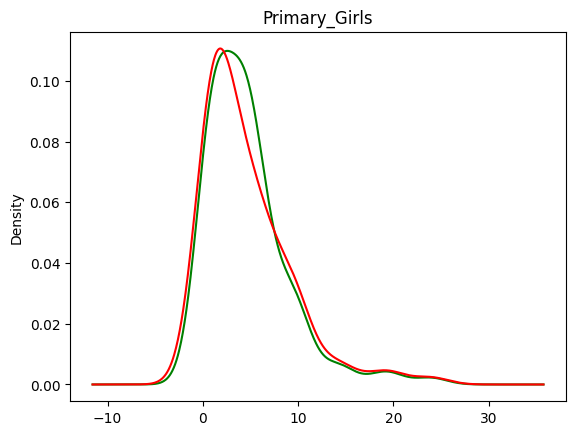

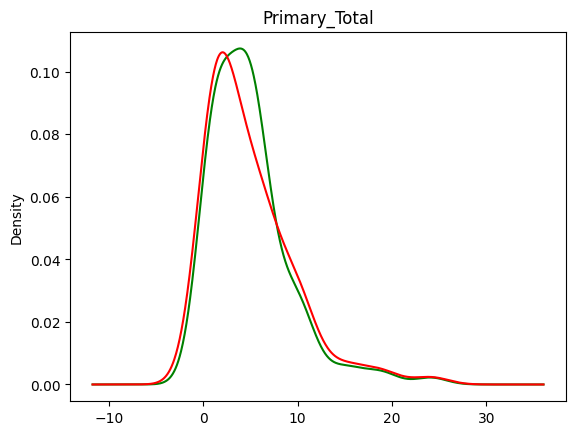

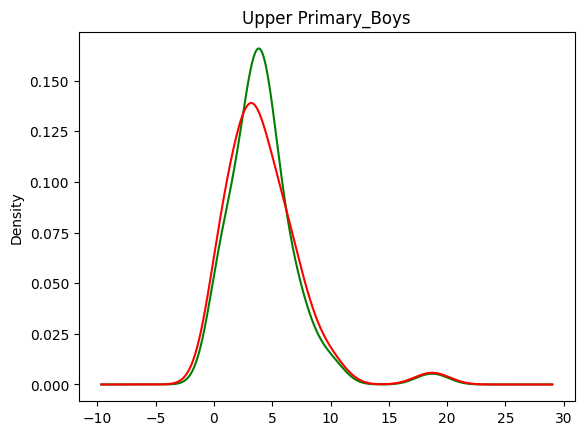

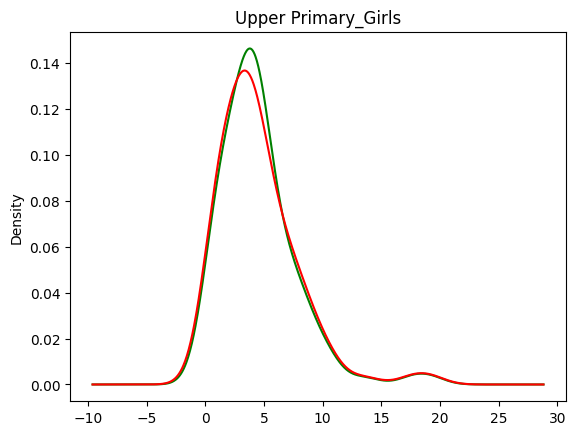

...

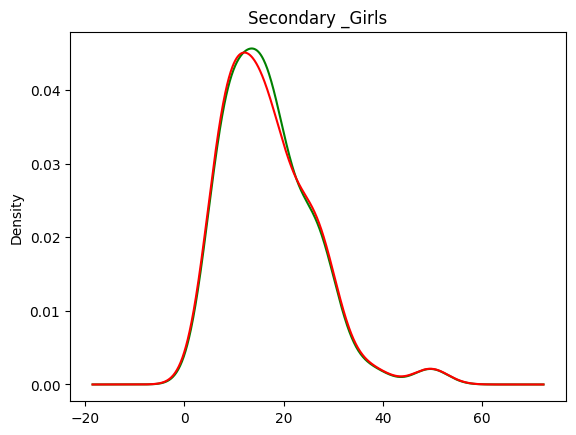

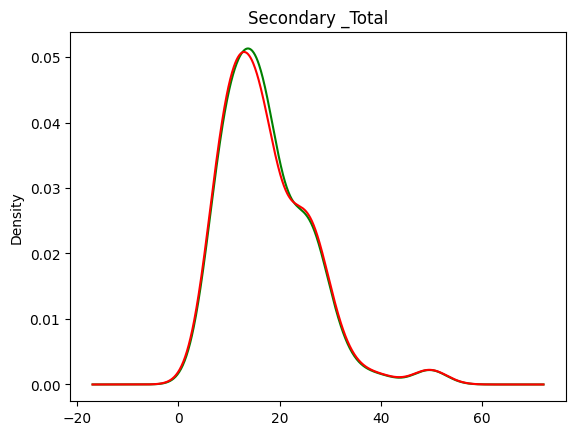

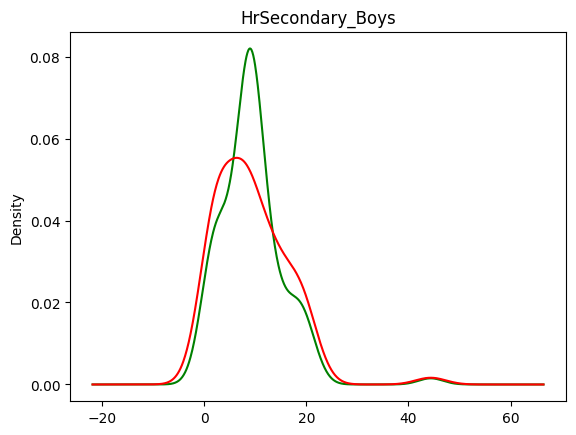

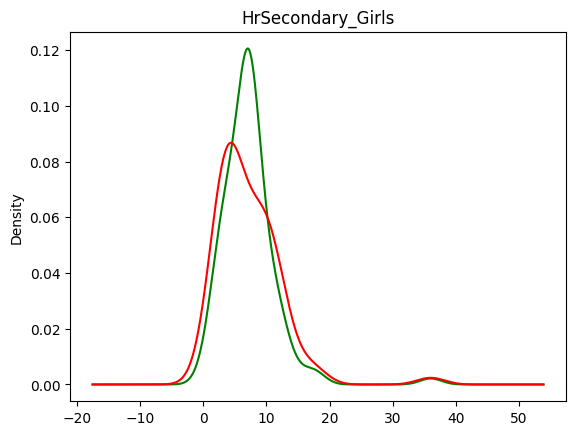

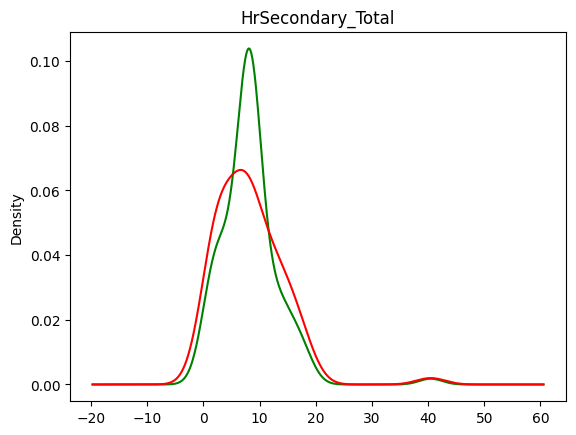

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title(i)
  new_df[i].plot.density(color='green')
  dropout_ratio[i].plot.density(color='red')

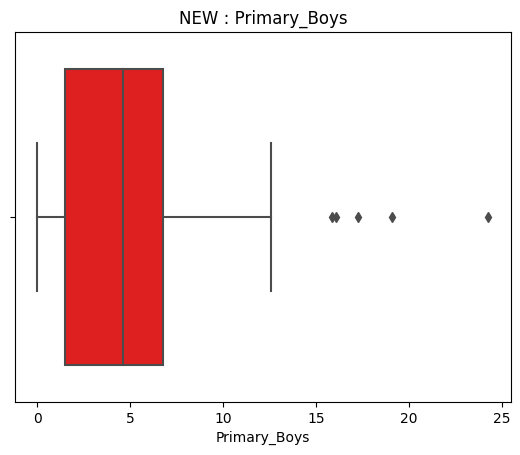

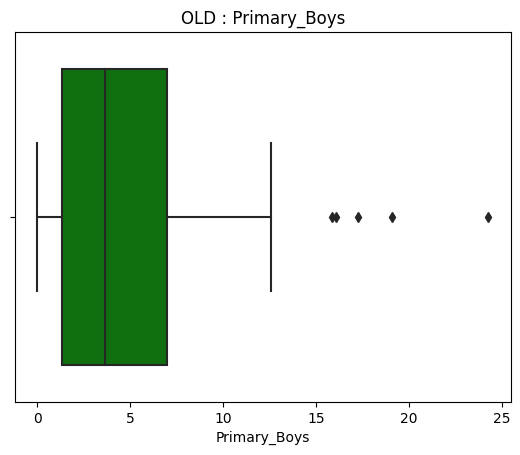

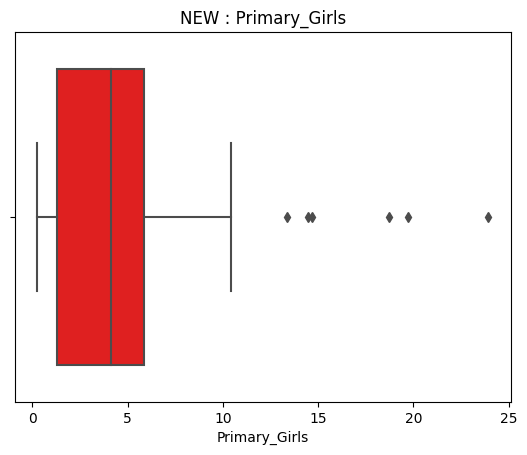

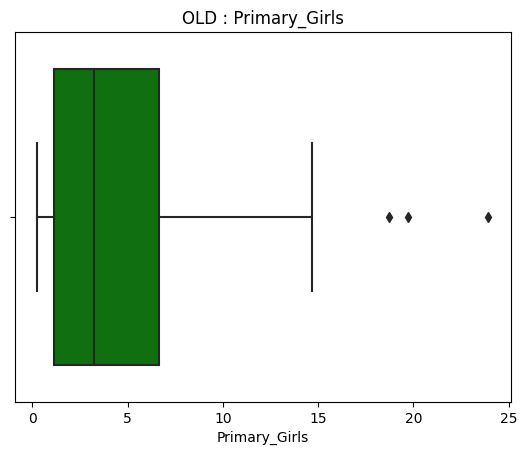

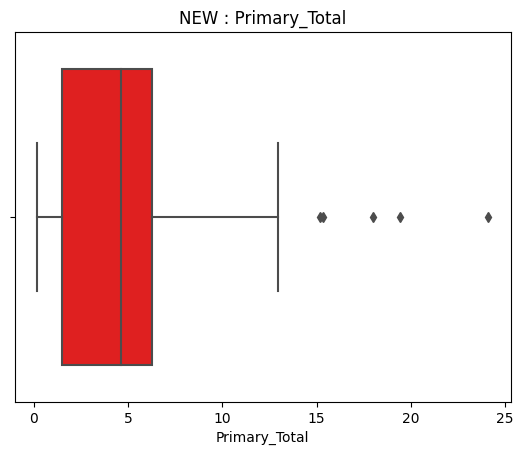

...

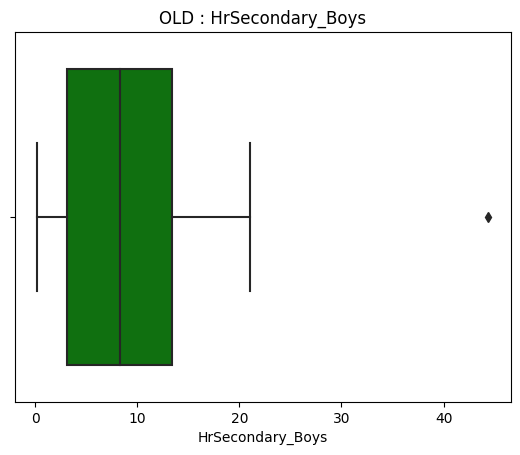

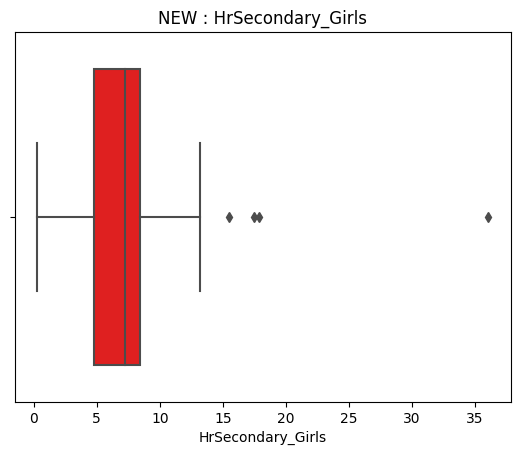

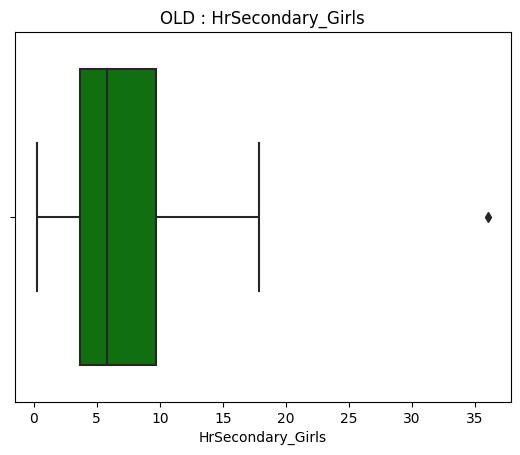

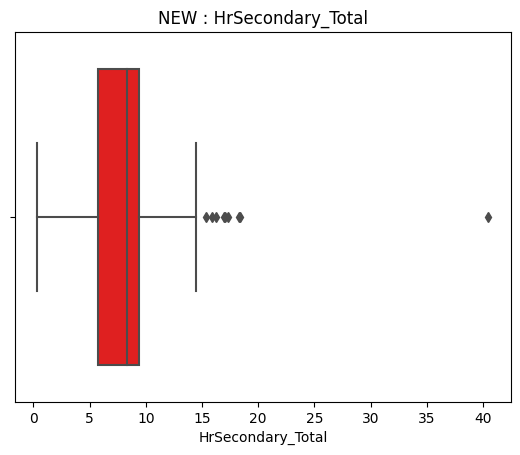

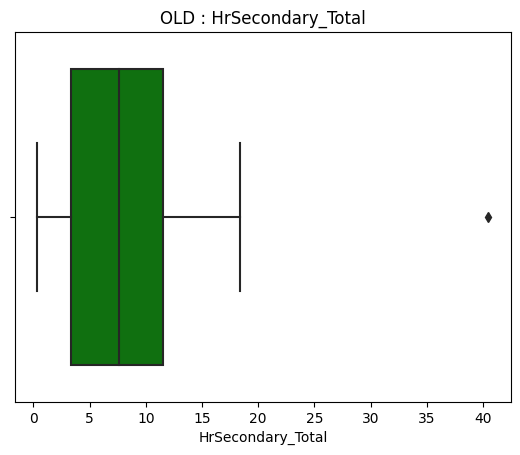

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title("NEW : "+i)
  sns.boxplot(x=new_df[i],color='red')
  plt.show()
  plt.title("OLD : "+i)
  sns.boxplot(x=dropout_ratio[i],color='green')

**Does't seem to work Because the missing values are greater than 5%**

###Using median

In [ ]:
tr = ColumnTransformer(transformers = [
    ('tr1',SimpleImputer(strategy='median'),slice(0,None))
],remainder='passthrough')

In [ ]:
new_df = dropout_ratio.copy()
new_df.iloc[:,2:] = tr.fit_transform(dropout_ratio.iloc[:,2:])

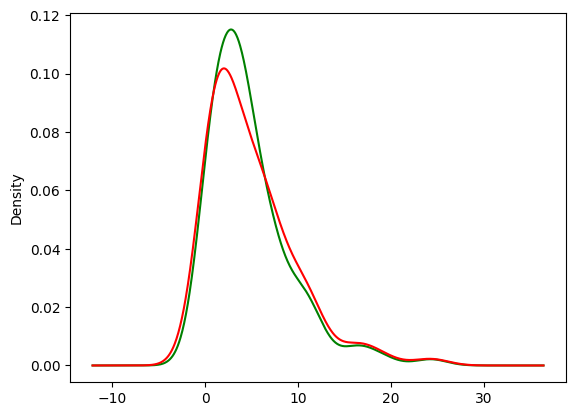

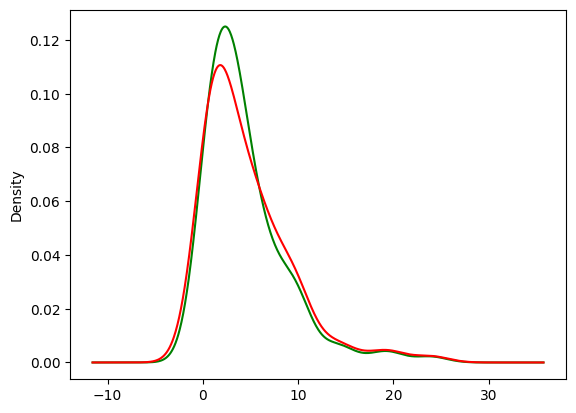

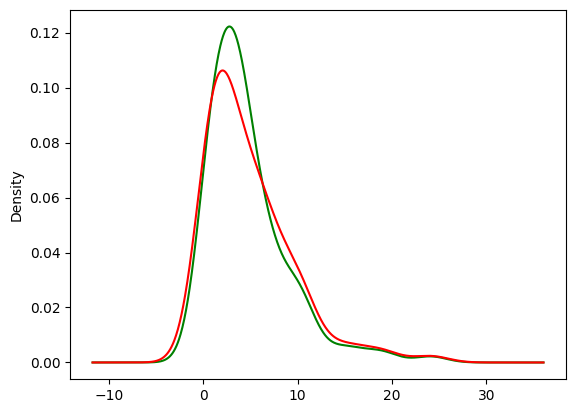

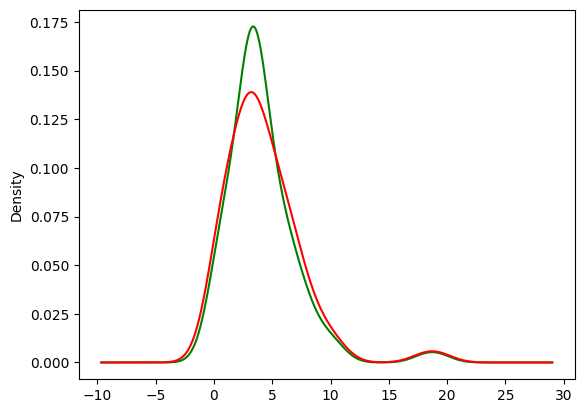

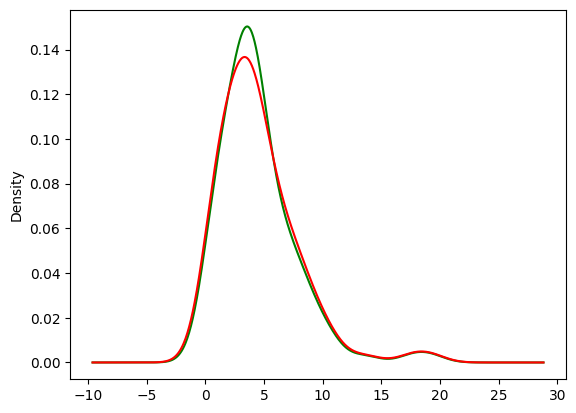

...

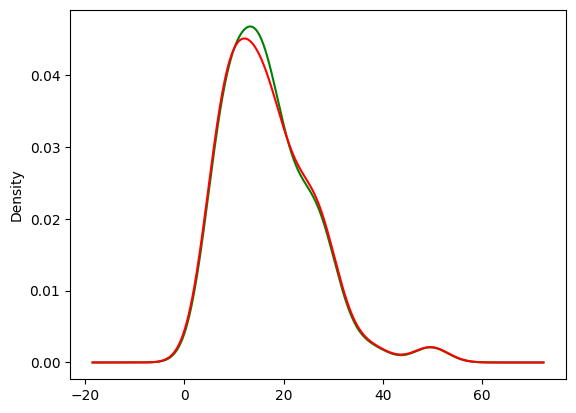

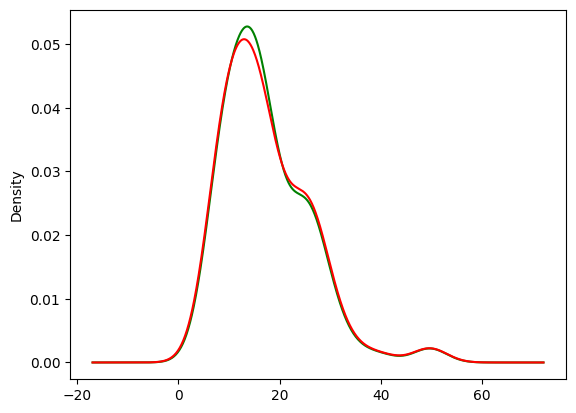

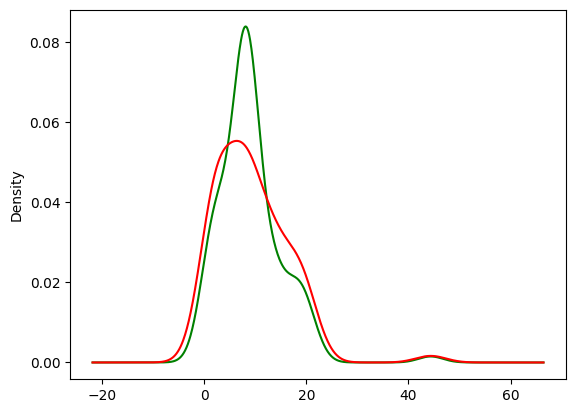

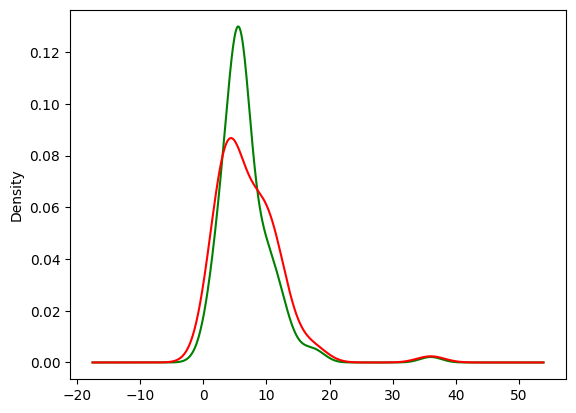

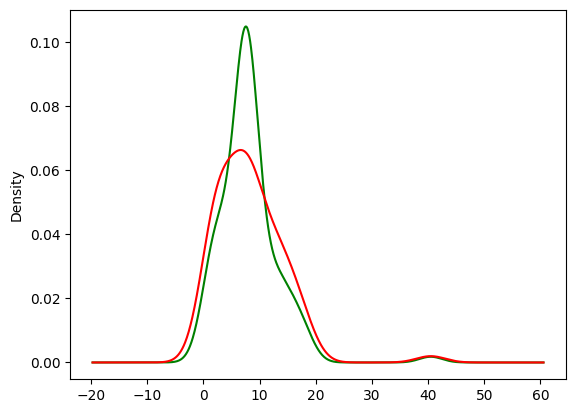

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  new_df[i].plot.density(color="green",ax=ax)
  dropout_ratio[i].plot.density(color="red",ax=ax)

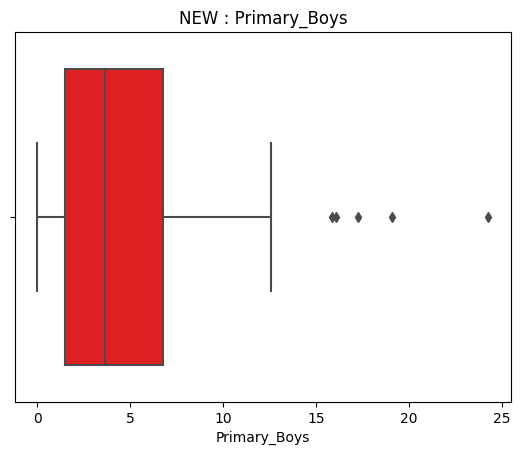

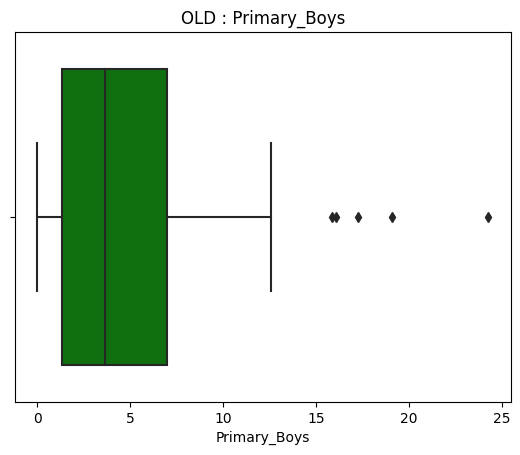

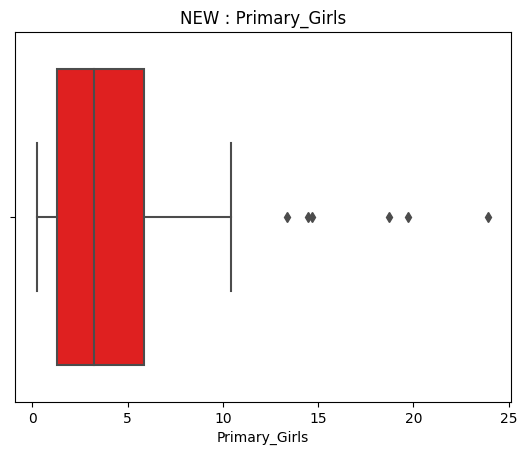

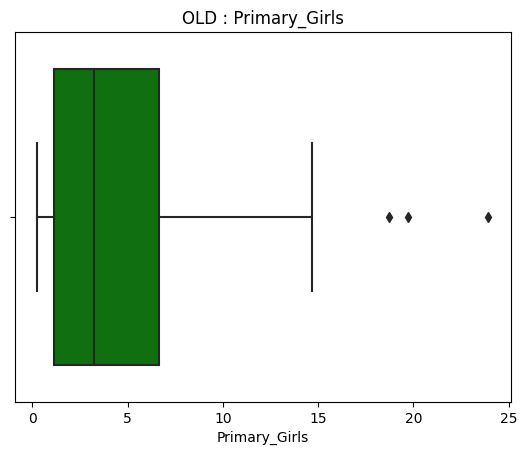

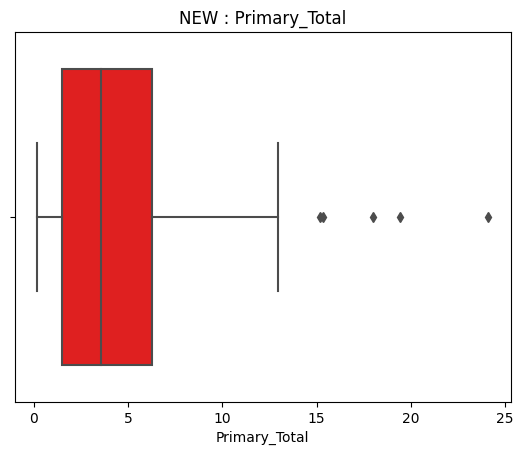

...

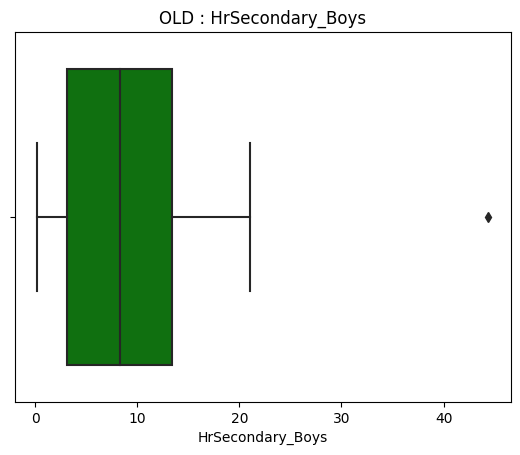

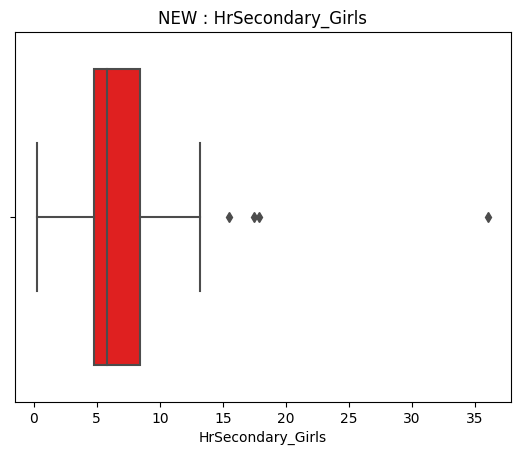

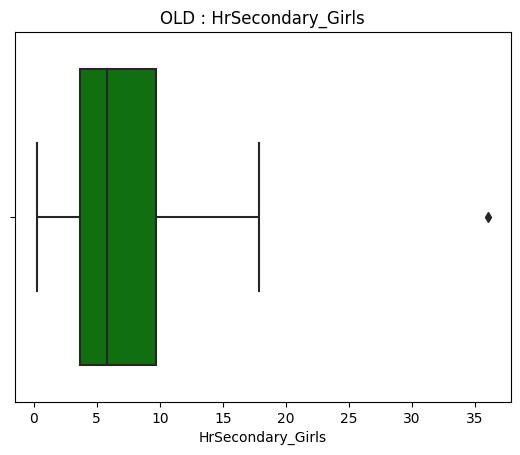

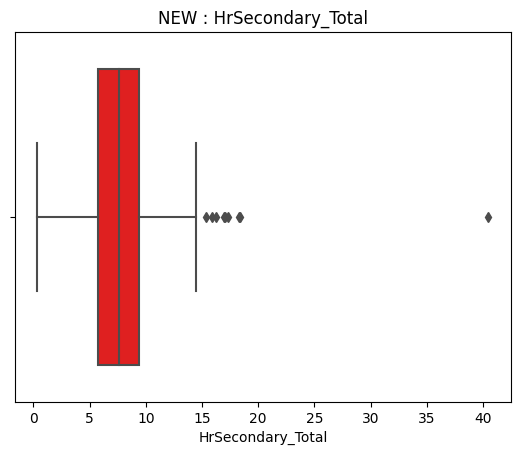

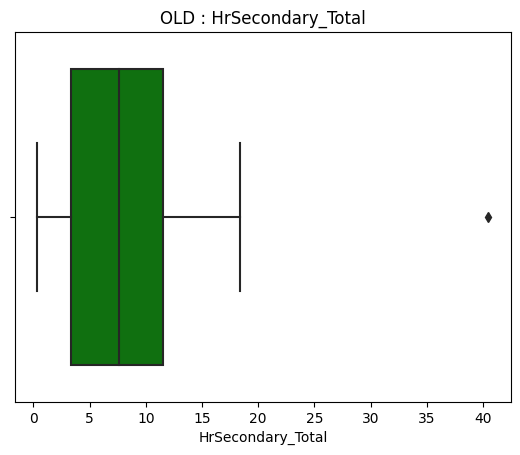

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title("NEW : "+i)
  sns.boxplot(x=new_df[i],color='red')
  plt.show()
  plt.title("OLD : "+i)
  sns.boxplot(x=dropout_ratio[i],color='green')

**Just like mean this also doesn't work**

###Arbitrary value imputation

In [ ]:
arb_df = dropout_ratio.fillna(-1)

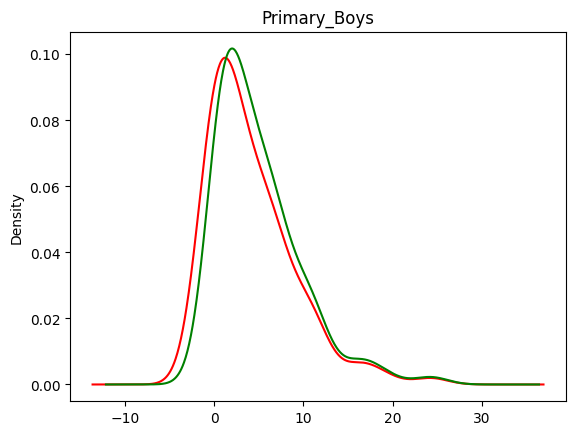

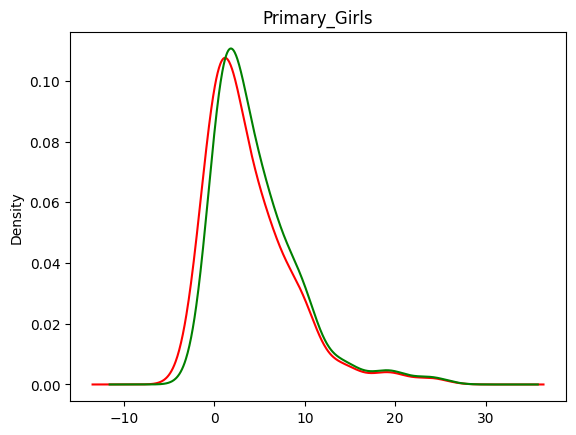

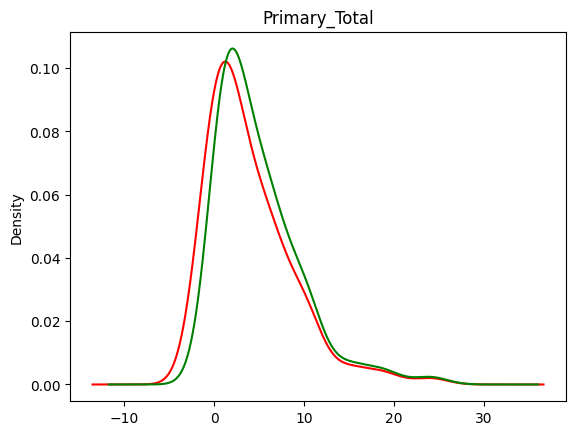

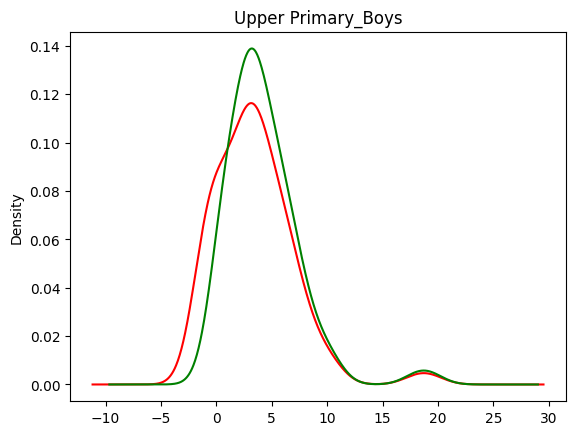

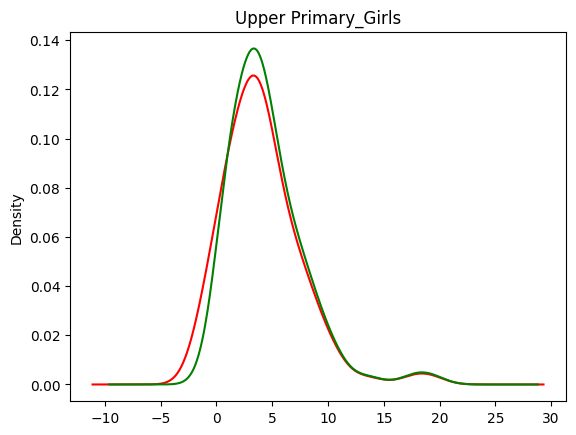

...

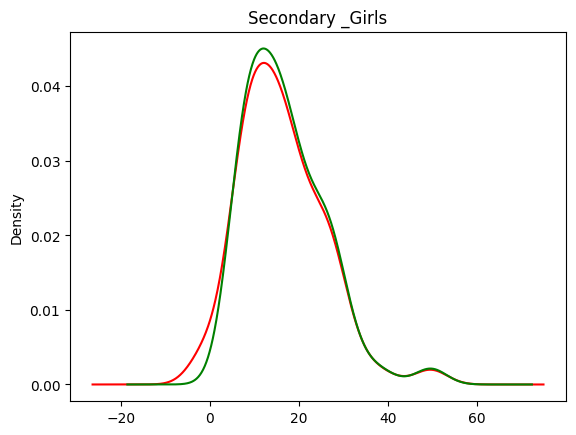

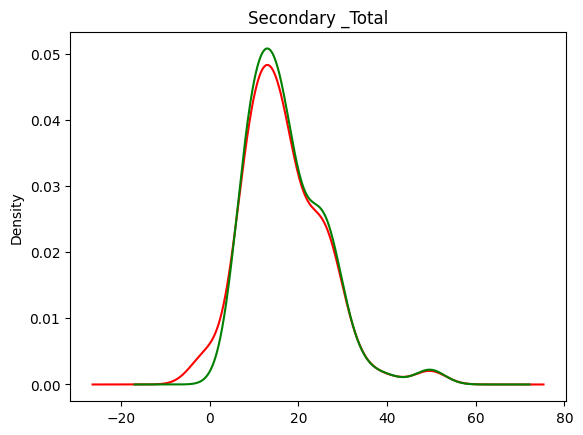

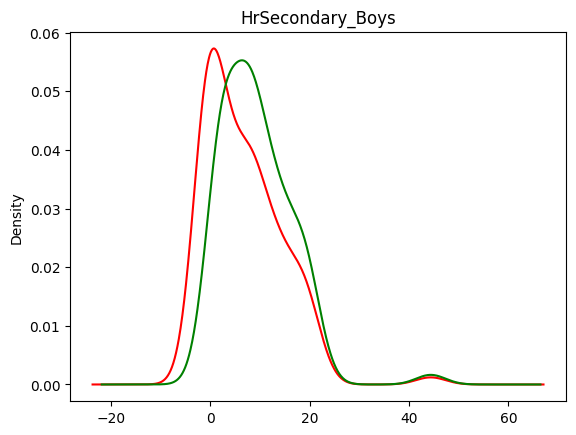

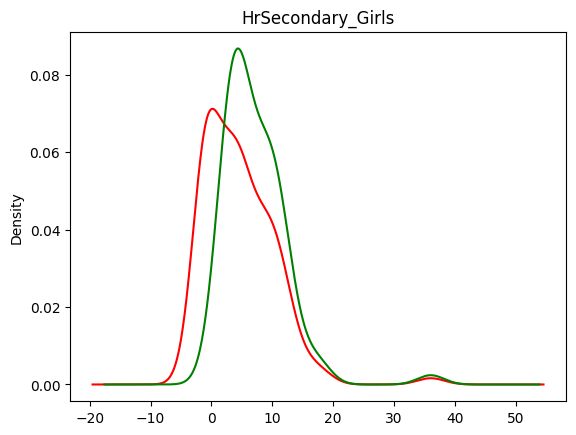

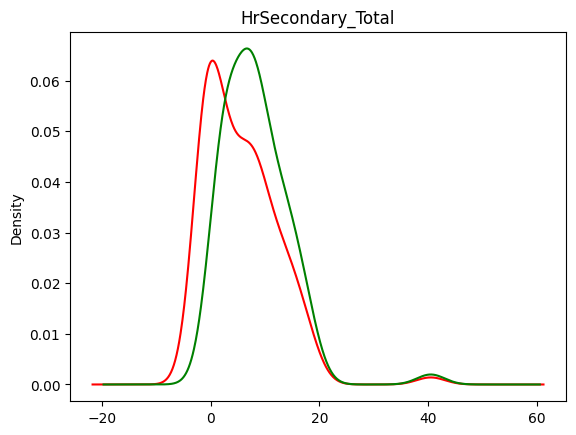

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title(i)
  arb_df[i].plot.density(color='red')
  dropout_ratio[i].plot.density(color='green')

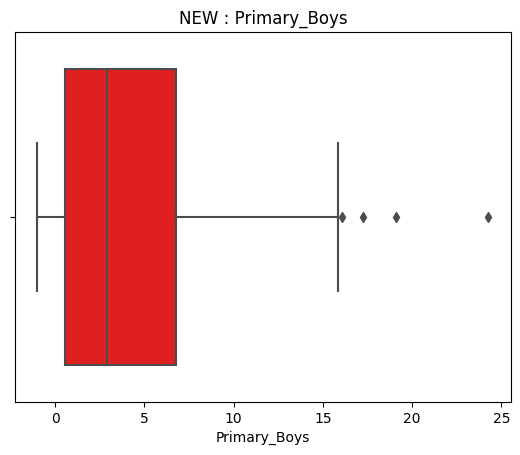

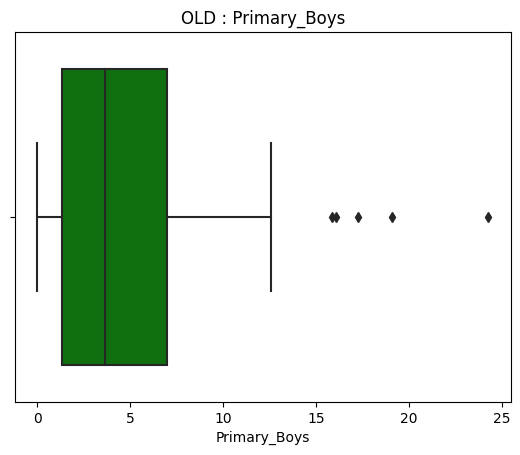

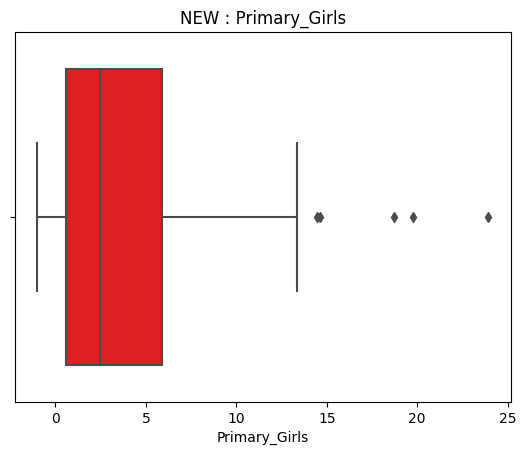

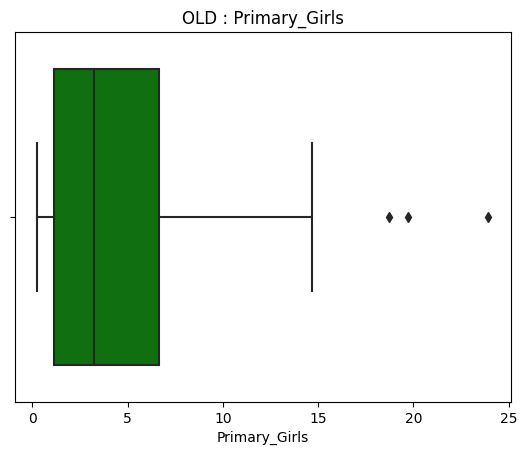

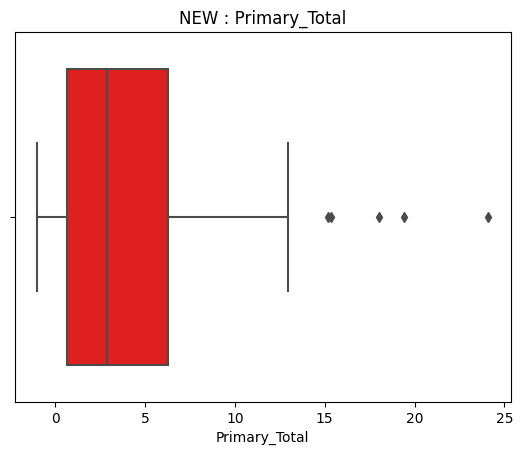

...

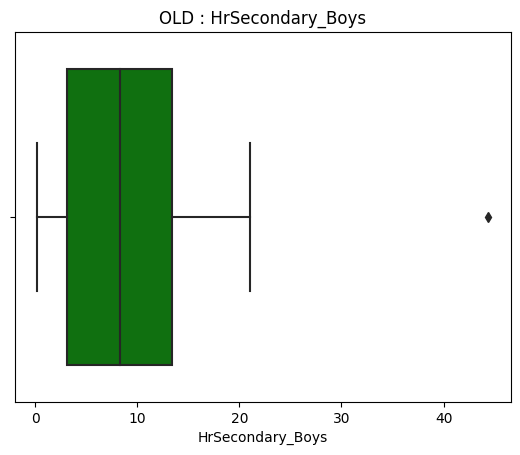

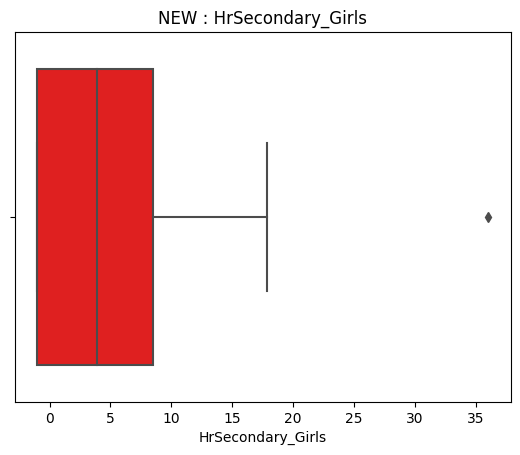

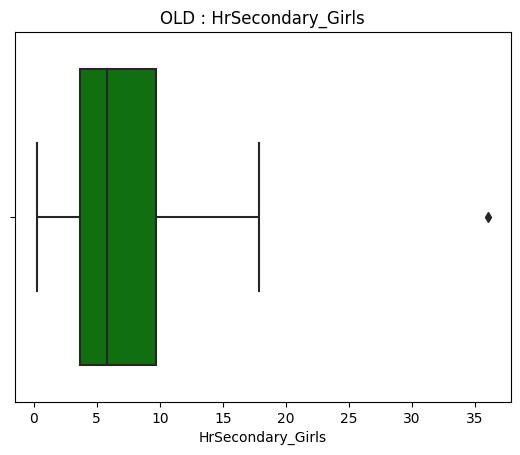

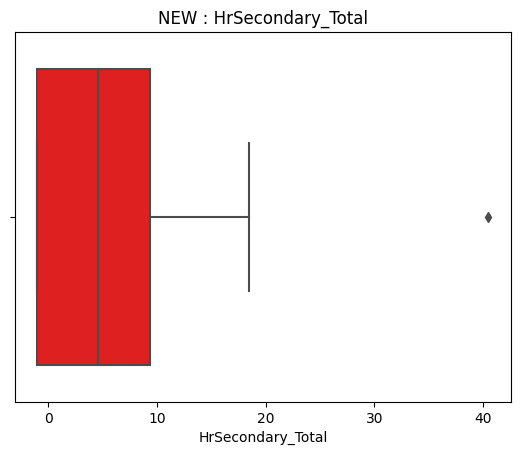

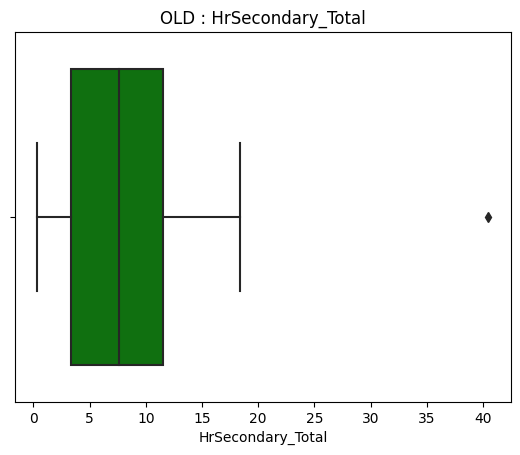

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title("NEW : "+i)
  sns.boxplot(x=arb_df[i],color='red')
  plt.show()
  plt.title("OLD : "+i)
  sns.boxplot(x=dropout_ratio[i],color='green')

**Same thing, There are many missing values so this distrotes the distribution**

###End of distribution imputation

In [ ]:
IQR = dropout_ratio['Primary_Boys'].quantile(0.25) - dropout_ratio['Primary_Boys'].quantile(0.75)
first = dropout_ratio['Primary_Boys'].quantile(0.25) - 1.5*IQR
second = dropout_ratio['Primary_Boys'].quantile(0.75) + 1.5*IQR

In [ ]:
new_df = dropout_ratio.fillna(first)
new_df

,State_UT,year,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
0,A & N Islands,2012-13,0.83,0.51,0.68,9.825,1.09,1.23,5.57,5.55,5.56,17.660,10.150,14.140
1,A & N Islands,2013-14,1.35,1.06,1.21,9.825,1.54,0.51,8.36,5.98,7.20,18.940,12.200,15.870
2,A & N Islands,2014-15,0.47,0.55,0.51,1.440,1.95,1.69,11.47,8.16,9.87,21.050,12.210,16.930
3,Andhra Pradesh,2012-13,3.30,3.05,3.18,3.210,3.51,3.36,12.21,13.25,12.72,2.660,9.825,0.350
4,Andhra Pradesh,2013-14,4.31,4.39,4.35,3.460,4.12,3.78,11.95,13.37,12.65,12.650,10.850,11.790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,West Bengal,2013-14,3.44,2.37,2.91,5.630,3.10,4.31,16.73,19.77,18.34,8.030,7.760,7.900
106,West Bengal,2014-15,2.13,0.79,1.47,5.840,2.88,4.30,16.33,19.06,17.80,8.180,8.040,8.110
107,All India,2012-13,4.68,4.66,4.67,2.300,4.01,3.13,14.54,14.54,14.54,9.825,9.825,9.825
108,All India,2013-14,4.53,4.14,4.34,3.090,4.49,3.77,17.93,17.79,17.86,1.480,1.610,1.540


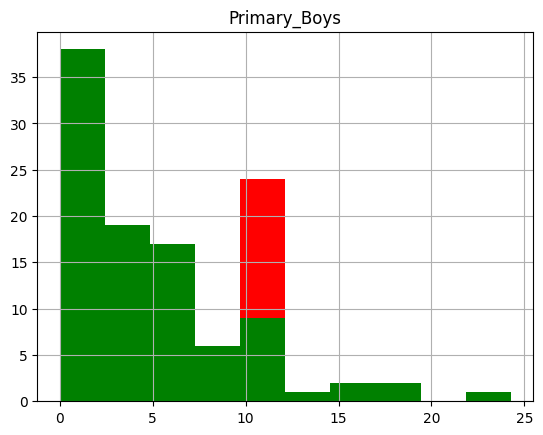

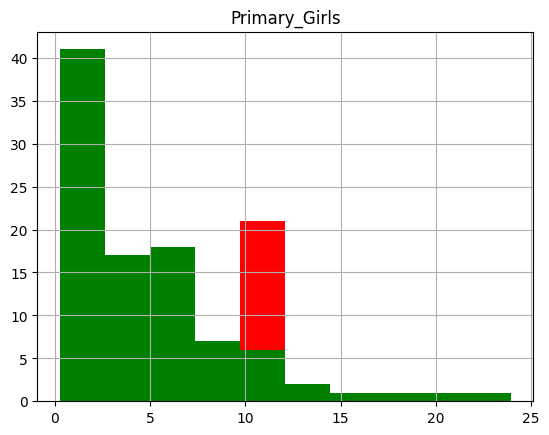

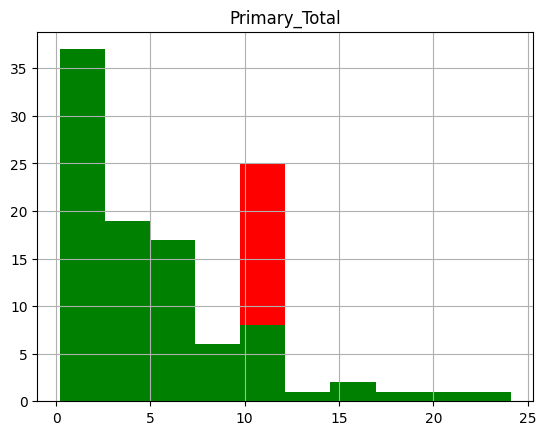

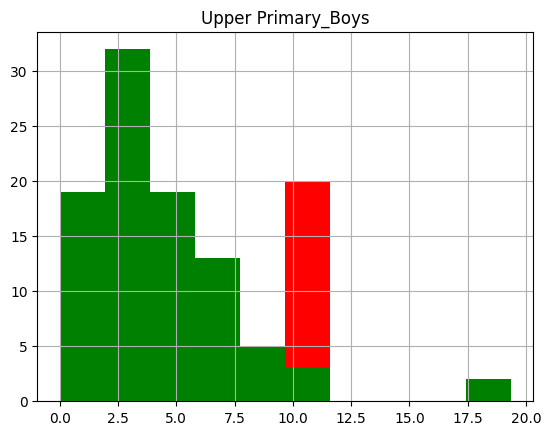

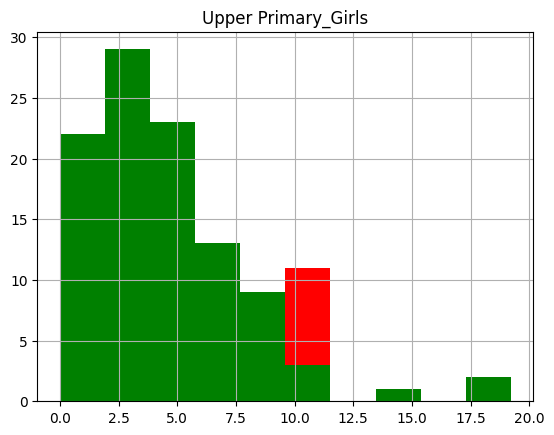

...

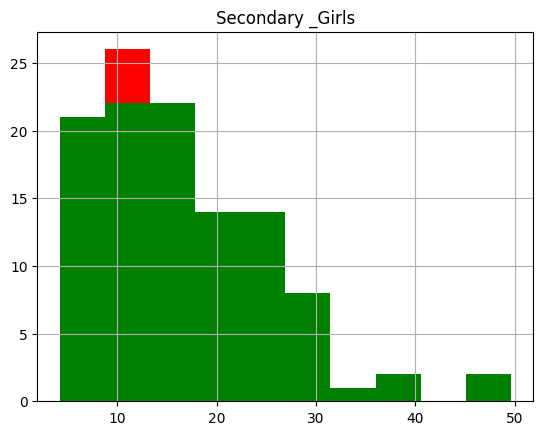

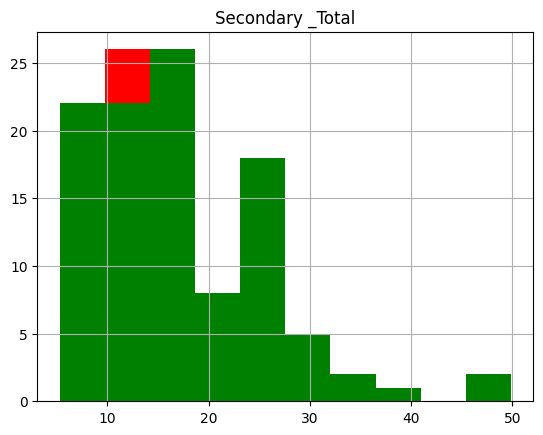

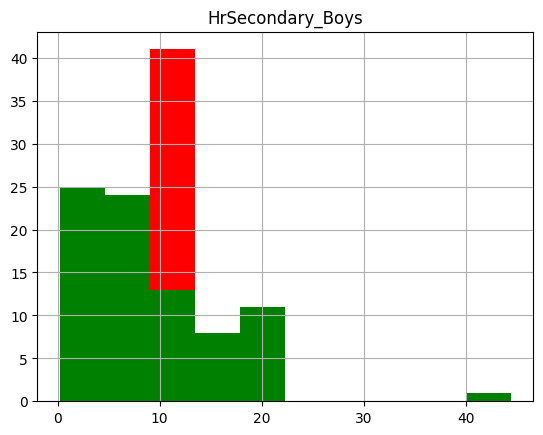

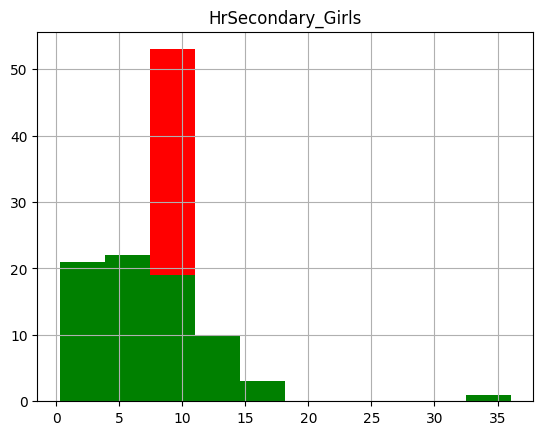

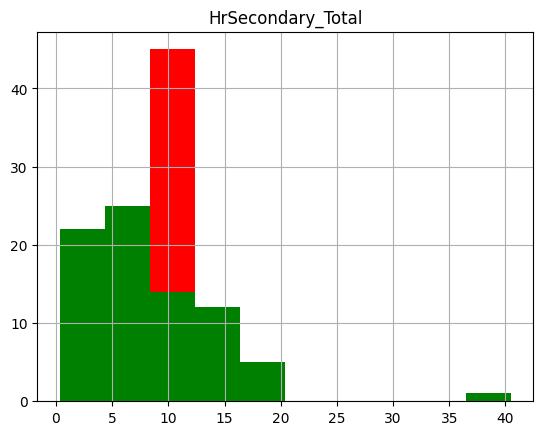

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  new_df[i].hist(color='red')
  dropout_ratio[i].hist(color='green')

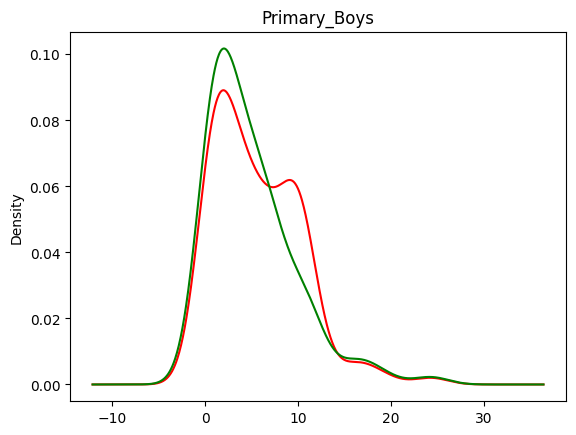

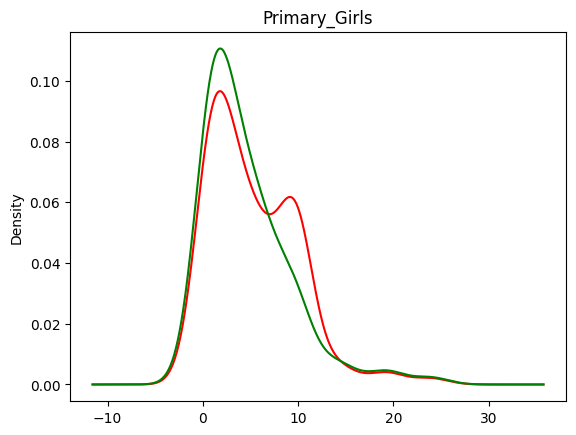

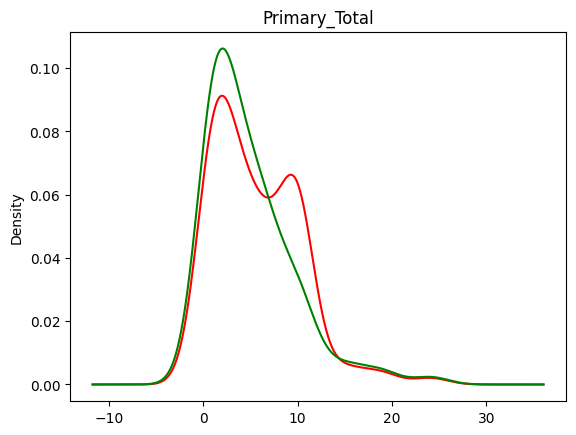

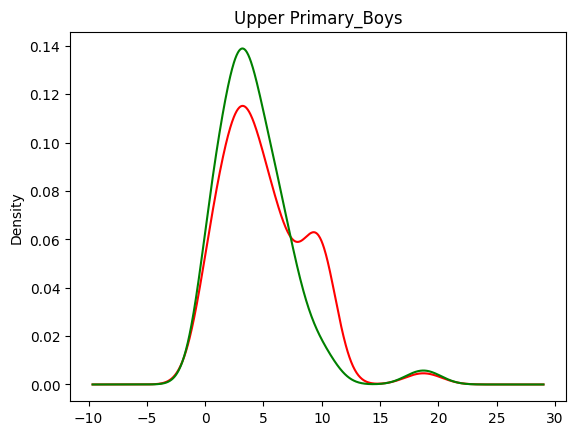

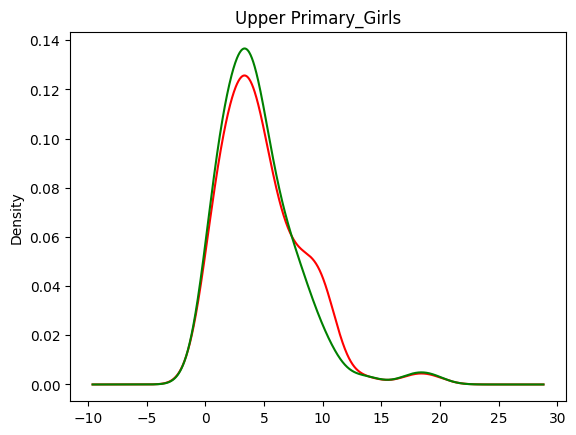

...

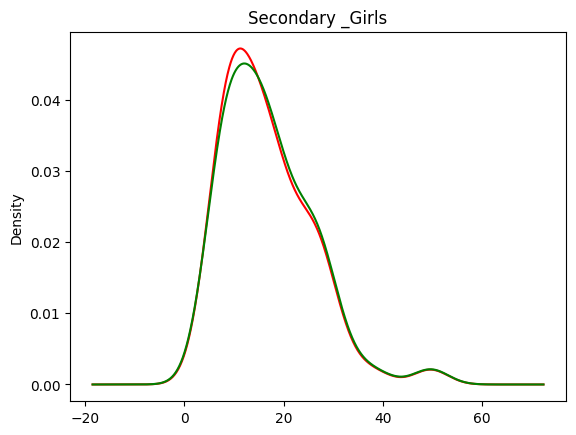

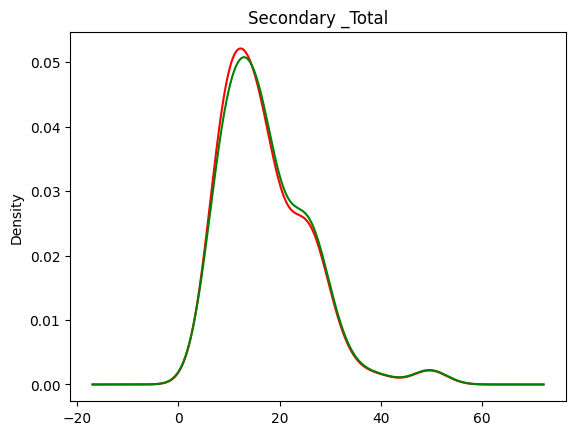

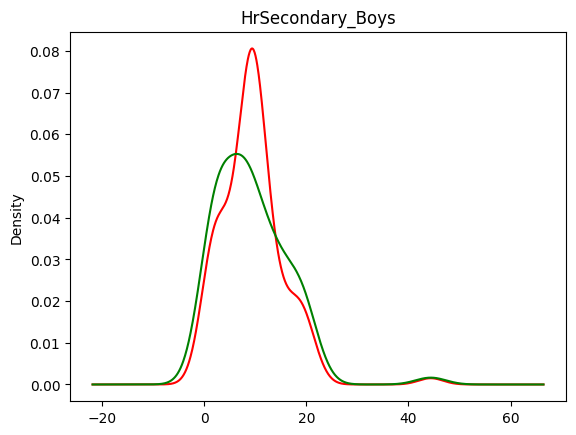

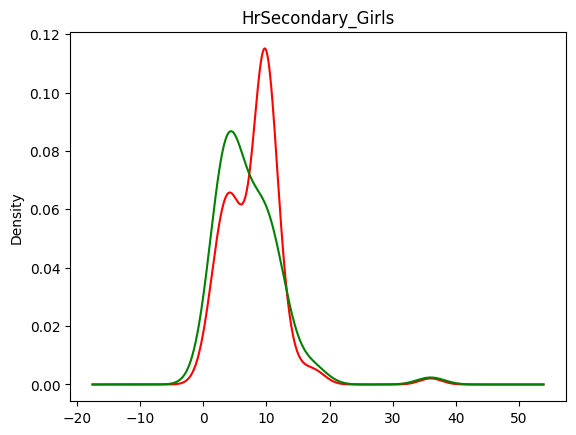

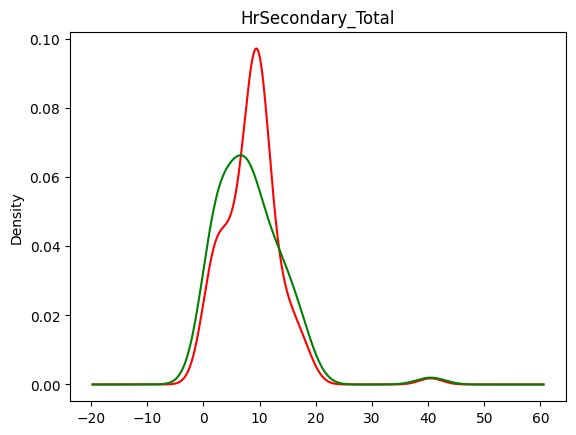

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  new_df[i].plot.density(color='red')
  dropout_ratio[i].plot.density(color='green')

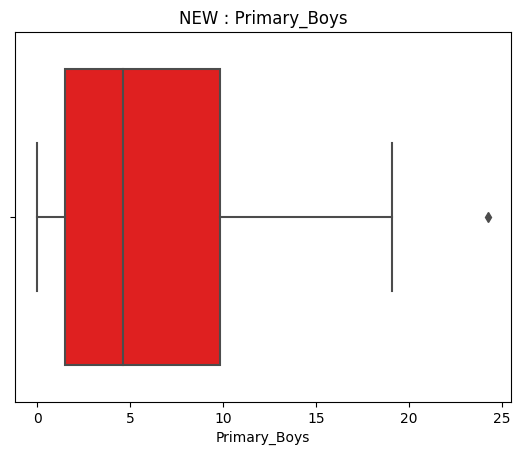

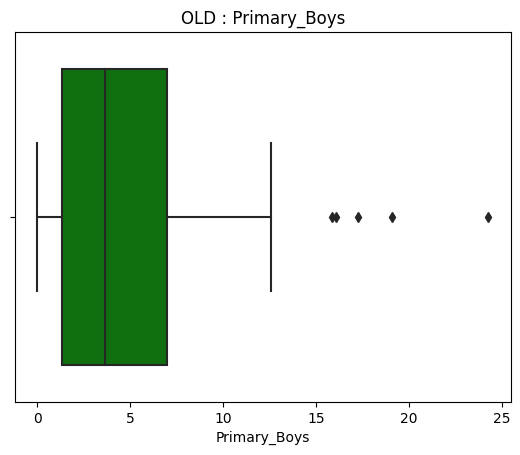

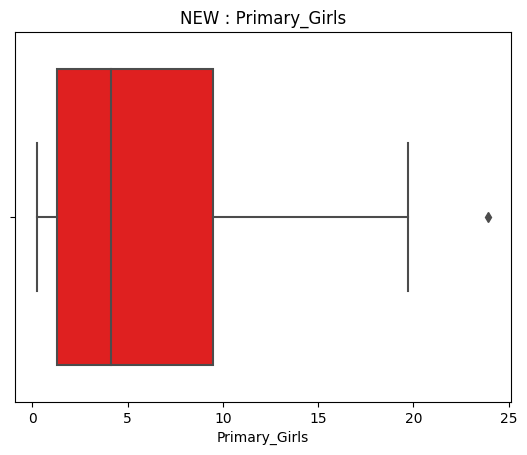

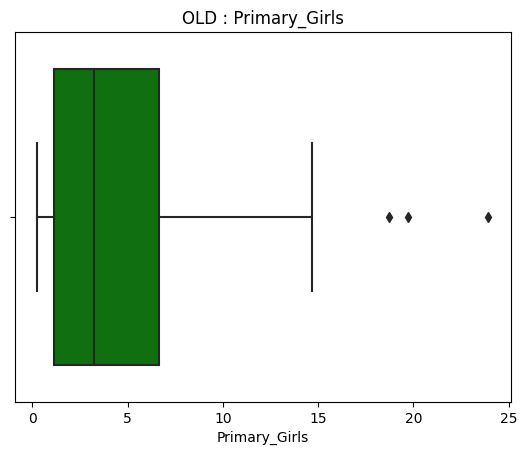

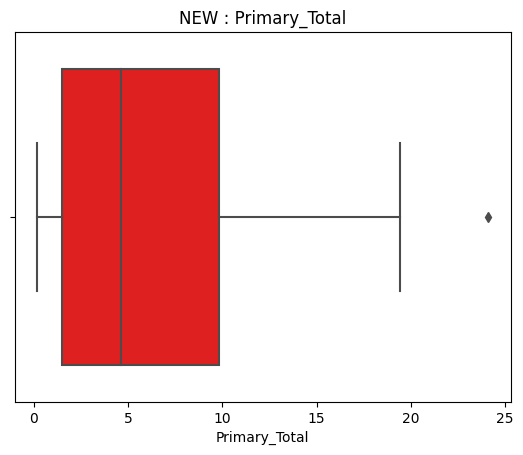

...

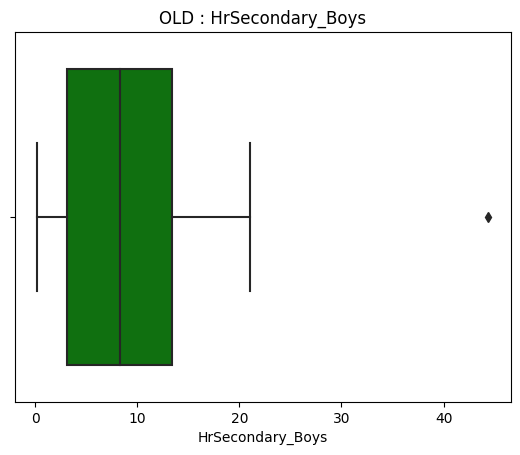

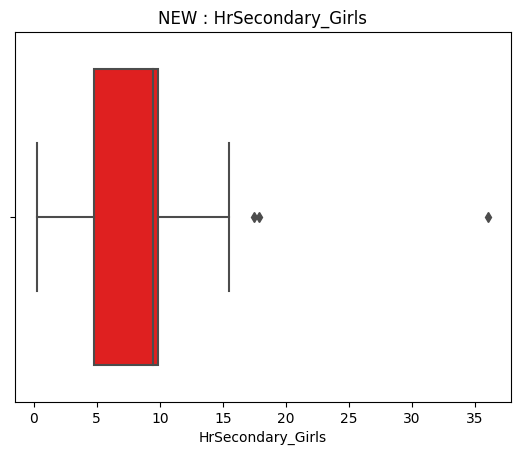

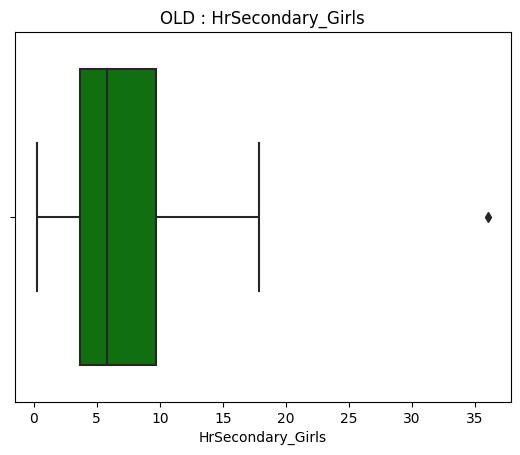

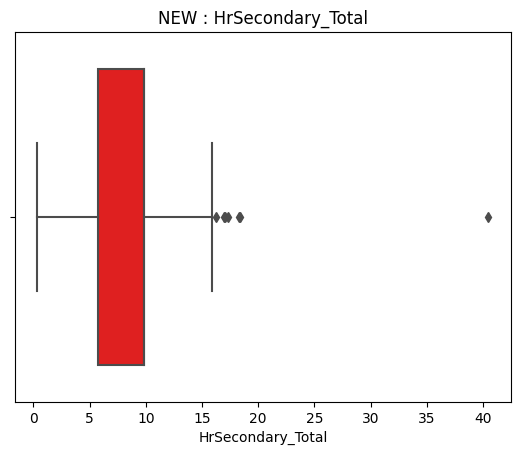

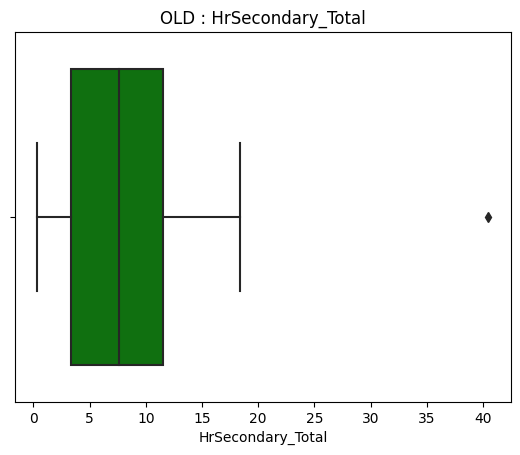

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title("NEW : "+i)
  sns.boxplot(x=new_df[i],color='red')
  plt.show()
  plt.title("OLD : "+i)
  sns.boxplot(x=dropout_ratio[i],color='green')

###Random value imputation (Might work)

In [ ]:
new_df = dropout_ratio.copy()
for i in dropout_ratio.iloc[:,2:].columns:
  new_df[i][new_df[i].isnull()] = dropout_ratio[i].dropna().sample(dropout_ratio[i].isnull().sum()).values

<ipython-input-62-049470548c16>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df[i][new_df[i].isnull()] = dropout_ratio[i].dropna().sample(dropout_ratio[i].isnull().sum()).values


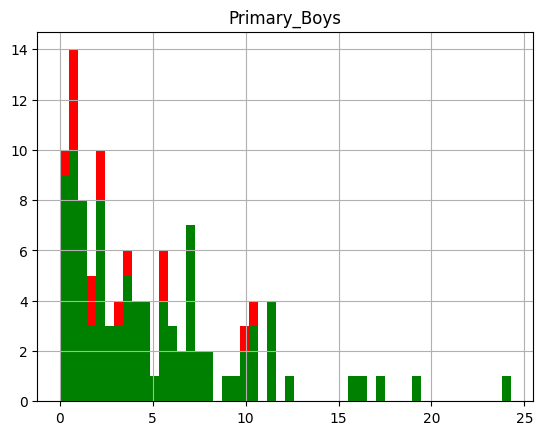

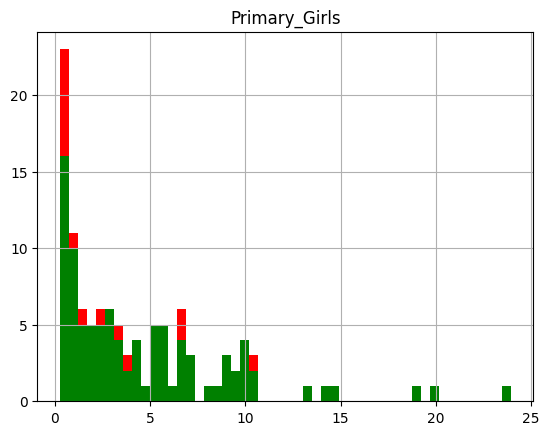

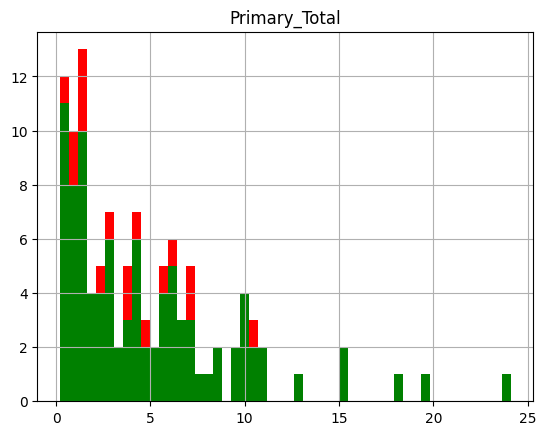

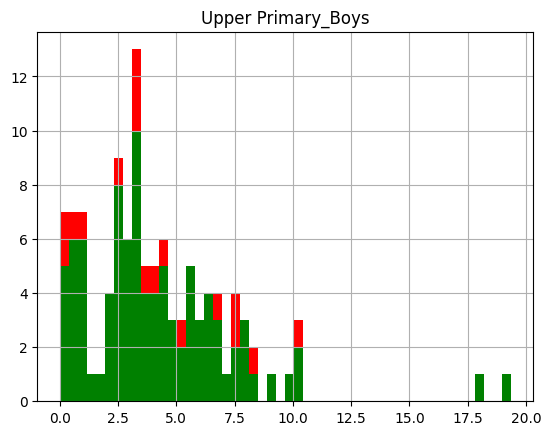

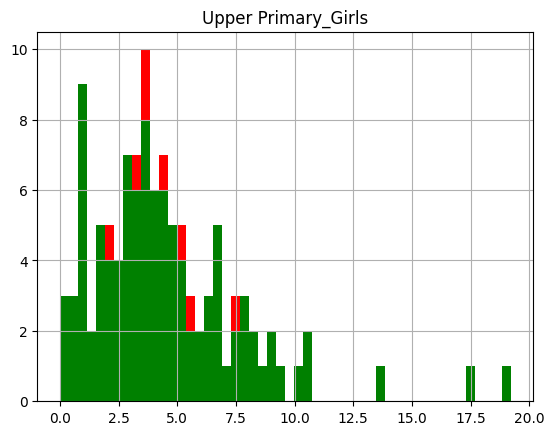

...

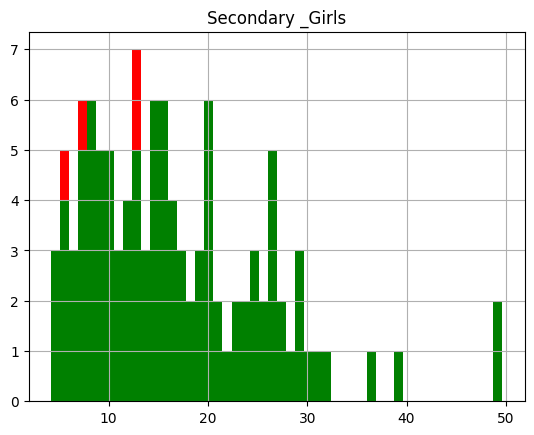

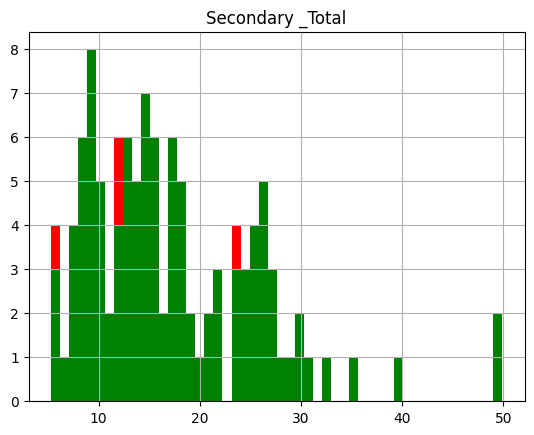

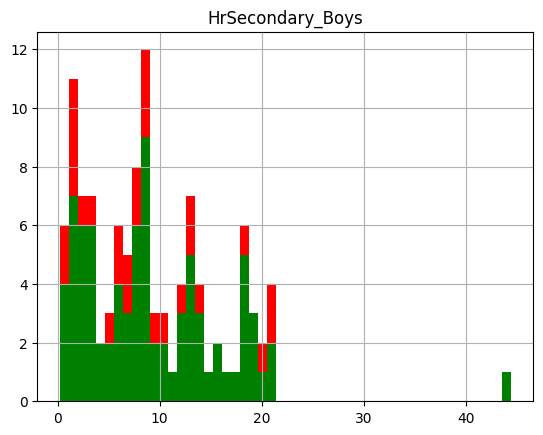

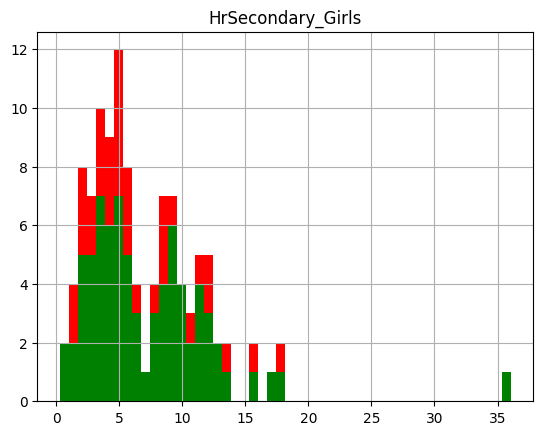

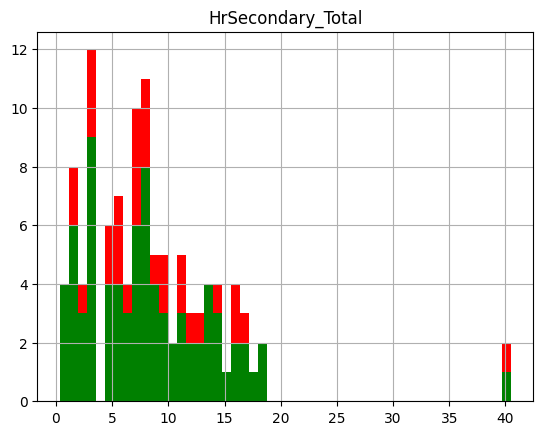

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  new_df[i].hist(color='red',bins=50)
  dropout_ratio[i].hist(color='green',bins=50)

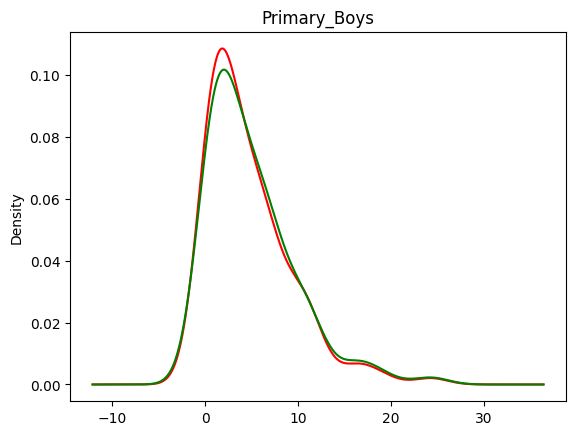

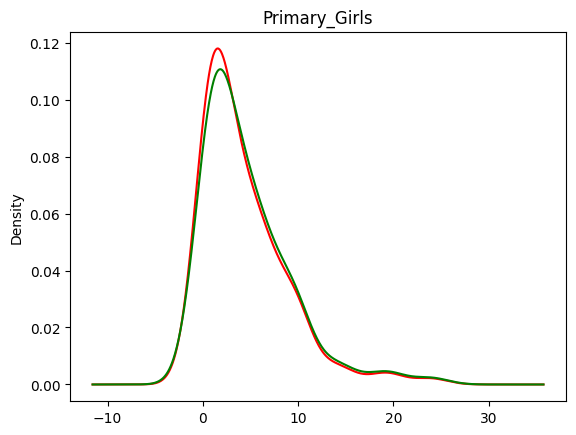

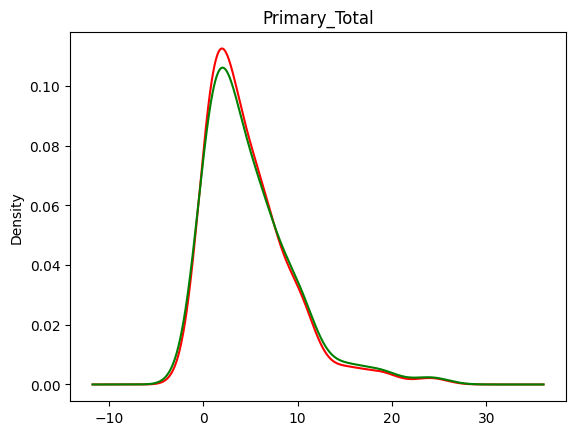

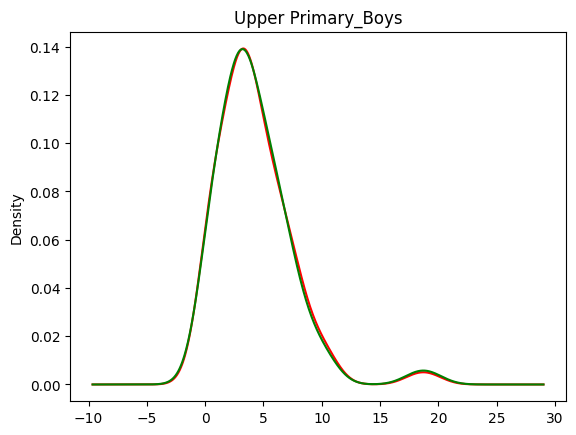

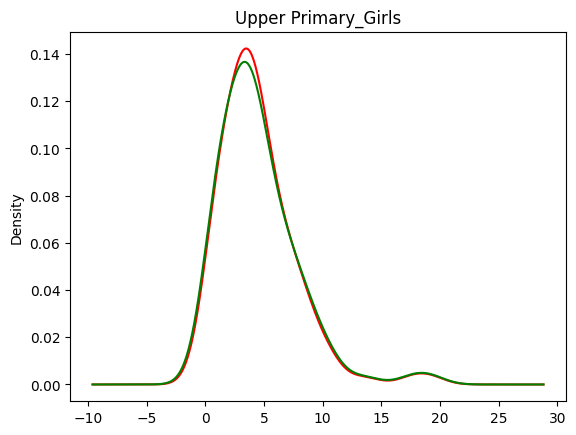

...

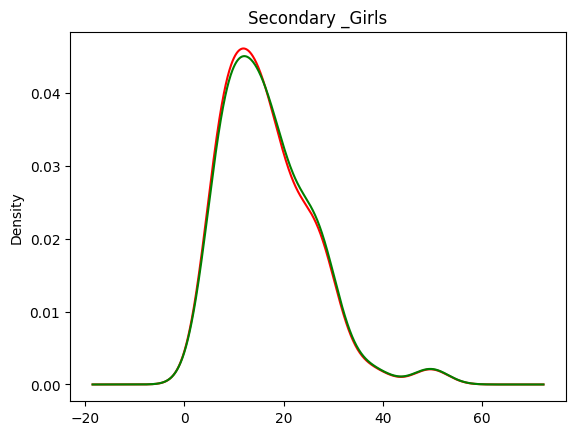

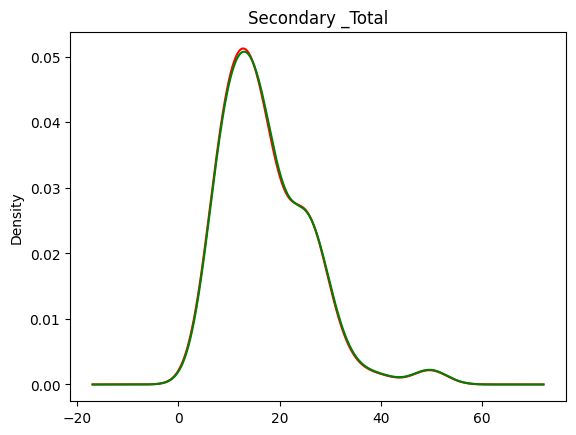

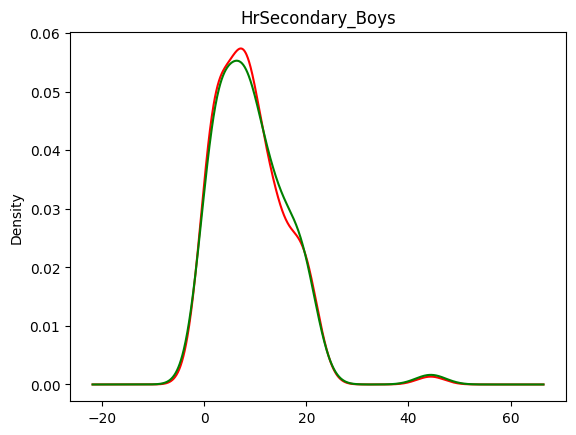

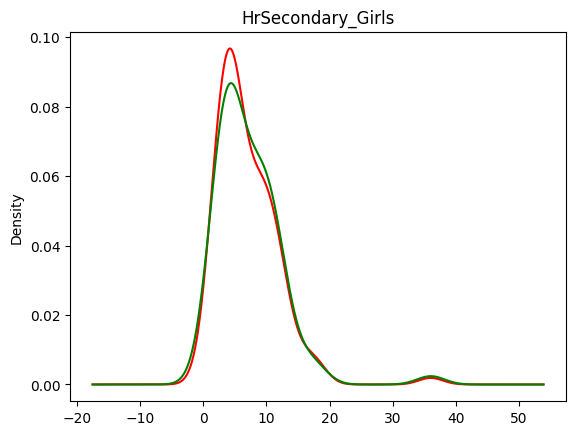

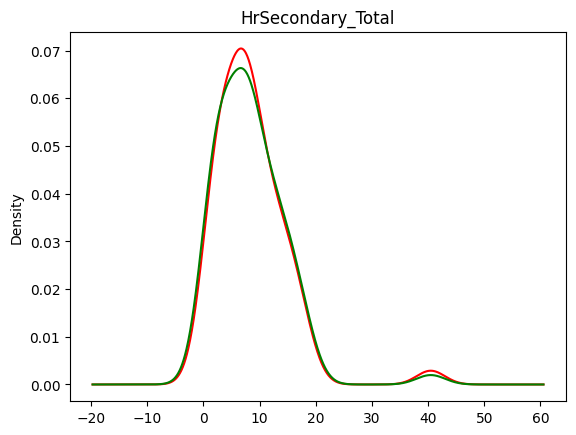

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  new_df[i].plot.density(color='red')
  dropout_ratio[i].plot.density(color='green')

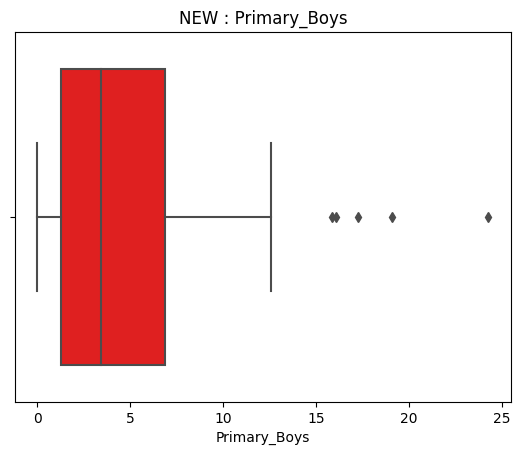

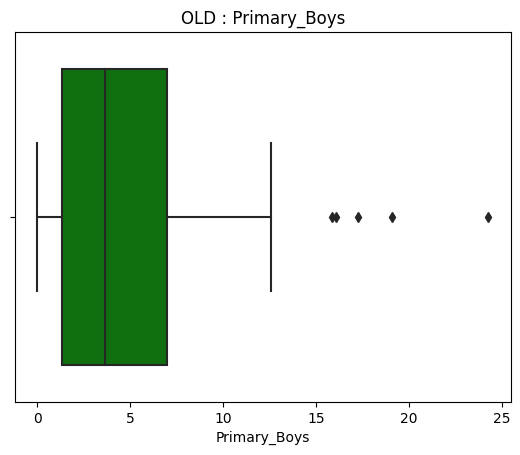

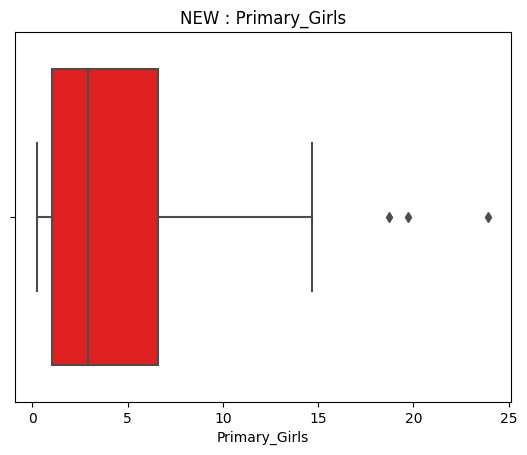

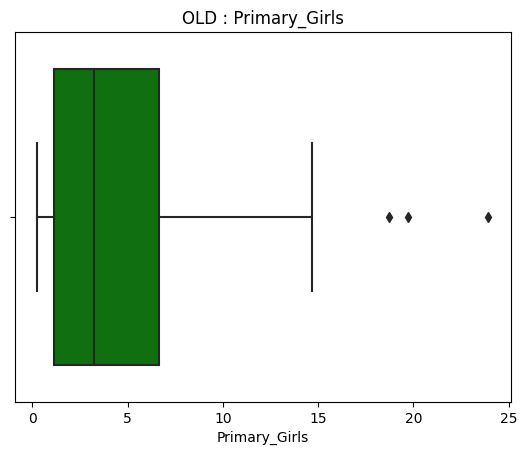

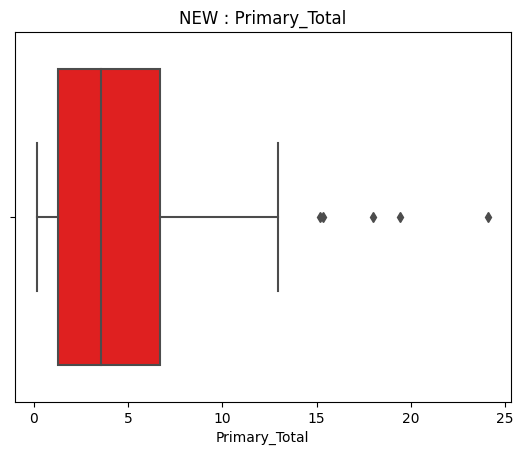

...

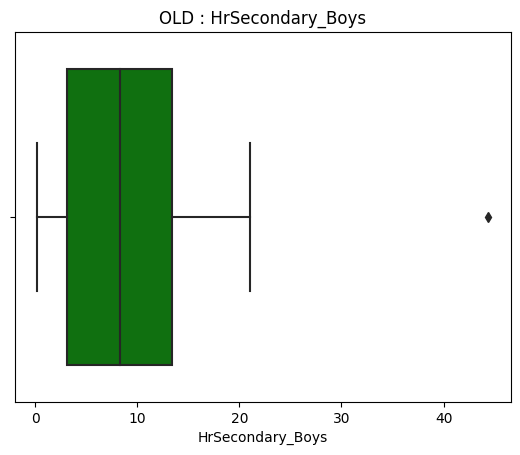

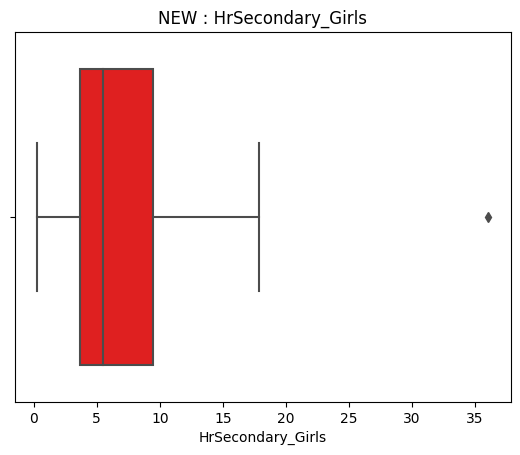

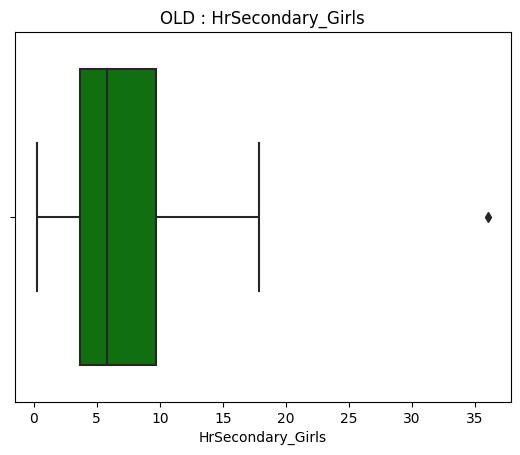

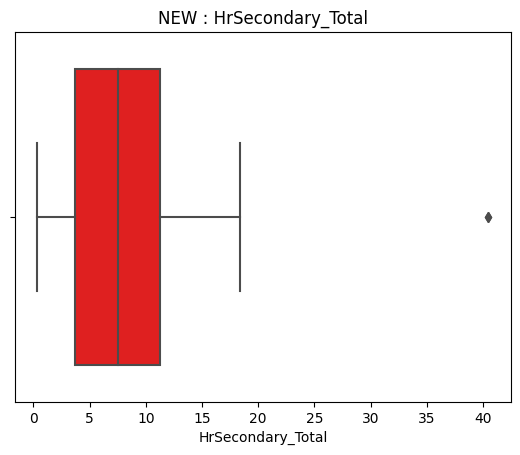

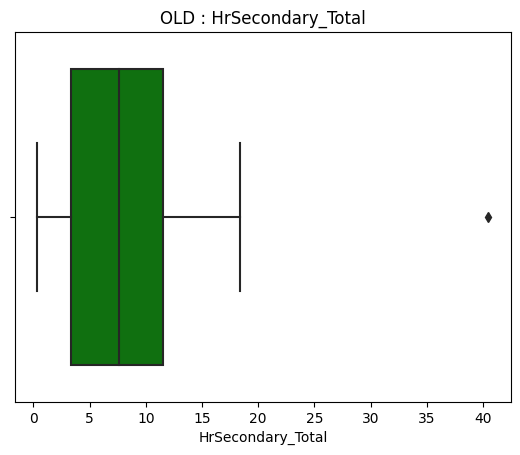

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title("NEW : "+i)
  sns.boxplot(x=new_df[i],color='red')
  plt.show()
  plt.title("OLD : "+i)
  sns.boxplot(x=dropout_ratio[i],color='green')

**I think this can work because main down side of using this method is that it addes randomness to the correlation between variables which should not be an issue and it's expensive during production which is not in the scope**

###Missing indicator

In [ ]:
missing_indicator_dropout_ratio = dropout_ratio.copy()
mi = MissingIndicator()
mi.fit(missing_indicator_dropout_ratio)
missing = mi.transform(missing_indicator_dropout_ratio)

In [ ]:
# If there is even a one missing vallue than it should return true
missing = np.any(missing,axis=1)

In [ ]:
missing_indicator_dropout_ratio['Missing'] = missing

In [ ]:
missing_indicator_dropout_ratio['Missing'].value_counts()

True     55
False    55
Name: Missing, dtype: int64

**Implimentation of this method is little different because im not indicating missing value for each column but rather row wise we can use this value further if we build our own model and see if this missing indicator works**

###Finding best value using grid search cv

In [ ]:
X = dropout_ratio.iloc[:,2:]
y = dropout_ratio.iloc[:,0]
pipe = Pipeline(steps=[('impute', SimpleImputer(missing_values=np.nan)),
                       ('regressor', LogisticRegression())])

# 3 different imputers and 2 different regressors
# a total of 6 different parameter combination will be searched
param_grid = {
    'impute__strategy': ["mean", "median", "most_frequent"],
    'regressor__C': [0.1, 1, 10],  # Example values for the 'C' parameter in Logistic Regression
}


# Run girdsearch
search = GridSearchCV(pipe, param_grid, cv=3)  # Change cv to 3 or another suitable value
# search = GridSearchCV(pipe, param_grid)
search.fit(X, y)


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modu

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('impute', SimpleImputer()),
                                       ('regressor', LogisticRegression())]),
             param_grid={'impute__strategy': ['mean', 'median',
                                              'most_frequent'],
                         'regressor__C': [0.1, 1, 10]})

In [ ]:
print("Best parameter (CV score=%0.3f):" % search.best_score_)
print(search.best_params_)

Best parameter (CV score=0.499):
{'impute__strategy': 'most_frequent', 'regressor__C': 0.1}


**The grid search cv for logistic regression most frequent value is the best but just out of mean median and most frequent**

###KNN imputer (Might work)

In [ ]:
knn_imp = KNNImputer(n_neighbors=3,weights='distance')
knn_imputer_dropout_ratio = dropout_ratio.copy()
knn_imp.fit(knn_imputer_dropout_ratio.iloc[:,2:])
knn_imputer_dropout_ratio.iloc[:,2:] = knn_imp.transform(knn_imputer_dropout_ratio.iloc[:,2:])

In [ ]:
knn_imputer_dropout_ratio

,State_UT,year,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
0,A & N Islands,2012-13,0.83,0.51,0.68,1.259421,1.09,1.23,5.57,5.55,5.56,17.660000,10.150000,14.140000
1,A & N Islands,2013-14,1.35,1.06,1.21,1.611239,1.54,0.51,8.36,5.98,7.20,18.940000,12.200000,15.870000
2,A & N Islands,2014-15,0.47,0.55,0.51,1.440000,1.95,1.69,11.47,8.16,9.87,21.050000,12.210000,16.930000
3,Andhra Pradesh,2012-13,3.30,3.05,3.18,3.210000,3.51,3.36,12.21,13.25,12.72,2.660000,2.406756,0.350000
4,Andhra Pradesh,2013-14,4.31,4.39,4.35,3.460000,4.12,3.78,11.95,13.37,12.65,12.650000,10.850000,11.790000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,West Bengal,2013-14,3.44,2.37,2.91,5.630000,3.10,4.31,16.73,19.77,18.34,8.030000,7.760000,7.900000
106,West Bengal,2014-15,2.13,0.79,1.47,5.840000,2.88,4.30,16.33,19.06,17.80,8.180000,8.040000,8.110000
107,All India,2012-13,4.68,4.66,4.67,2.300000,4.01,3.13,14.54,14.54,14.54,8.318456,7.566740,6.931018
108,All India,2013-14,4.53,4.14,4.34,3.090000,4.49,3.77,17.93,17.79,17.86,1.480000,1.610000,1.540000


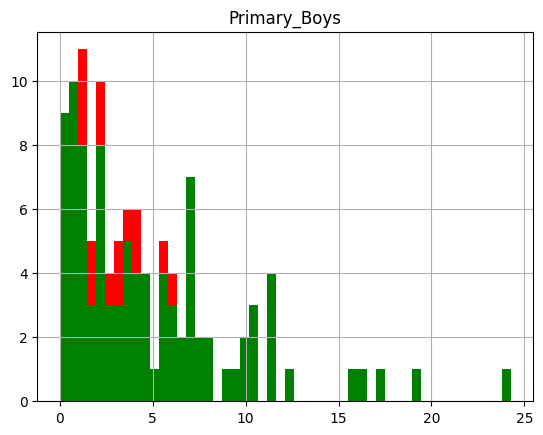

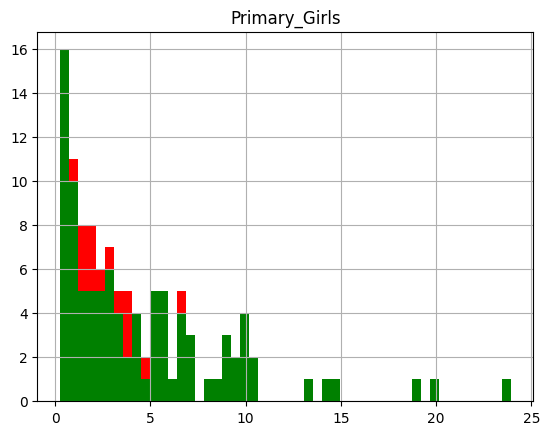

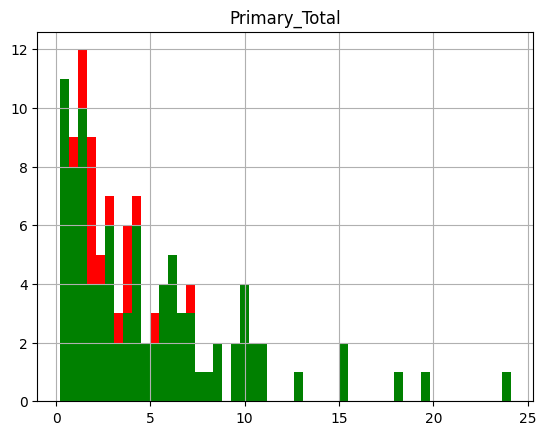

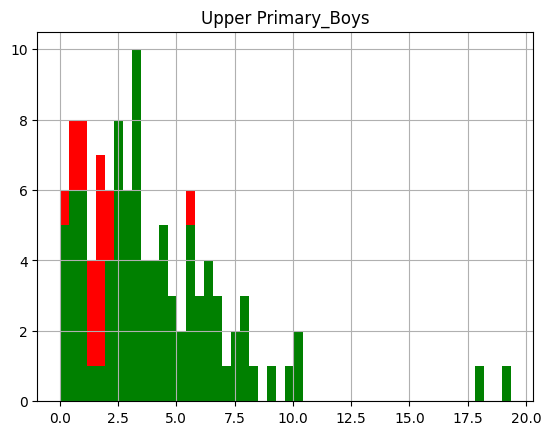

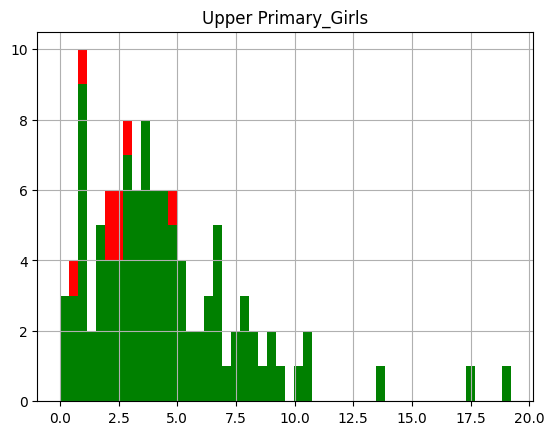

...

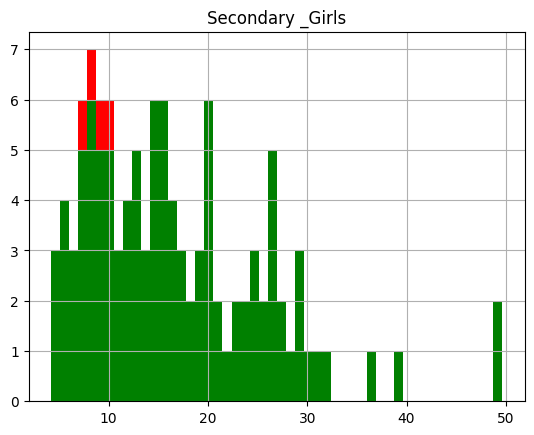

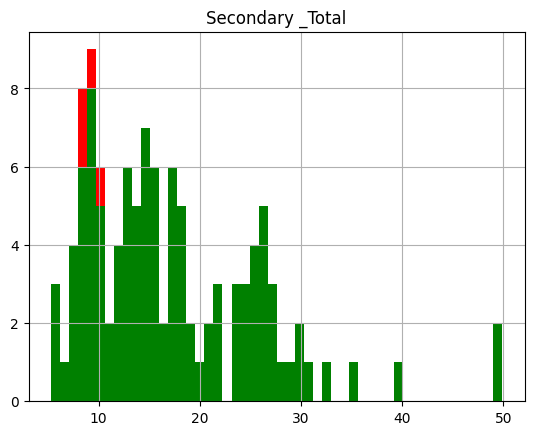

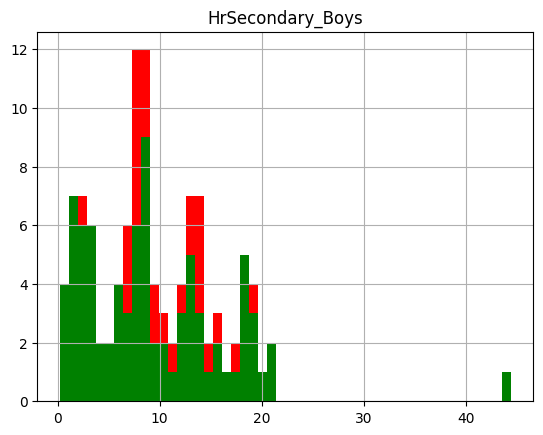

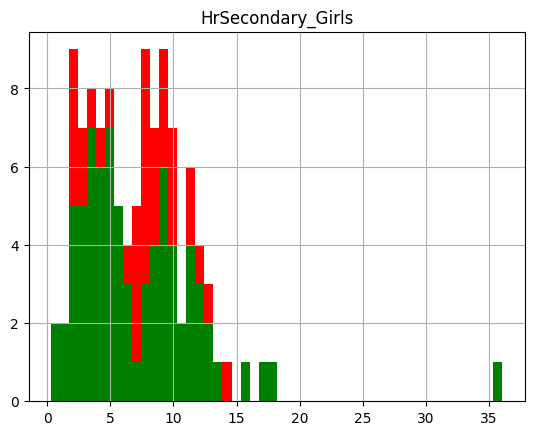

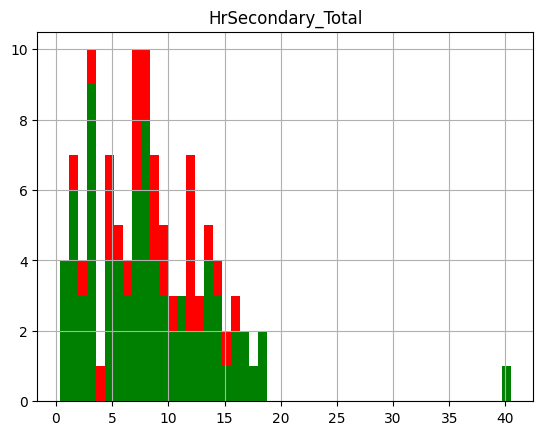

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  knn_imputer_dropout_ratio[i].hist(color='red',bins=50)
  dropout_ratio[i].hist(color='green',bins=50)

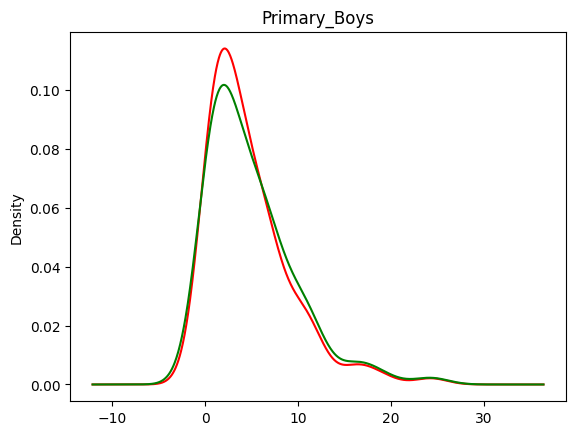

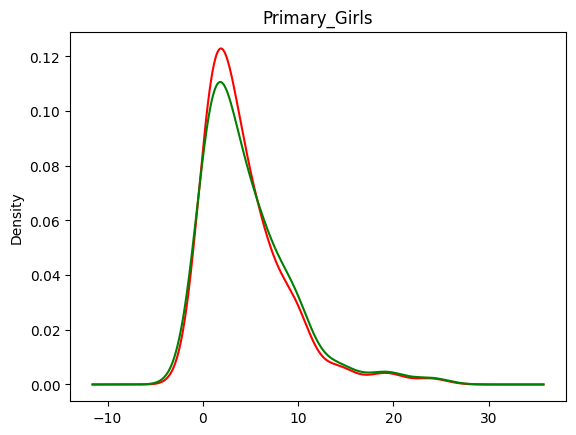

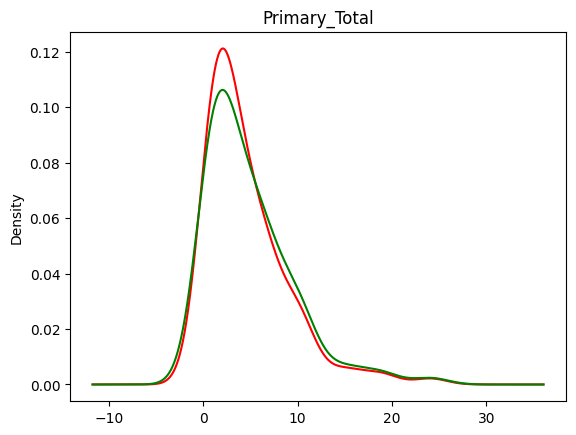

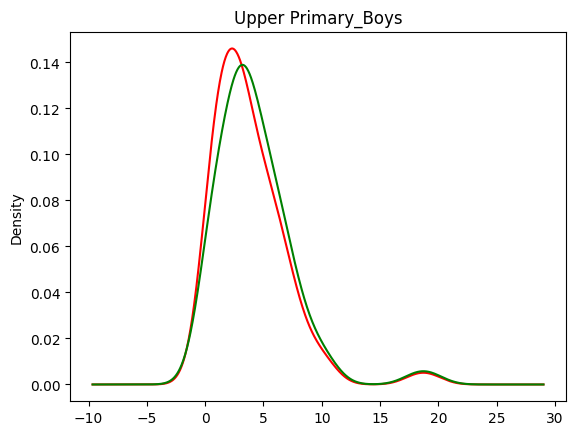

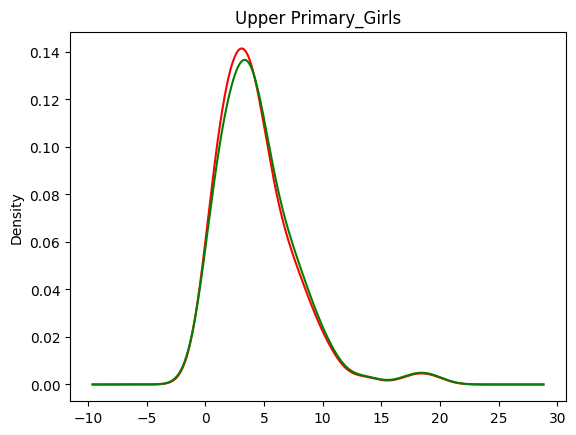

...

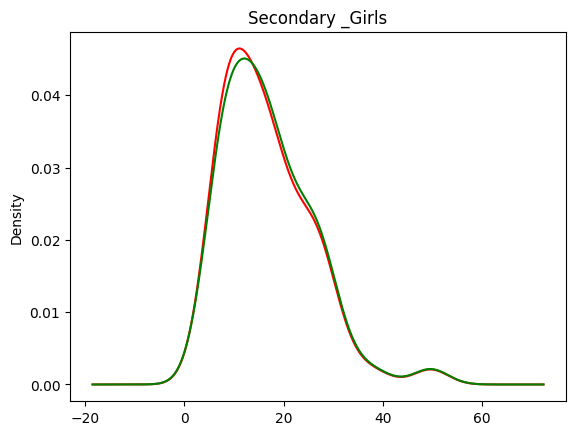

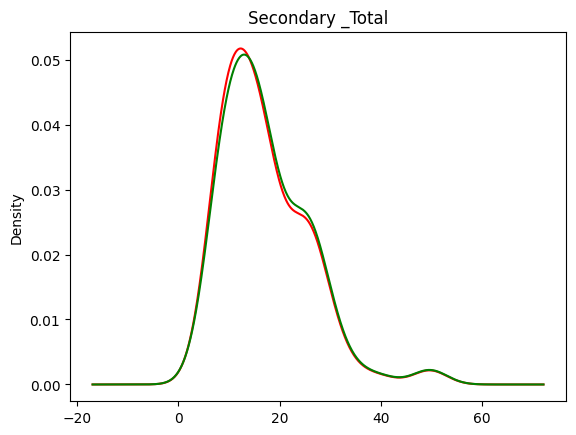

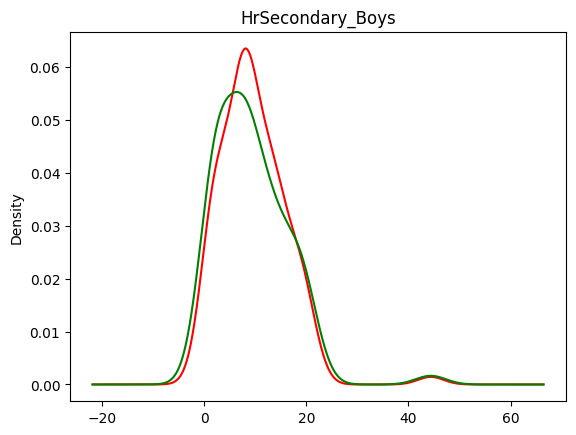

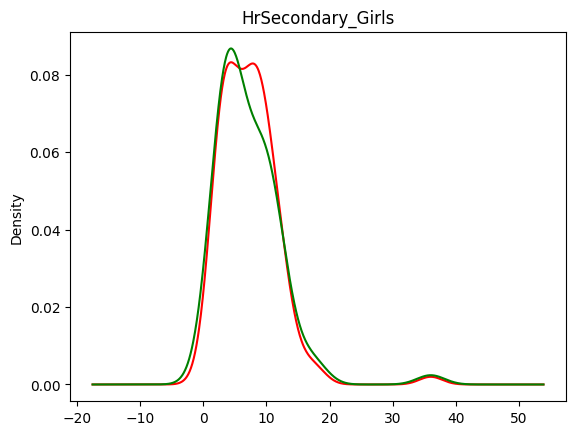

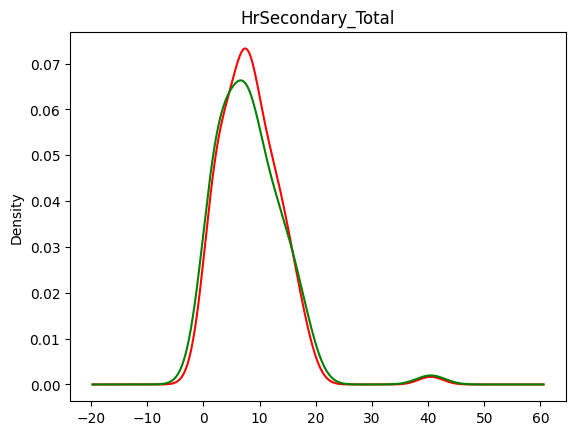

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  knn_imputer_dropout_ratio[i].plot.density(color='red')
  dropout_ratio[i].plot.density(color='green')

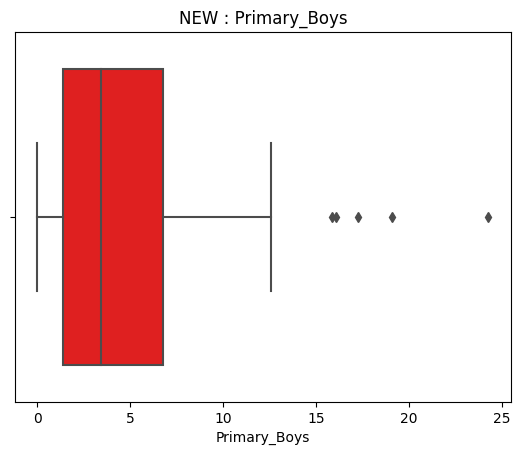

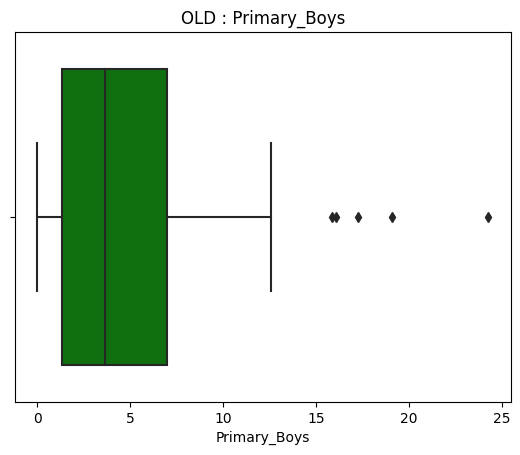

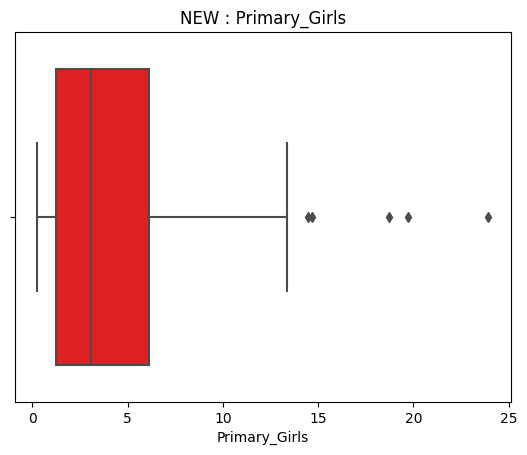

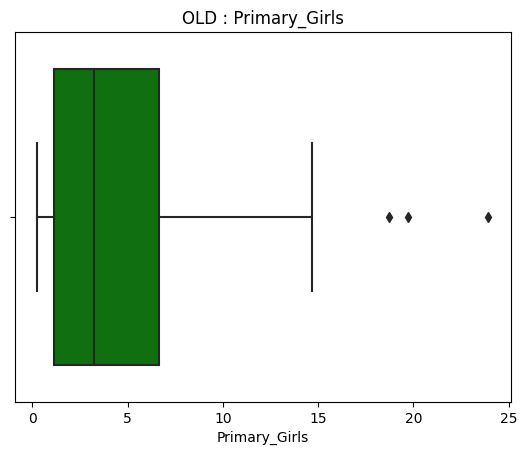

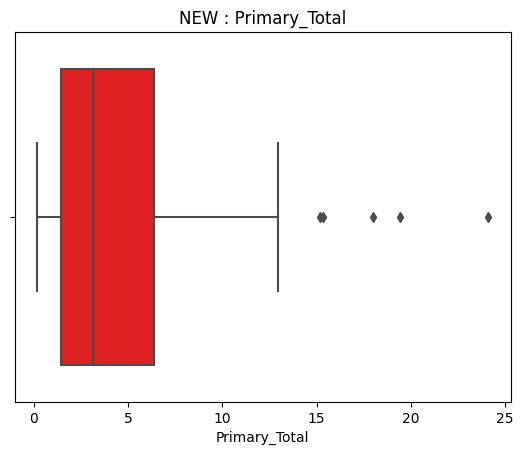

...

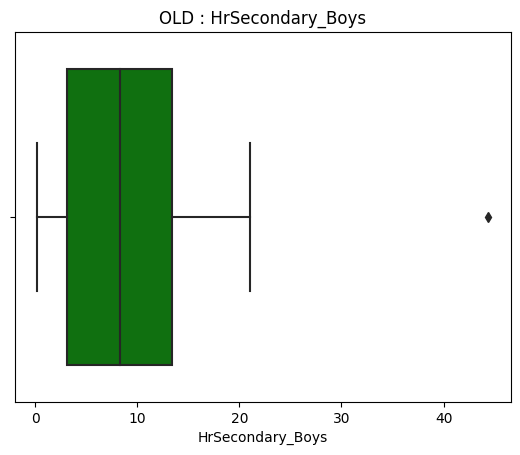

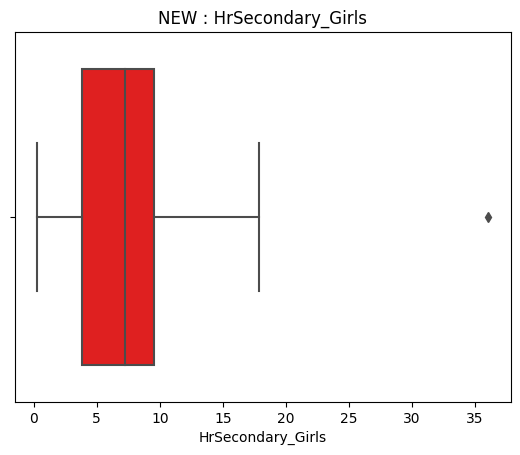

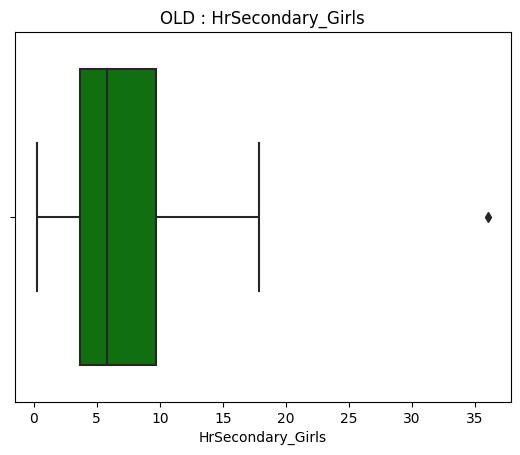

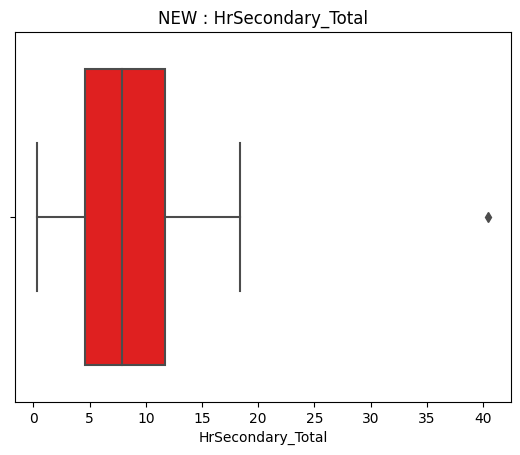

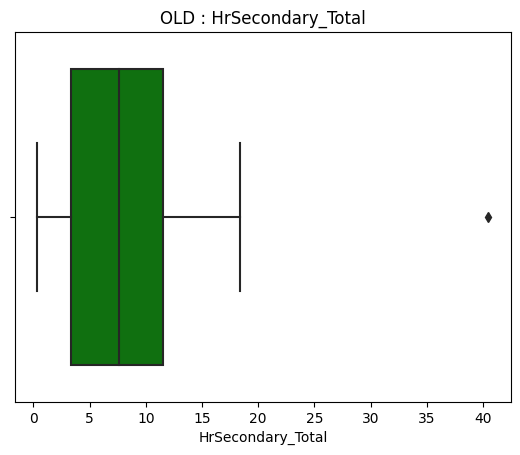

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title("NEW : "+i)
  sns.boxplot(x=knn_imputer_dropout_ratio[i],color='red')
  plt.show()
  plt.title("OLD : "+i)
  sns.boxplot(x=dropout_ratio[i],color='green')

**The disadvantage of this method is that it takes moure computation but since data is small it won't matter and we can use this if it improves the model's accuracy**

###MICE (Multivariate Imputation By Chained Equations) or iterative algorithm

In [ ]:
mice = IterativeImputer()
mice_values = mice.fit_transform(dropout_ratio.iloc[:,2:])

In [ ]:
mice_dropout_ratio = dropout_ratio.copy()
mice_dropout_ratio.iloc[:,2:] = mice_values

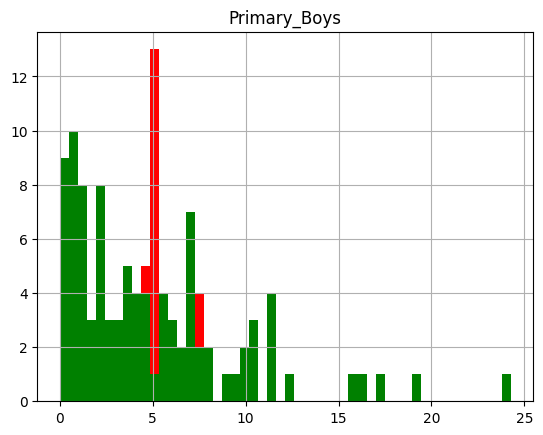

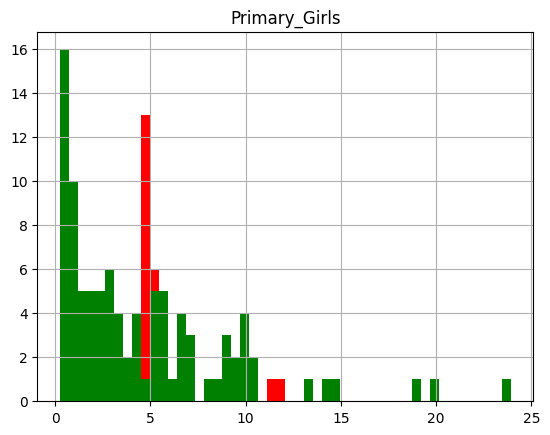

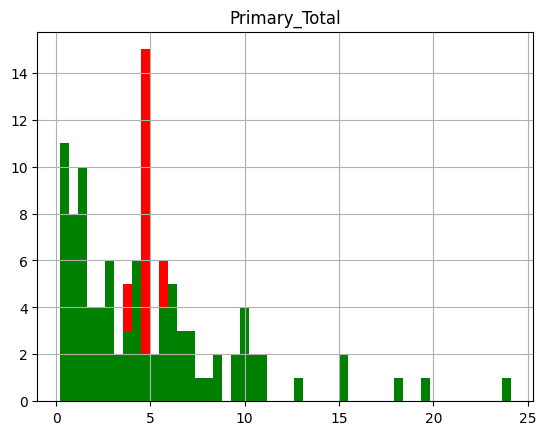

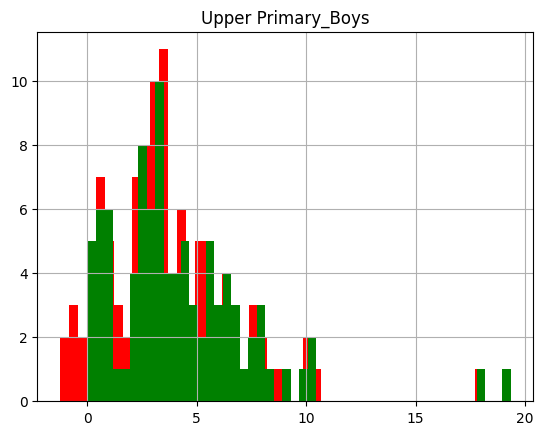

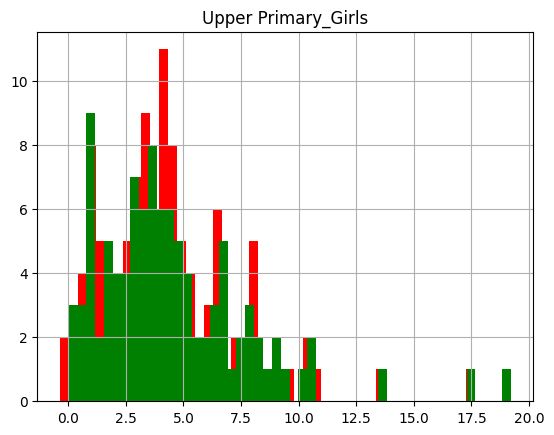

...

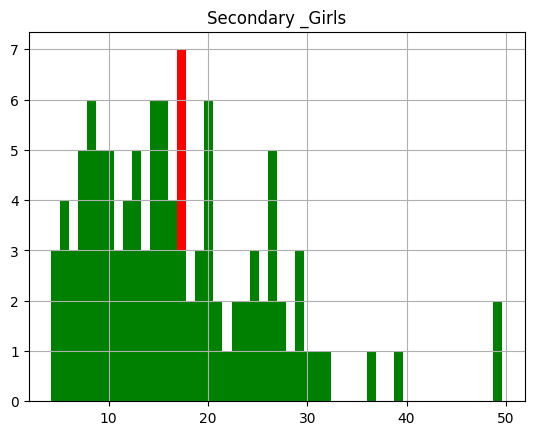

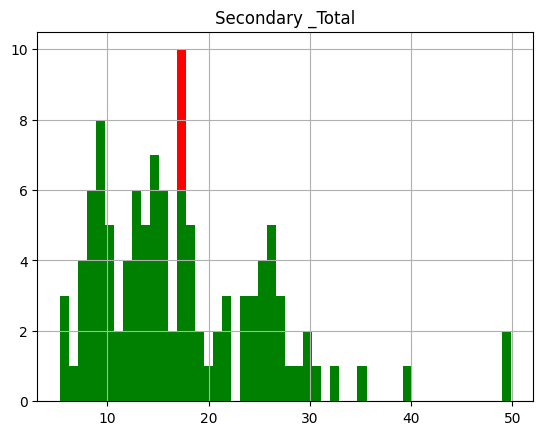

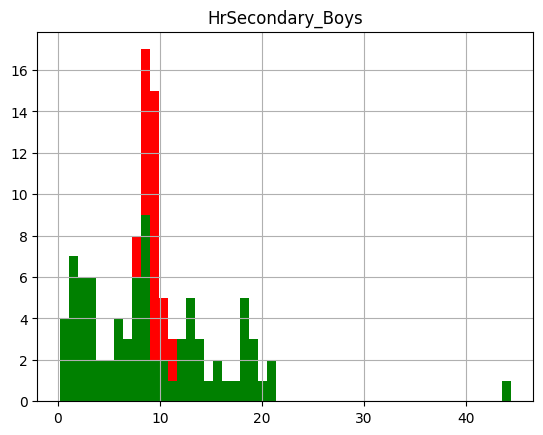

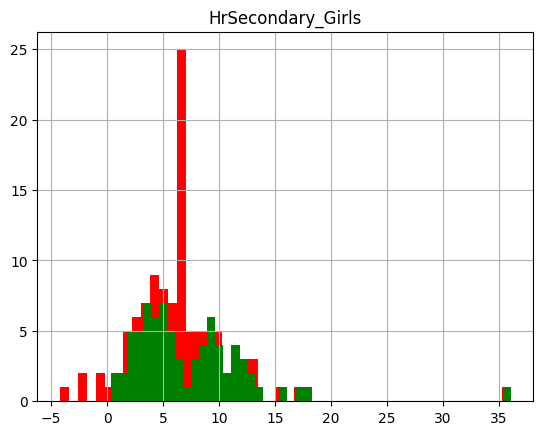

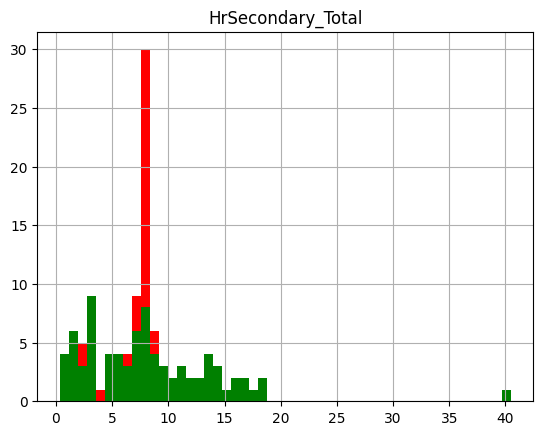

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  mice_dropout_ratio[i].hist(color='red',bins=50)
  dropout_ratio[i].hist(color='green',bins=50)

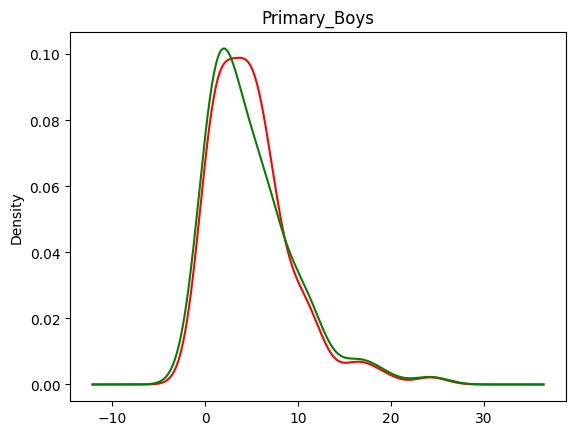

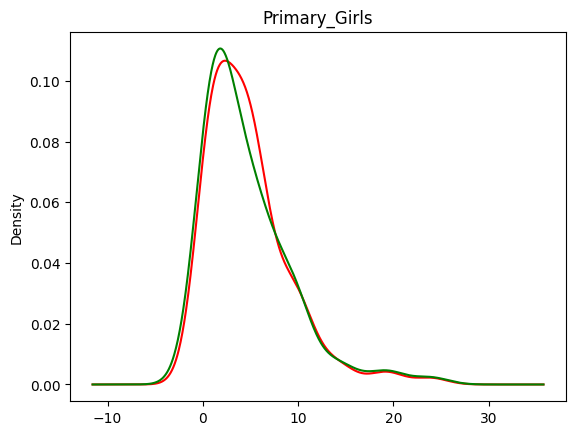

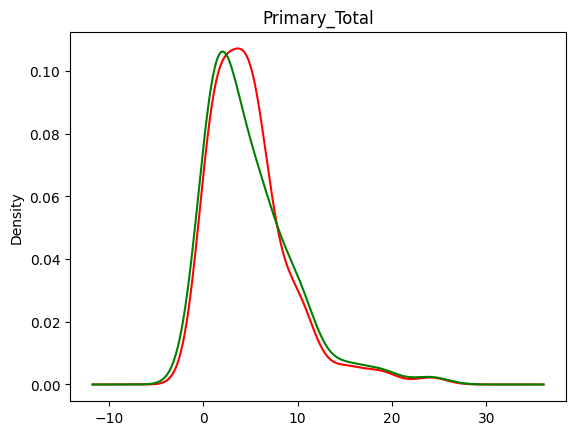

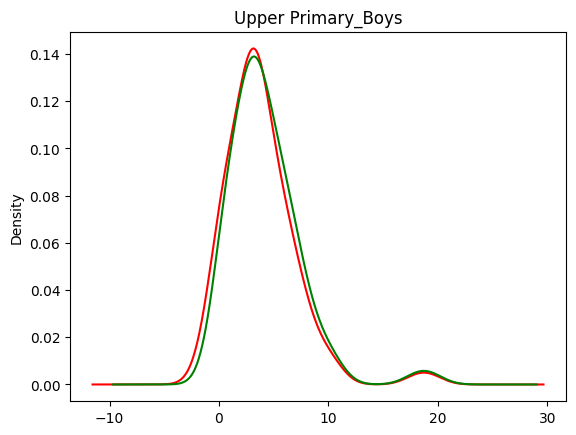

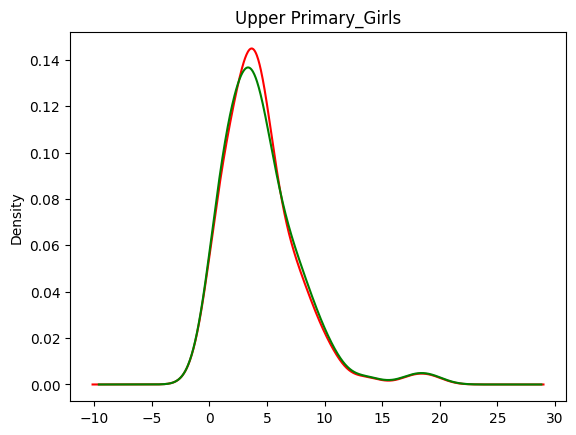

...

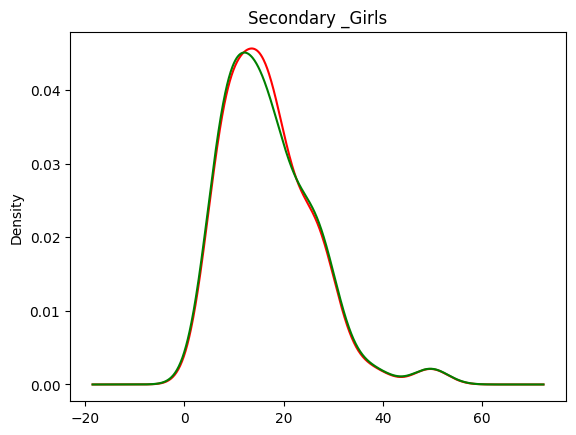

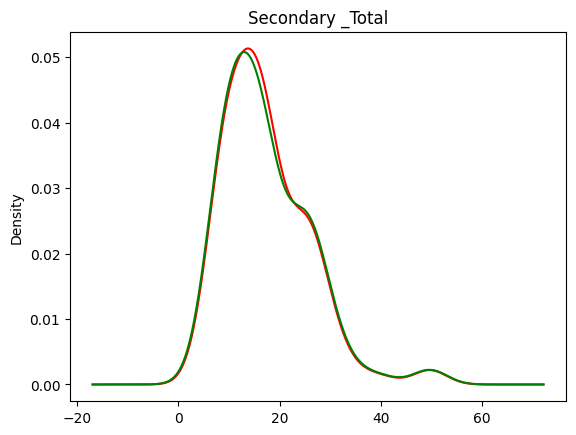

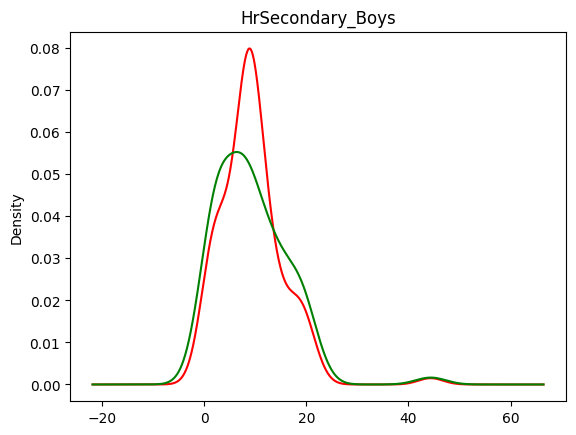

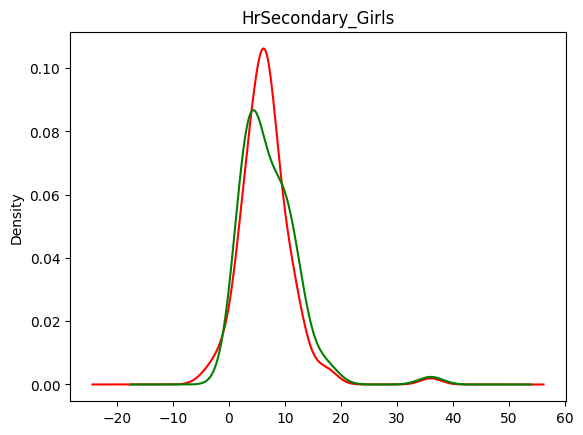

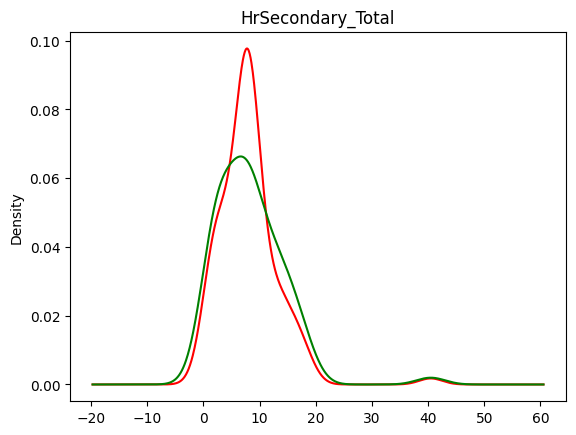

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot()
  plt.title(i)
  mice_dropout_ratio[i].plot.density(color='red')
  dropout_ratio[i].plot.density(color='green')

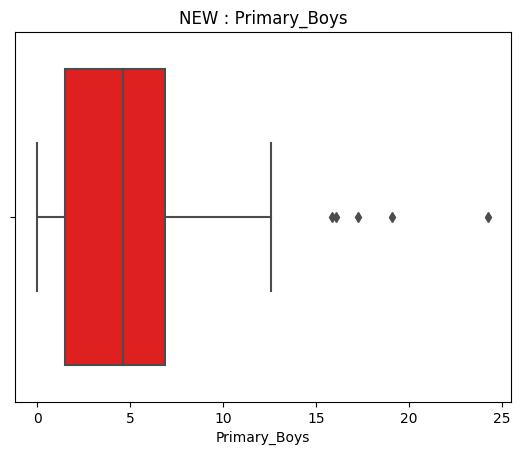

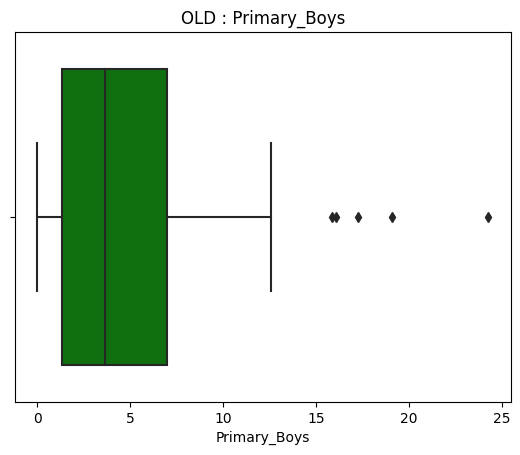

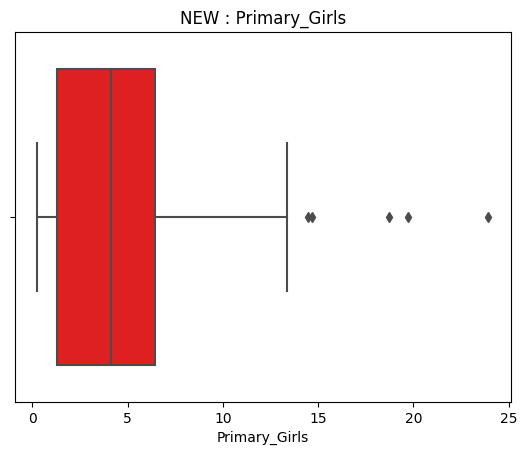

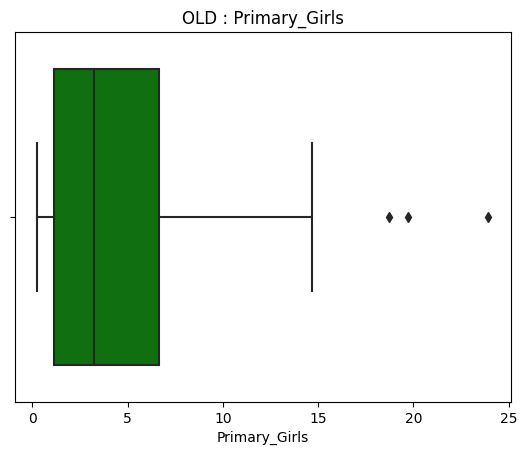

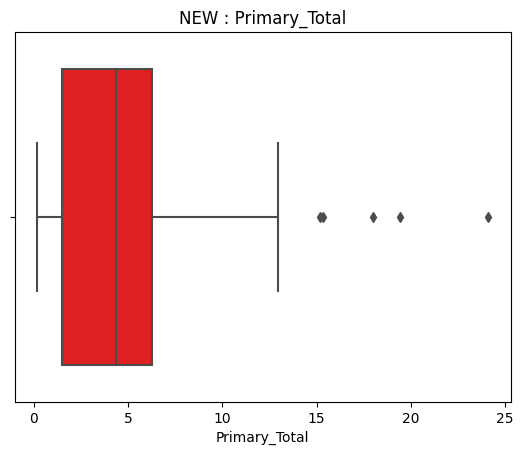

...

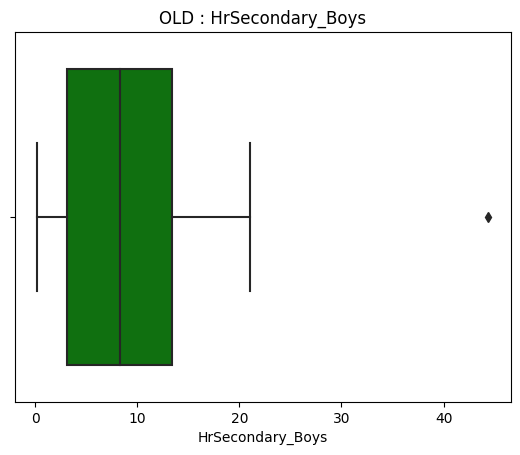

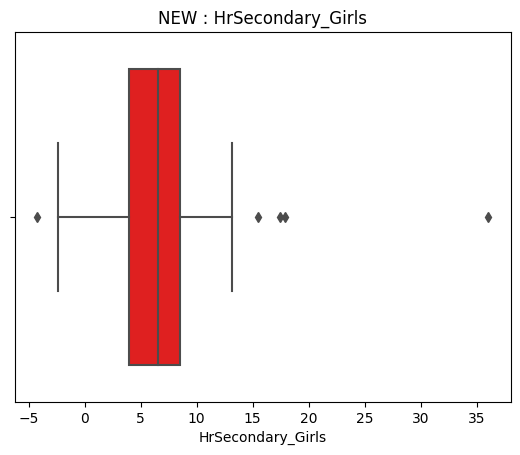

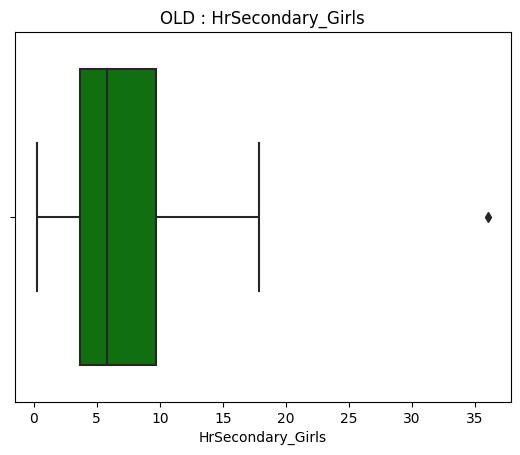

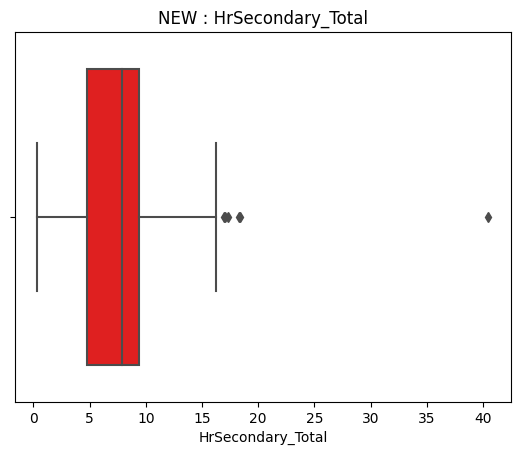

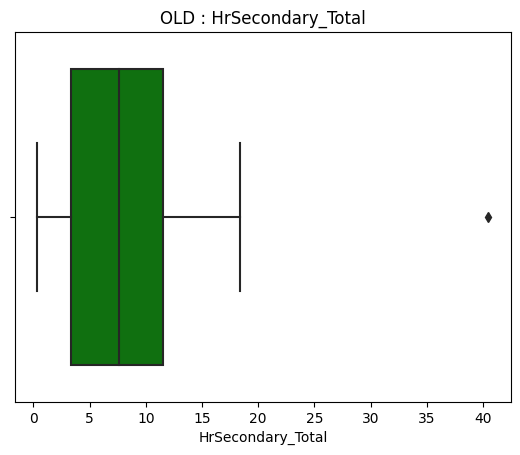

In [ ]:
for i in dropout_ratio.iloc[:,2:].columns:
  fig = plt.figure()
  ax = fig.add_subplot(111)
  plt.title("NEW : "+i)
  sns.boxplot(x=mice_dropout_ratio[i],color='red')
  plt.show()
  plt.title("OLD : "+i)
  sns.boxplot(x=dropout_ratio[i],color='green')

##Outlier detection and removal

###Z-score method

<ipython-input-82-b770fcab763b>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(yeo_val.iloc[:,0])


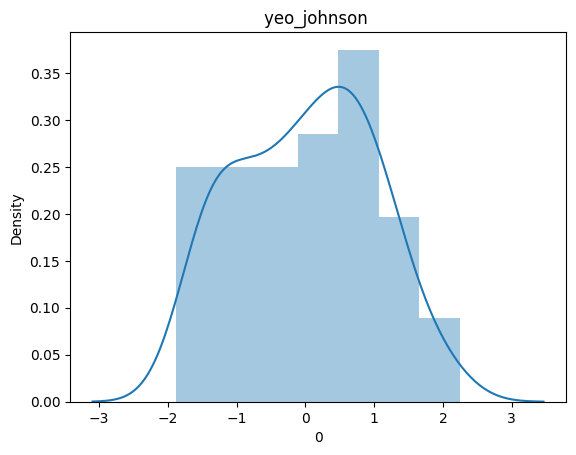

<ipython-input-82-b770fcab763b>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(box_cox_val.iloc[:,0])


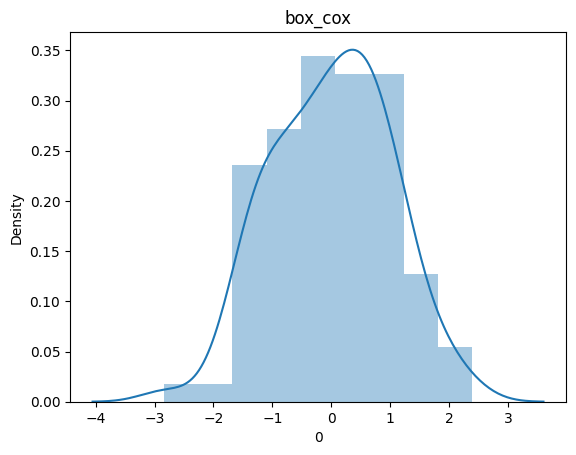

<ipython-input-82-b770fcab763b>:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dropout_ratio.iloc[:,2])


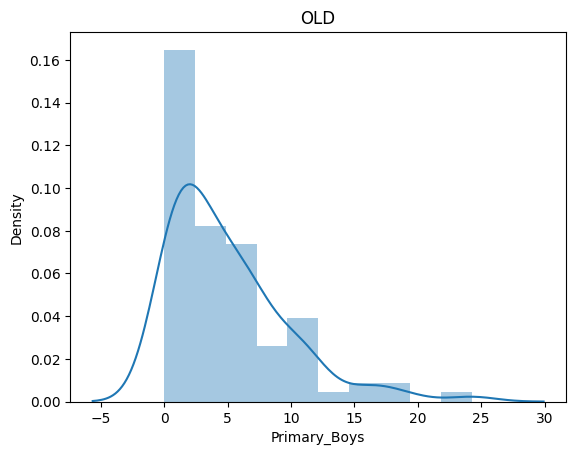

Yeo ->  -0.005853647208340731
Box_Cox ->  -0.12262179706203298
Normal ->  1.5427814319600448


In [ ]:
# To apply this method we would need the data to be normally distributed in following code i tried to achieve that using yeo_johnson and box_cox
yeo = PowerTransformer(method='yeo-johnson')
box_cox = PowerTransformer(method='box-cox')
yeo_val = pd.DataFrame(yeo.fit_transform(dropout_ratio.iloc[:,2:]))
box_cox_val = pd.DataFrame(box_cox.fit_transform(dropout_ratio.iloc[:,2:]+0.000001))
plt.title('yeo_johnson ')
sns.distplot(yeo_val.iloc[:,0])
plt.show()
plt.title('box_cox')
sns.distplot(box_cox_val.iloc[:,0])
plt.show()
plt.title("OLD")
sns.distplot(dropout_ratio.iloc[:,2])
plt.show()
print("Yeo -> ",yeo_val.iloc[:,0].skew())
print("Box_Cox -> ",box_cox_val.iloc[:,0].skew())
print("Normal -> ",dropout_ratio.iloc[:,2].skew())

In [ ]:
upper_limit = []
lower_limit = []
for i in range(0,12):
  lower_limit.append(yeo_val[i].mean()-3*yeo_val[i].std())
  upper_limit.append(yeo_val[i].mean()+3*yeo_val[i].std())

**Trimming**

In [ ]:
z_score_trim_dropout_ratio = yeo_val.copy()
for index in range(0,12):
  z_score_trim_dropout_ratio[index] = yeo_val.loc[(yeo_val[index] < upper_limit[index]) & (yeo_val[index] > lower_limit[index])][index]

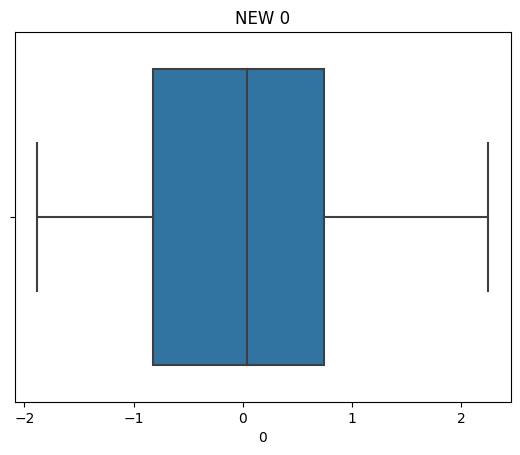

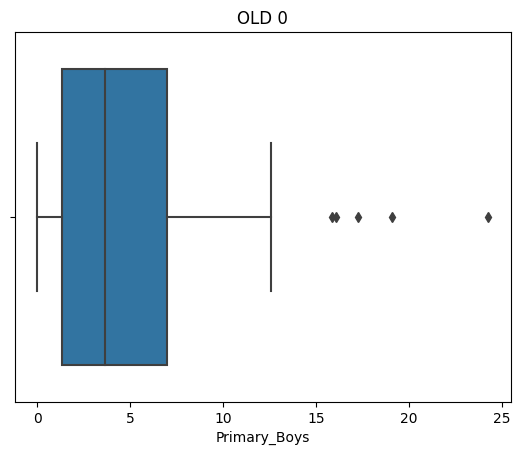

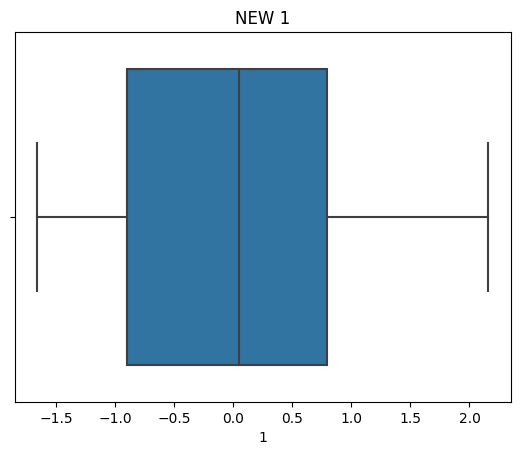

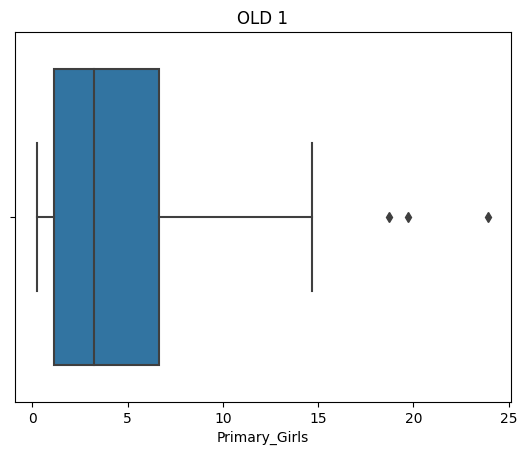

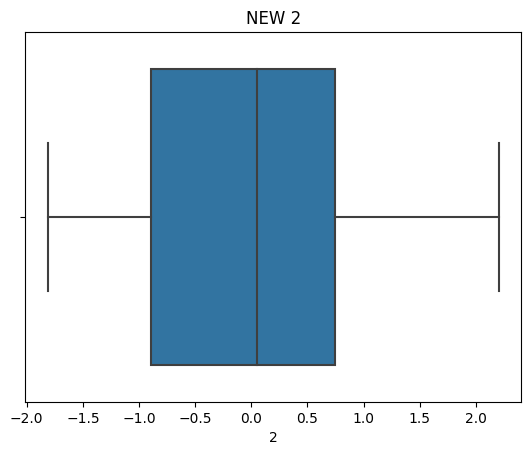

...

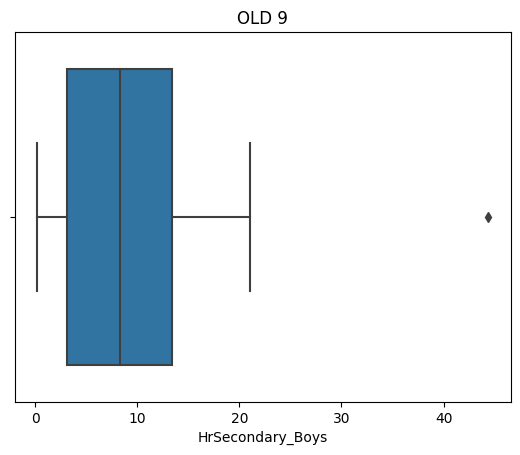

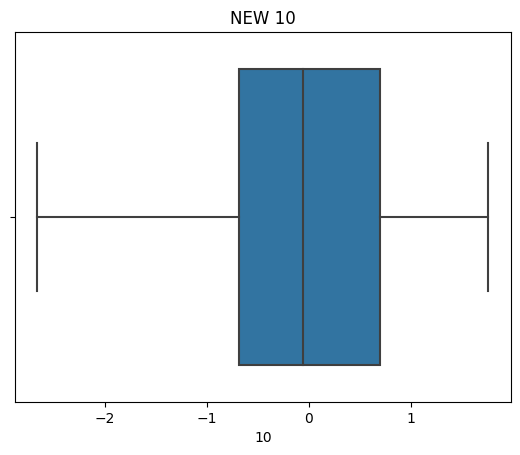

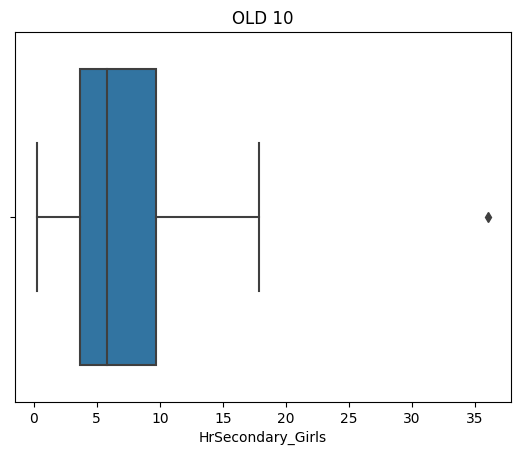

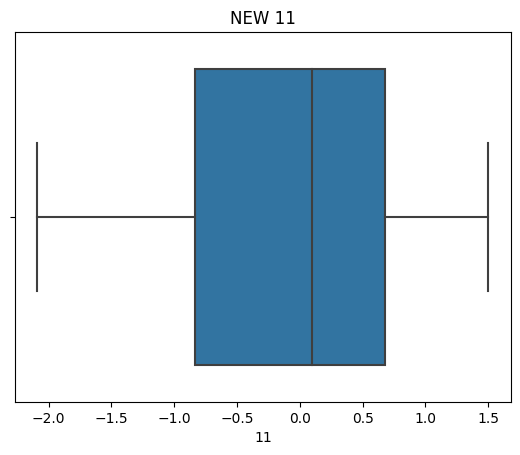

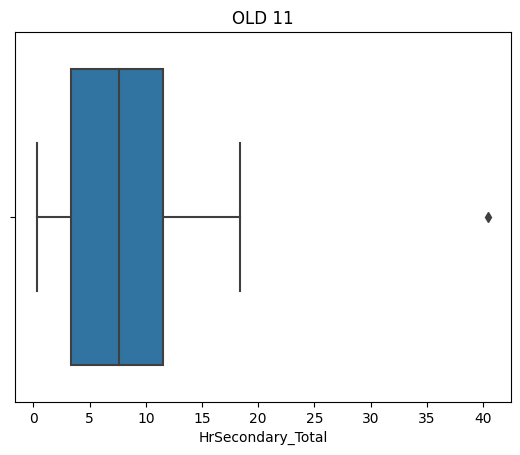

In [ ]:
for i in range(0,12):
  plt.title(f"NEW {i}")
  sns.boxplot(x=z_score_trim_dropout_ratio[i])
  plt.show()
  plt.title(f"OLD {i}")
  sns.boxplot(x=dropout_ratio.iloc[:,i+2])
  plt.show()

**Capping**

In [ ]:
z_score_cap_dropout_ratio = yeo_val.copy()
for index in range(0,12):
  z_score_cap_dropout_ratio[index] = np.where(yeo_val[index] > upper_limit[index],upper_limit[index],
                                               np.where(yeo_val[index] < lower_limit[index],lower_limit[index],yeo_val[index]))

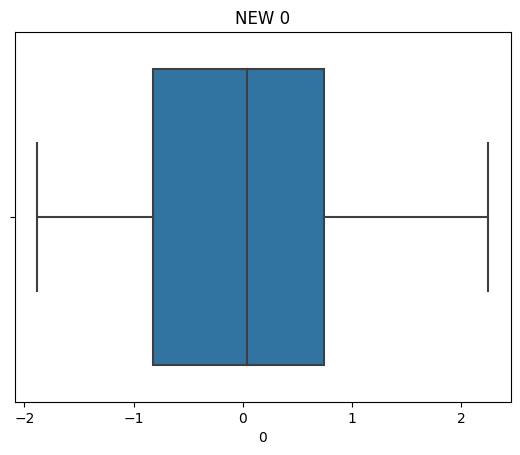

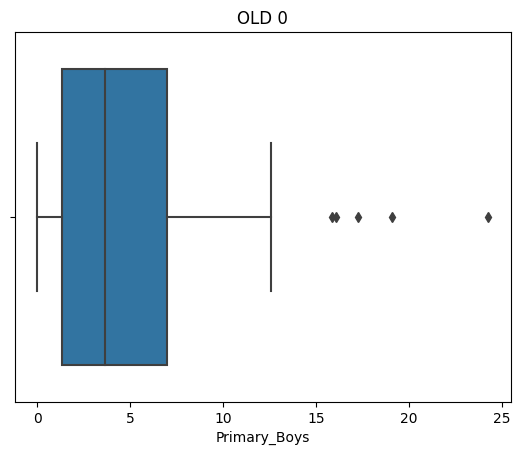

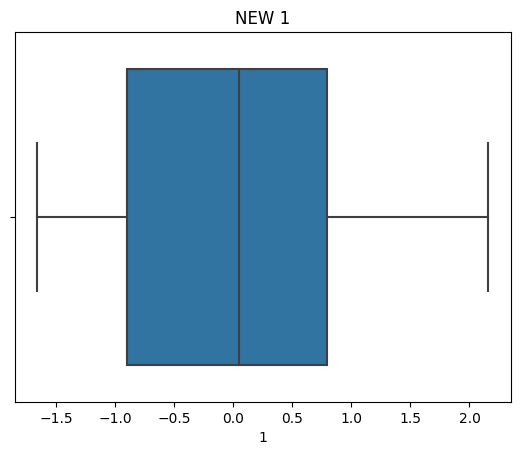

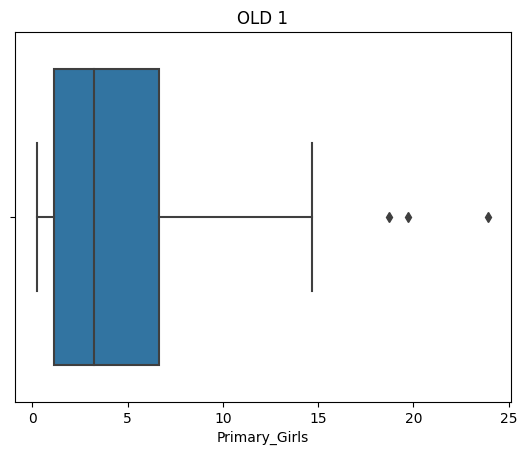

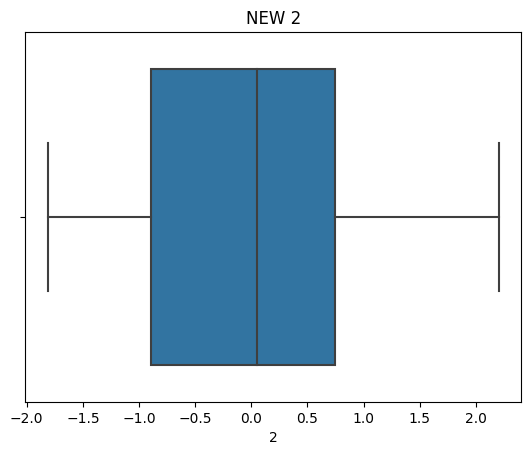

...

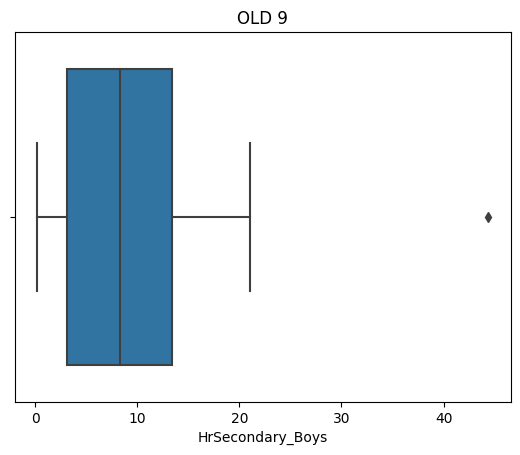

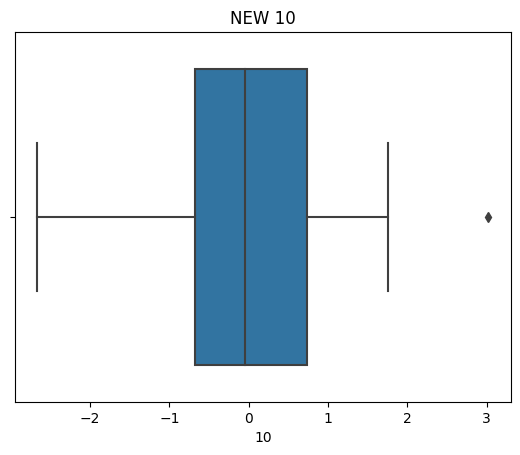

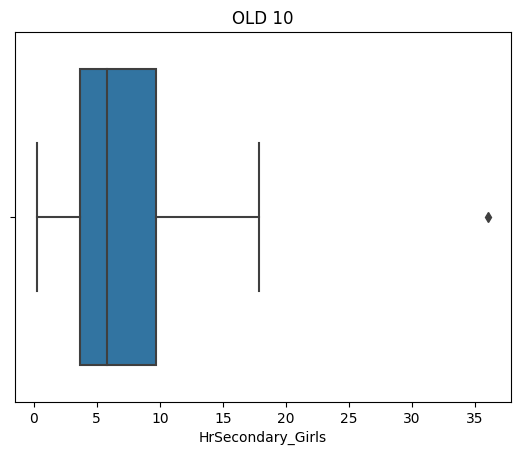

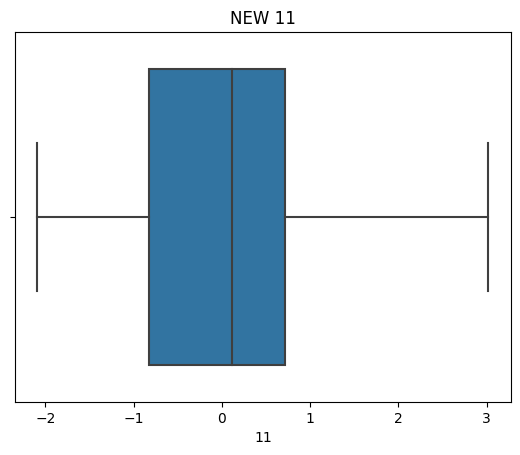

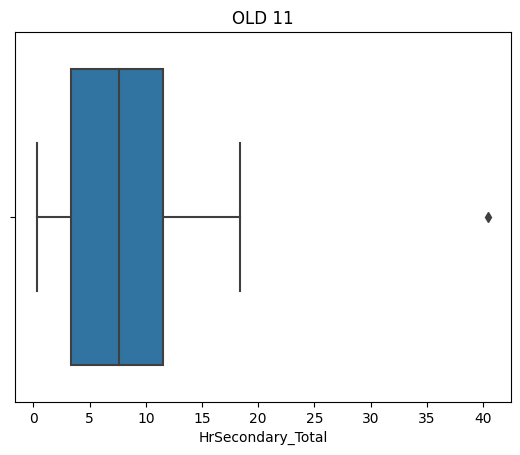

In [ ]:
for i in range(0,12):
  plt.title(f"NEW {i}")
  sns.boxplot(x=z_score_cap_dropout_ratio[i])
  plt.show()
  plt.title(f"OLD {i}")
  sns.boxplot(x=dropout_ratio.iloc[:,i+2])
  plt.show()

###IQR Method

In [ ]:
iqr_upper = []
iqr_lower = []
for i in dropout_ratio.iloc[:,2:]:
  iqr_upper.append((dropout_ratio[i].quantile(0.75)) + 1.5 * (dropout_ratio[i].quantile(0.75) - dropout_ratio[i].quantile(0.25)))
  iqr_lower.append((dropout_ratio[i].quantile(0.25)) - 1.5 * (dropout_ratio[i].quantile(0.75) - dropout_ratio[i].quantile(0.25)))

**Trimming**

In [ ]:
iqr_trim_dropout_ratio = dropout_ratio.copy()
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  iqr_trim_dropout_ratio[i] = dropout_ratio.loc[(dropout_ratio[i] < iqr_upper[index]) & (dropout_ratio[i] > iqr_lower[index])][i]

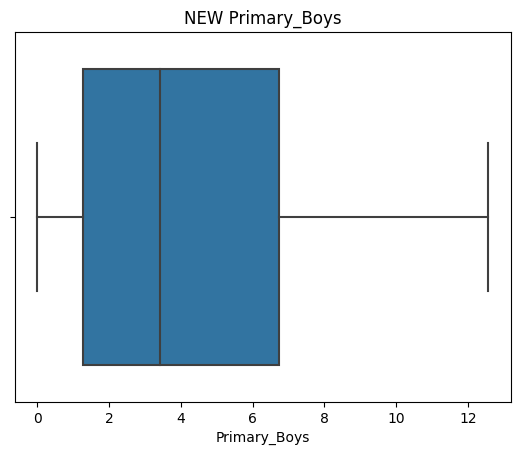

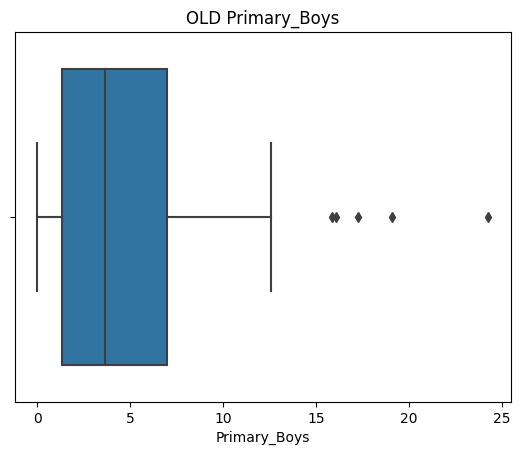

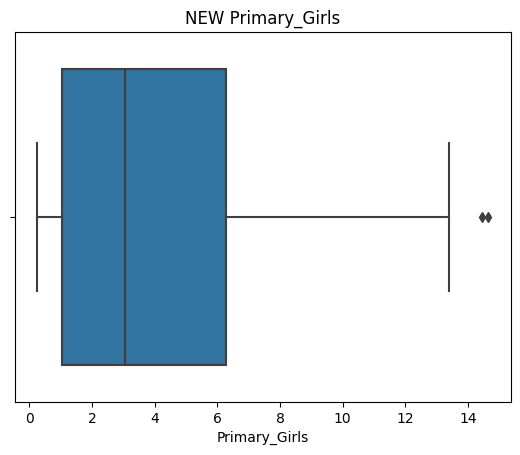

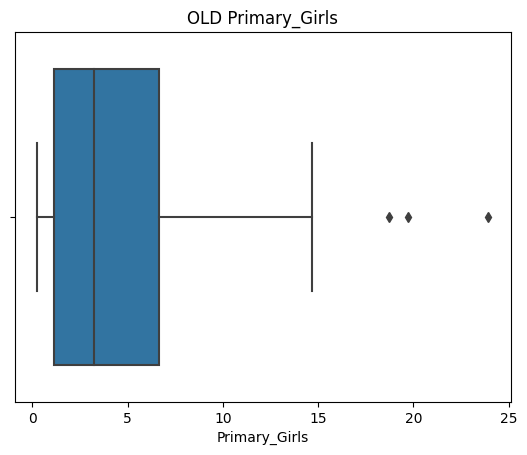

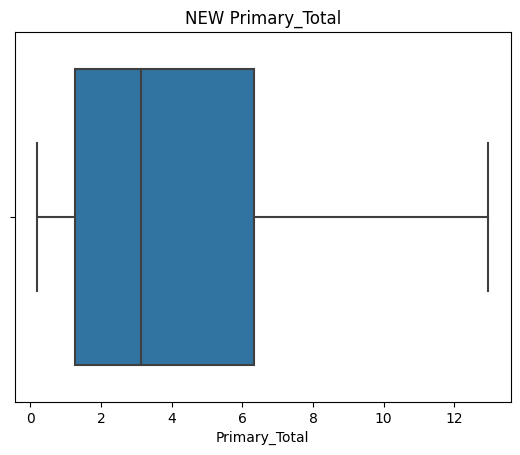

...

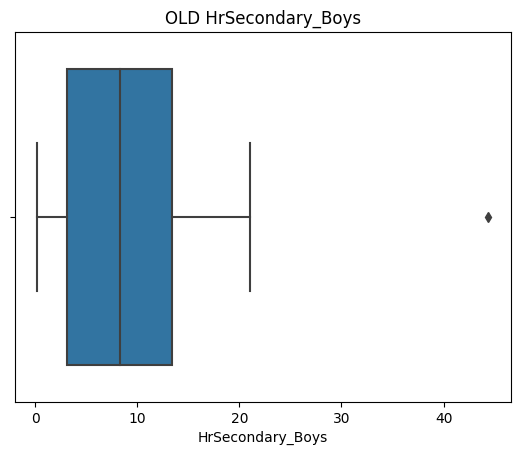

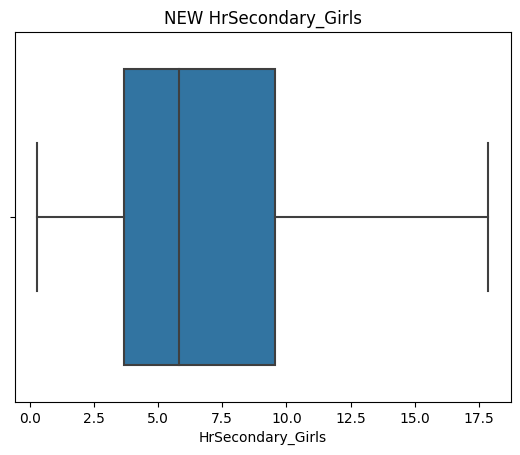

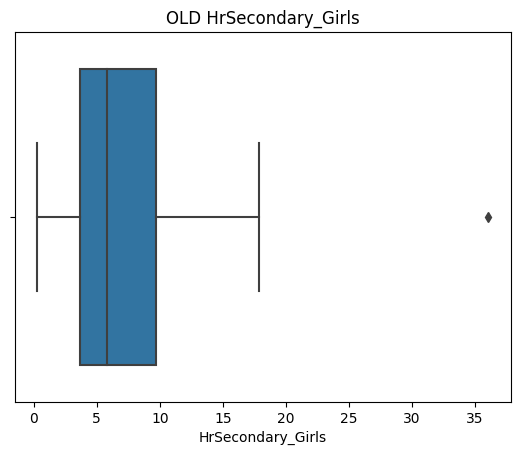

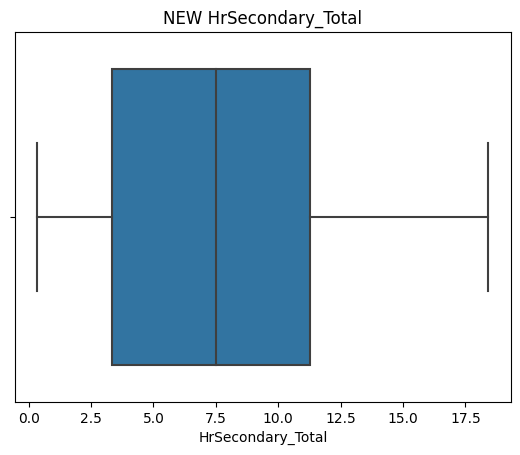

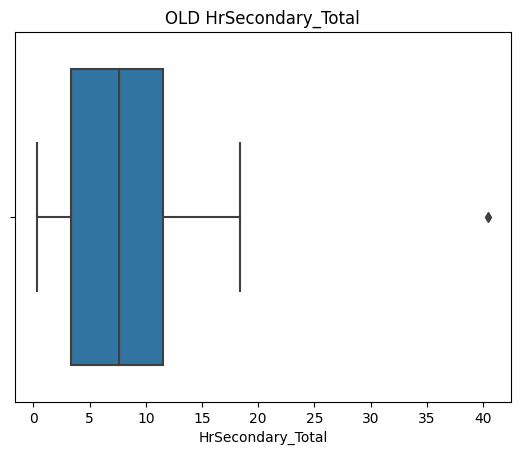

In [ ]:
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  plt.title(f"NEW {i}")
  sns.boxplot(x=iqr_trim_dropout_ratio[i])
  plt.show()
  plt.title(f"OLD {i}")
  sns.boxplot(x=dropout_ratio[i])
  plt.show()

**Capping (Might work)**

In [ ]:
iqr_cap_dropout_ratio = dropout_ratio.copy()
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  iqr_cap_dropout_ratio[i] = np.where(dropout_ratio[i] > iqr_upper[index],iqr_upper[index],
                                               np.where(dropout_ratio[i] < iqr_lower[index],iqr_lower[index],dropout_ratio[i]))

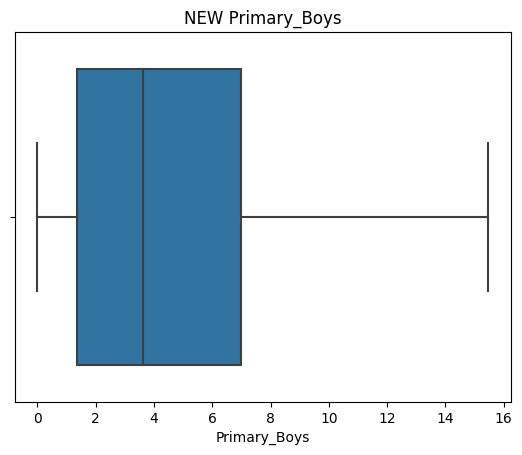

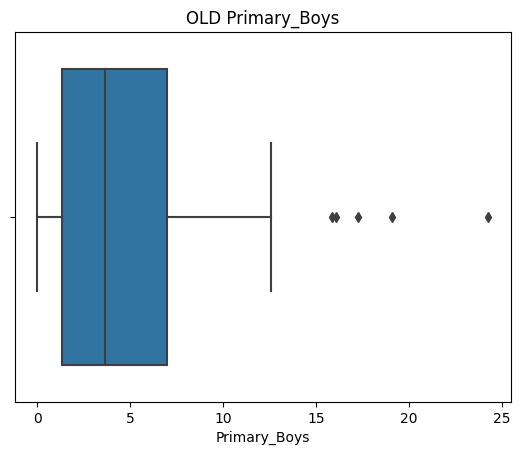

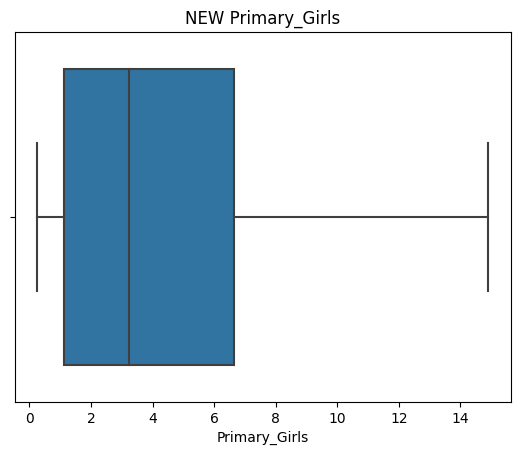

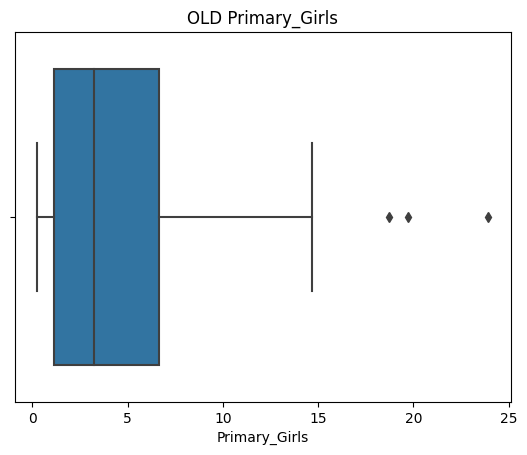

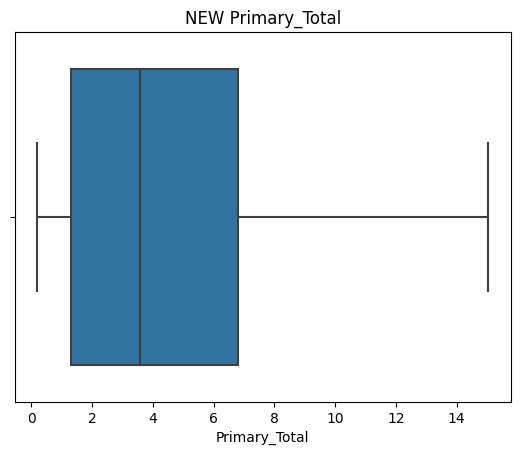

...

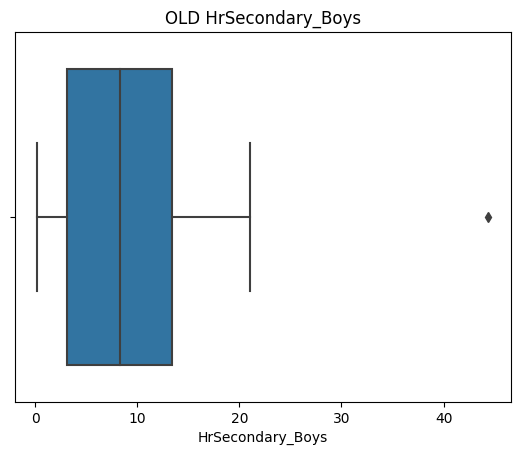

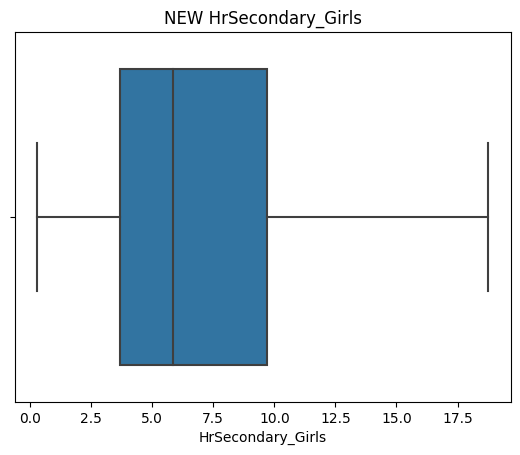

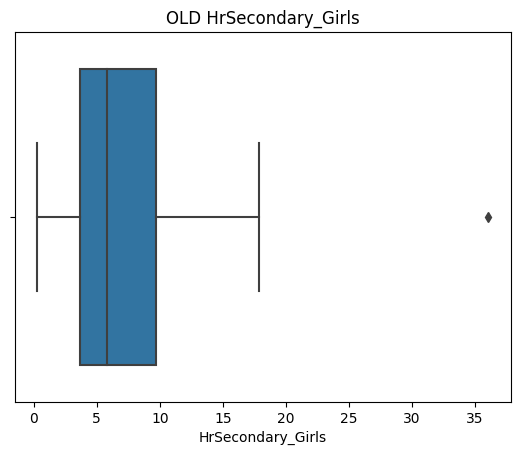

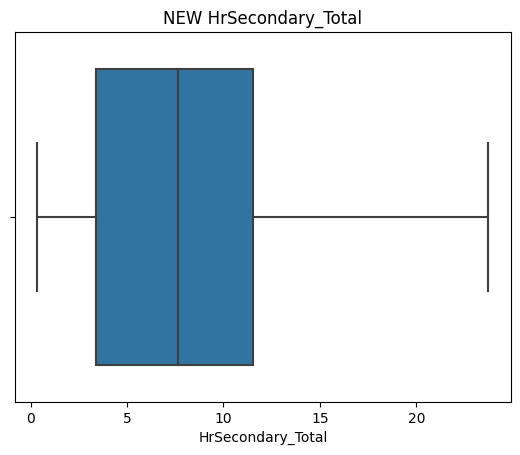

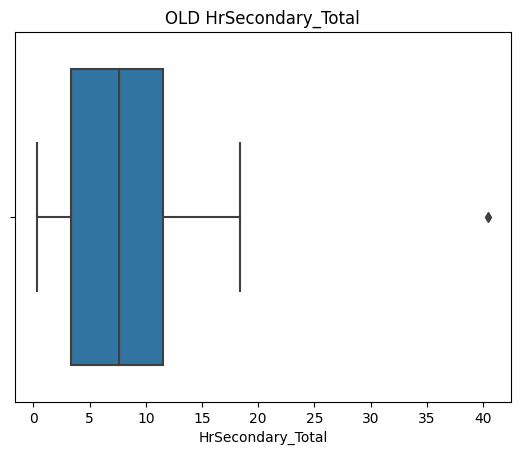

In [ ]:
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  plt.title(f"NEW {i}")
  sns.boxplot(x=iqr_cap_dropout_ratio[i])
  plt.show()
  plt.title(f"OLD {i}")
  sns.boxplot(x=dropout_ratio[i])
  plt.show()

**This method removed all the outliers and without turning it into normal distribution like z score method**

###Percentile method / Winsorization Technique -

In [ ]:
higher_percent = []
lower_percent = []
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  higher_percent.append( dropout_ratio[i].quantile(0.95))
  lower_percent.append( dropout_ratio[i].quantile(0.5))

**Trimming (Might work)**

In [ ]:
percent_trim_dropout_ratio = dropout_ratio.copy()
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  percent_trim_dropout_ratio[i] = dropout_ratio.loc[(dropout_ratio[i] < higher_percent[index]) & (dropout_ratio[i] > lower_percent[index])][i]

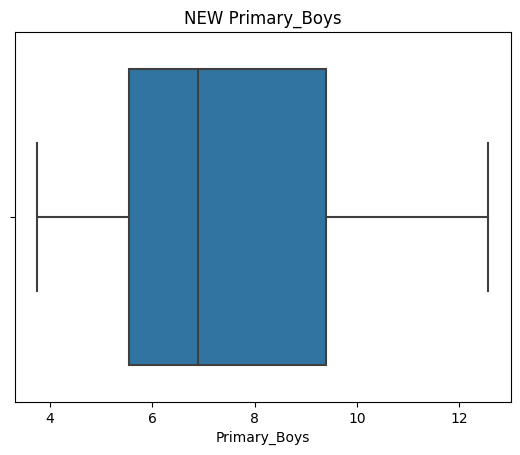

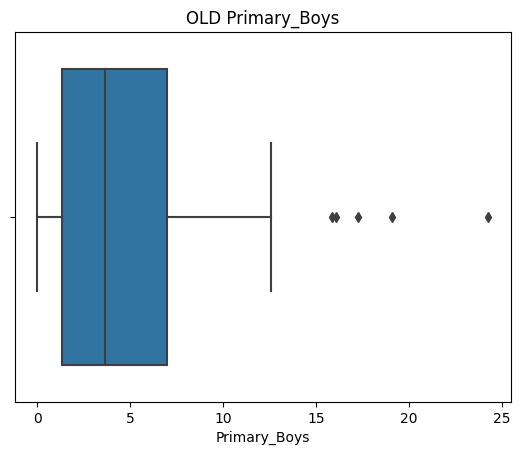

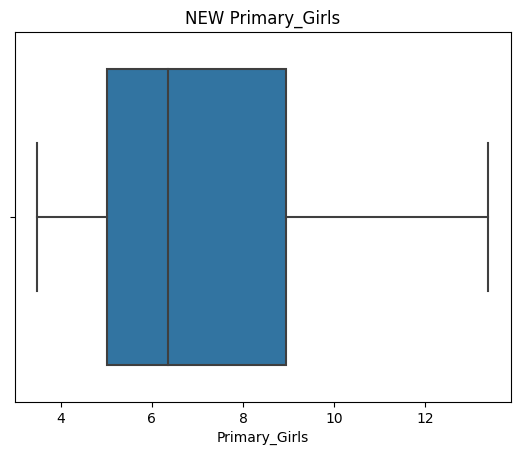

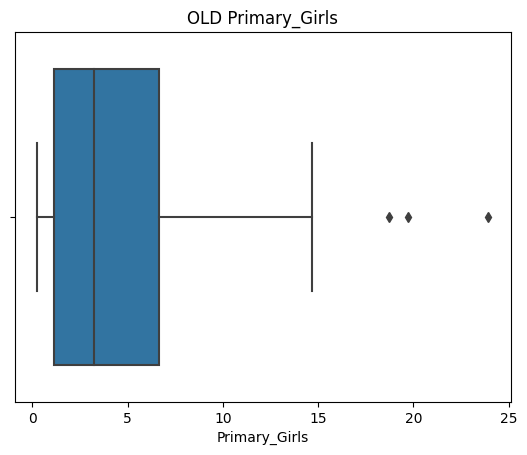

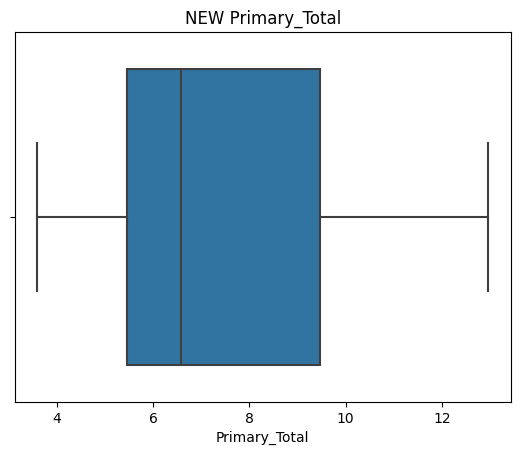

...

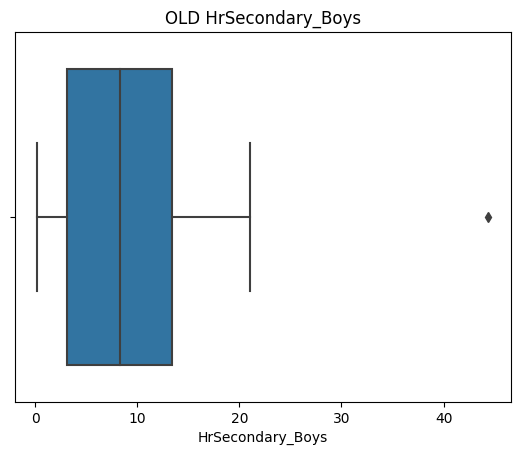

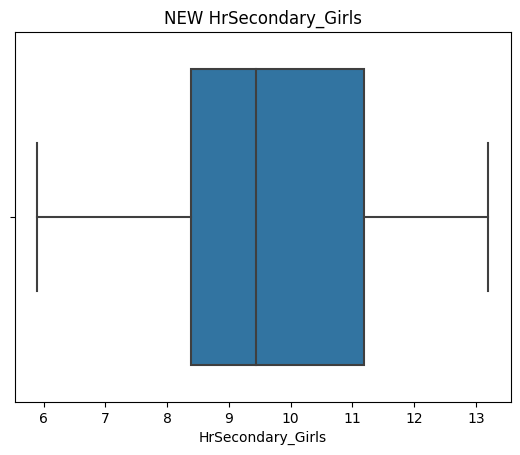

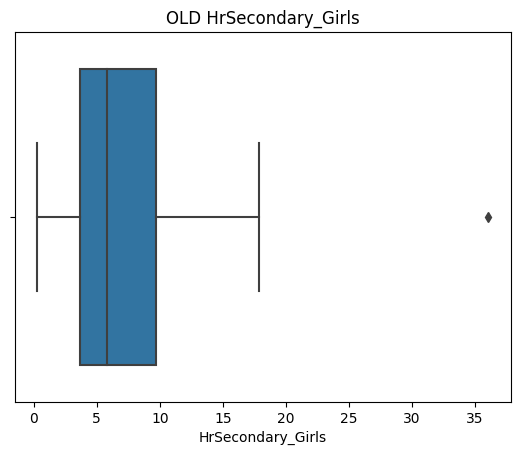

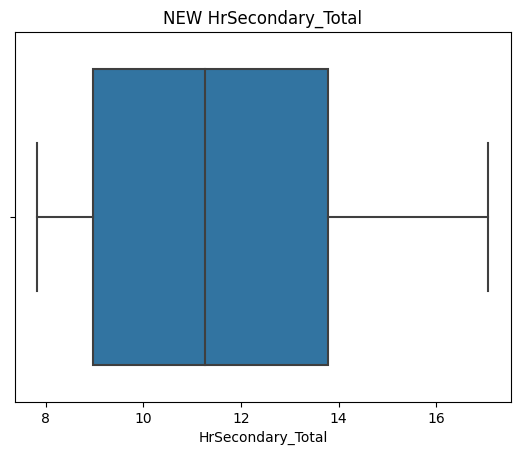

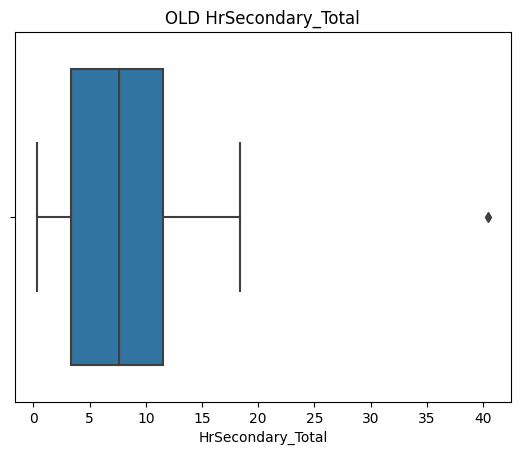

In [ ]:
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  plt.title(f"NEW {i}")
  sns.boxplot(x=percent_trim_dropout_ratio[i])
  plt.show()
  plt.title(f"OLD {i}")
  sns.boxplot(x=dropout_ratio[i])
  plt.show()

**Capping**

In [ ]:
percent_cap_dropout_ratio = dropout_ratio.copy()
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  percent_cap_dropout_ratio[i] = np.where(dropout_ratio[i] > higher_percent[index],higher_percent[index],
                                               np.where(dropout_ratio[i] < lower_percent[index],lower_percent[index],dropout_ratio[i]))

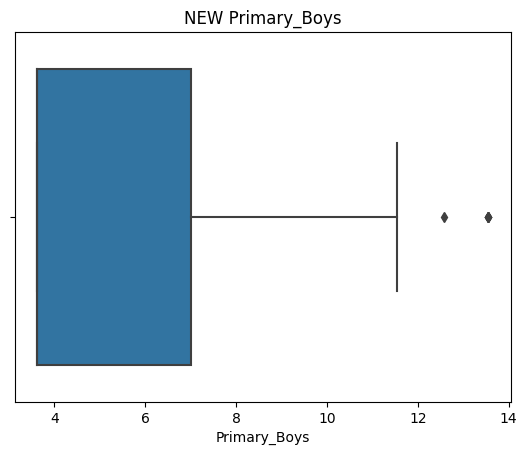

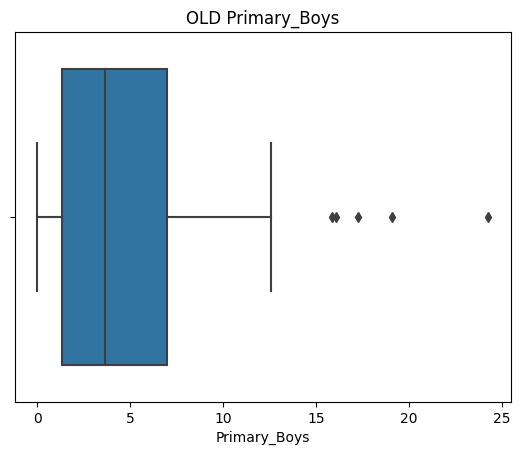

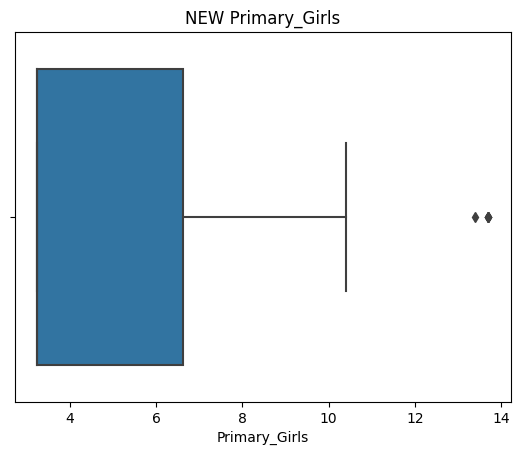

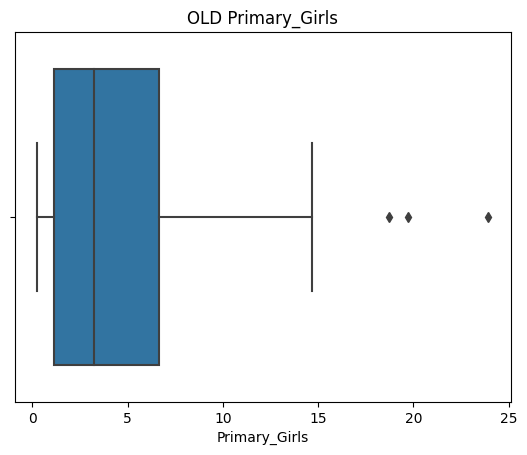

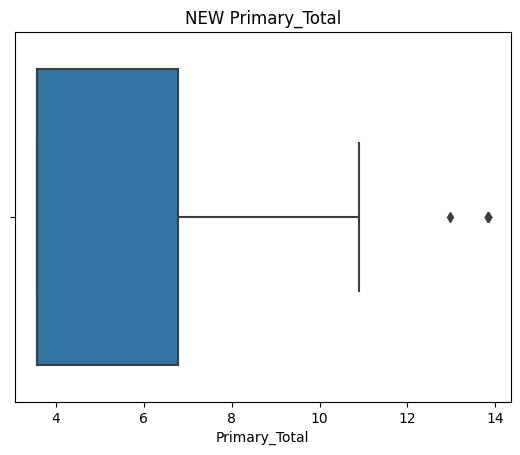

...

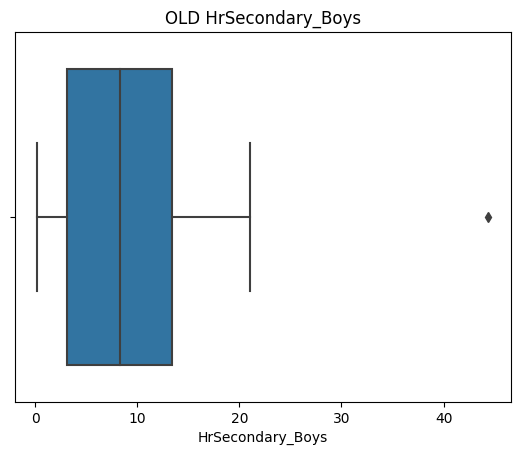

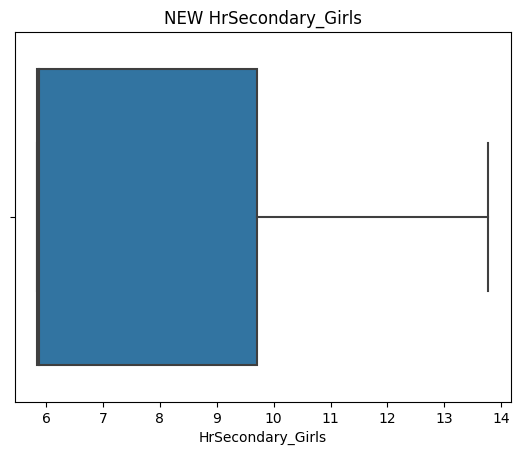

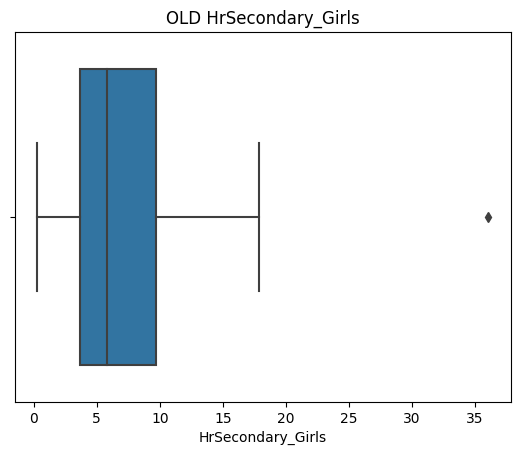

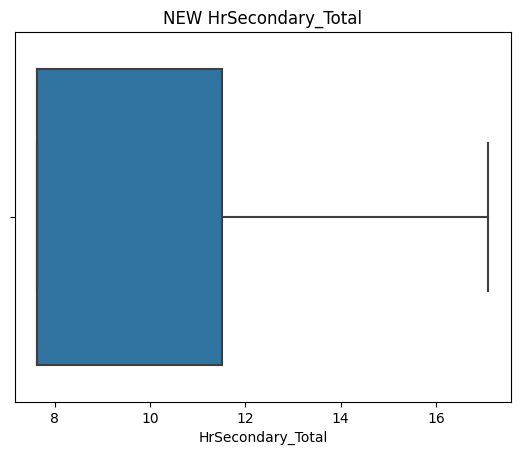

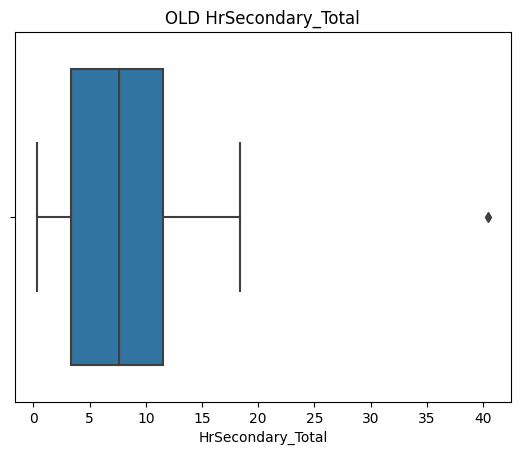

In [ ]:
for index,i in enumerate(dropout_ratio.iloc[:,2:].columns):
  plt.title(f"NEW {i}")
  sns.boxplot(x=percent_cap_dropout_ratio[i])
  plt.show()
  plt.title(f"OLD {i}")
  sns.boxplot(x=dropout_ratio[i])
  plt.show()

##Feature construction

In [ ]:
dropout_ratio.head(2)

,State_UT,year,Primary_Boys,Primary_Girls,Primary_Total,Upper Primary_Boys,Upper Primary_Girls,Upper Primary_Total,Secondary _Boys,Secondary _Girls,Secondary _Total,HrSecondary_Boys,HrSecondary_Girls,HrSecondary_Total
0,A & N Islands,2012-13,0.83,0.51,0.68,NaN,1.09,1.23,5.57,5.55,5.56,17.66,10.15,14.14
1,A & N Islands,2013-14,1.35,1.06,1.21,NaN,1.54,0.51,8.36,5.98,7.20,18.94,12.20,15.87


In [ ]:
"""
-> In feature construction we can just have the starting year like 2012 rather than 2012-13 so we can actually predict the drop ratio for given year
-> We can also say State board and CBSE(All india)
"""

'\n-> In feature construction we can just have the starting year like 2012 rather than 2012-13 so we can actually predict the drop ratio for given year\n'

In [103]:
! apt-get install git

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git is already the newest version (1:2.34.1-1ubuntu1.10).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.


In [106]:
!git init

hint: Using 'master' as the name for the initial branch. This default branch name
hint: is subject to change. To configure the initial branch name to use in all
hint: of your new repositories, which will suppress this warning, call:
hint: 
hint: 	git config --global init.defaultBranch <name>
hint: 
hint: Names commonly chosen instead of 'master' are 'main', 'trunk' and
hint: 'development'. The just-created branch can be renamed via this command:
hint: 
hint: 	git branch -m <name>
Initialized empty Git repository in /content/.git/


In [107]:
!git remote add origin git@github.com:malhar2460/Dropout_ratio_EDA.git

In [108]:
!git branch -M main

In [110]:
!git push -u origin master

error: src refspec master does not match any
error: failed to push some refs to 'github.com:malhar2460/Dropout_ratio_EDA.git'


In [123]:
!git commit -m "Commit from code 1"

Author identity unknown

*** Please tell me who you are.

Run

  git config --global user.email "you@example.com"
  git config --global user.name "Your Name"

to set your account's default identity.
Omit --global to set the identity only in this repository.

fatal: unable to auto-detect email address (got 'root@6e569a21c739.(none)')


In [127]:
!git push -u origin master

error: src refspec master does not match any
error: failed to push some refs to 'github.com:malhar2460/Dropout_ratio_EDA.git'
